## Capstone Project

>- Name: Vinayak Modgil<br>
>- Student pace: Full time<br>
>- Scheduled Project review date: <br>
>- Instructor Name: Yish Lim<br>
>- Github URL: 

## Predicting Indian Stock Market Prices
<br>
by Vinayak Modgil
<br>


## Project Description and Business Statement

What I am trying to accomplish with the project
1. Build an ML model and NN model that will predict whether a stock price will increase or decrease the next day
2. Prediction based on the closing price exchanged by the end of a certain day.
3. The price of a stock at the end of the day is different than at the beginning of the next day. I want to retreive this difference and figure out if stock price will go up or down based on previous data.
4. If model predicts that stock price will go up, buy at the end of the day and sell right away the next day.
5. Model will not be even close to 100% accuracy as this is an impossible feat. However, an accuracy of over 60% will give a net gain in the long run.

## Analysis and Methodology

> - [Data Collection](#Data-Collection)
> - [Feature Evaluation](#Feature-Evaluation)
> - [Reliance](#RELIANCE)
> - [HDFCBANK](#HDFC-BANK)
> - [Global Function](#Global-function)
> - [ADANIPLORTS](#ADANIPORTS)
> - [POWERGRID](#POWERGRID)
> - [ICICIBANK](#ICICI-BANK)
> - [KOTAKBANK](#KOTAK-BANK)
> - [ASTRAL](#ASTRAL)
> - [SUMCHEM](#SUMCHEM)
> - [BERGEPAINT](#BERGEPAINT)
> - [IGL](#IGL)
> - [KANSAINER](#KANSAINER)
> - [RELAXO](#RELAXO)
> - [CDSL](#CDSL)
> - [HDFCLIFE](#HDFCLIFE)
> - [IEX](#IEX)
> - [SIEMENS](#SIEMENS)
> - [CAMS](#CAMS)
> - [PRINCEPIPE](#PRINCEPIPE)
> - [SBICARD](#SBICARD)
> - [ROUTE](#ROUTE)

## Data Collection

In [1]:
#General packages
import os
import random
import warnings 
warnings.filterwarnings("ignore")
from random import gauss

#Data wrangling packages
import pandas as pd
from pandas.tseries.offsets import DateOffset
import numpy as np 
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
import seaborn as sns

#Statistical analysis package
import statsmodels.tsa.api as tsa
import statsmodels.api as sm
import scipy.stats as stats
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARMA
import statsmodels.api as sm
from statsmodels.tsa.statespace.sarimax import SARIMAX

#Machine Learning packages
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression

#More sklearn packages
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder

#Metrics packages
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score

#Deep Learning packages
from keras import models
from keras.models import Sequential
from keras.layers import LSTM, Conv2D, Dense, Flatten
from keras.layers import MaxPooling2D, Dropout, Activation
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16

#Hyperparameter tuning
import talos
from sklearn.model_selection import GridSearchCV

#Dl model understanding
import lime
from lime import lime_image
from lime import lime_base
from skimage.segmentation import mark_boundaries

# Created functions
import time_series_functions as tsf
import fbprophet as Prophet
import stock_prediction_algorithm as spa

Importing plotly failed. Interactive plots will not work.


In [2]:
#Import the first data
capstone_data = pd.read_csv("stock market/Nifty50_target_data.csv")
capstone_data

,Date,Symbol,Series,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
0,2007-11-27,MUNDRAPORT,EQ,440.00,770.00,1050.00,770.00,959.00,962.90,984.72,27294366,2.687719e+15,NaN,9859619.0,0.3612
1,2007-11-28,MUNDRAPORT,EQ,962.90,984.00,990.00,874.00,885.00,893.90,941.38,4581338,4.312765e+14,NaN,1453278.0,0.3172
2,2007-11-29,MUNDRAPORT,EQ,893.90,909.00,914.75,841.00,887.00,884.20,888.09,5124121,4.550658e+14,NaN,1069678.0,0.2088
3,2007-11-30,MUNDRAPORT,EQ,884.20,890.00,958.00,890.00,929.00,921.55,929.17,4609762,4.283257e+14,NaN,1260913.0,0.2735
4,2007-12-03,MUNDRAPORT,EQ,921.55,939.75,995.00,922.00,980.00,969.30,965.65,2977470,2.875200e+14,NaN,816123.0,0.2741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235187,2021-04-26,ZEEL,EQ,188.00,190.60,191.10,185.10,186.70,186.40,187.35,8542755,1.600451e+14,52374.0,2340188.0,0.2739
235188,2021-04-27,ZEEL,EQ,186.40,188.00,192.95,186.80,188.80,188.15,189.41,14247767,2.698636e+14,73673.0,5425957.0,0.3808
235189,2021-04-28,ZEEL,EQ,188.15,188.80,190.60,187.10,188.95,189.10,188.85,8429439,1.591917e+14,44056.0,2413974.0,0.2864
235190,2021-04-29,ZEEL,EQ,189.10,190.80,191.65,186.00,186.60,186.55,187.44,9483009,1.777471e+14,60932.0,2744472.0,0.2894


In [3]:
def get_data(csv_list, folder1=None):
    '''
    Merges a list of csv files and
    returns a new DataFrame containing
    all the csv files in the folder
    
    get_data -> (Args)
    csv_list: A list of csv files
    folder: Folder containing all the files
    '''
    if folder1 != None:
        #Specify the path to csv files
        stock_list = os.listdir(folder1)
        #Initialize a DataFrame
        csv_merged = pd.DataFrame()
        for stock in stock_list:
           #List of files to be merged
           csv_list.append(pd.read_csv(folder1 +"/" + stock))
        
           for csv_file in csv_list:
            
            #Add the elements of csv_list to csv_merged
               csv_merged = csv_merged.append(csv_file, ignore_index=True)
            
        # Export the data to the folder
               csv_merged.to_csv("NSE.csv", index=False)
        return csv_merged

In [4]:
NSE_data = get_data([], folder1="stock market/NSE")

In [5]:
NSE_data

,Date,Symbol,Open,High,Low,Close,Adj Close,Volume
0,19-09-2011,ASTRAL,22.200005,22.542006,22.200005,22.320005,21.962229,59949.0
1,20-09-2011,ASTRAL,22.080006,23.040005,22.080006,22.428005,22.068493,47616.0
2,21-09-2011,ASTRAL,22.536005,22.536005,21.600004,21.912004,21.560766,55383.0
3,22-09-2011,ASTRAL,22.956005,26.298006,22.956005,26.094006,25.675737,4219573.0
4,23-09-2011,ASTRAL,26.310005,27.408007,23.520004,23.820005,23.438179,1986557.0
...,...,...,...,...,...,...,...,...
160443,13-09-2021,SUMCHEM,594.000000,603.000000,592.000000,603.000000,603.000000,7153400.0
160444,14-09-2021,SUMCHEM,610.000000,615.000000,604.000000,609.000000,609.000000,9194200.0
160445,15-09-2021,SUMCHEM,598.000000,599.000000,594.000000,597.000000,597.000000,7162400.0
160446,16-09-2021,SUMCHEM,599.000000,604.000000,594.000000,604.000000,604.000000,7663700.0


In [6]:
nifty_data = get_data([], folder1="stock market/Nifty50")

In [7]:
nifty_data["Date"] = pd.to_datetime(nifty_data["Date"])
nifty_data.set_index(nifty_data["Date"], inplace=True)
nifty_data.drop("Date",axis=1, inplace=True)
nifty_data

,Symbol,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
2007-11-27,ADANIPORTS,154.000000,207.000000,154.000000,191.800003,177.675140,27262365.0
2007-11-28,ADANIPORTS,194.000000,197.800003,174.929993,177.000000,163.965073,21958915.0
2007-11-29,ADANIPORTS,181.000000,182.800003,168.460007,177.399994,164.335602,25616715.0
2007-11-30,ADANIPORTS,178.000000,191.399994,178.000000,185.800003,172.116974,23047035.0
2007-03-12,ADANIPORTS,187.949997,198.860001,184.399994,196.000000,181.565826,14578850.0
...,...,...,...,...,...,...,...
2021-09-27,RELIANCE,2487.000000,2529.899902,2475.300049,2524.449951,2524.449951,7095022.0
2021-09-28,RELIANCE,2534.000000,2564.899902,2512.800049,2548.050049,2548.050049,8323269.0
2021-09-29,RELIANCE,2570.000000,2570.000000,2520.050049,2527.850098,2527.850098,4485721.0


In [8]:
nifty_data["Close"] = nifty_data["Close"].astype("float")
nifty_data["Open"] = nifty_data["Close"].astype("float")
nifty_data["High"] = nifty_data["Close"].astype("float")
nifty_data["Low"] = nifty_data["Close"].astype("float")
nifty_data["Adj Close"] = nifty_data["Close"].astype("float")
nifty_data["Volume"] = nifty_data["Close"].astype("float")

In [9]:
NSE_data["Close"].fillna(method="bfill", inplace=True)
NSE_data["Open"].fillna(method="bfill", inplace=True)
NSE_data["High"].fillna(method="bfill", inplace=True)
NSE_data["Low"].fillna(method="bfill", inplace=True)
NSE_data["Adj Close"].fillna(method="bfill", inplace=True)
NSE_data["Volume"].fillna(method="bfill", inplace=True)

In [10]:
NSE_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 160448 entries, 0 to 160447
Data columns (total 8 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date       160448 non-null  object 
 1   Symbol     160448 non-null  object 
 2   Open       160448 non-null  float64
 3   High       160448 non-null  float64
 4   Low        160448 non-null  float64
 5   Close      160448 non-null  float64
 6   Adj Close  160448 non-null  float64
 7   Volume     160448 non-null  float64
dtypes: float64(6), object(2)
memory usage: 9.8+ MB


In [11]:
#Display the info of capstone data
capstone_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 235192 entries, 0 to 235191
Data columns (total 15 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Date                235192 non-null  object 
 1   Symbol              235192 non-null  object 
 2   Series              235192 non-null  object 
 3   Prev Close          235192 non-null  float64
 4   Open                235192 non-null  float64
 5   High                235192 non-null  float64
 6   Low                 235192 non-null  float64
 7   Last                235192 non-null  float64
 8   Close               235192 non-null  float64
 9   VWAP                235192 non-null  float64
 10  Volume              235192 non-null  int64  
 11  Turnover            235192 non-null  float64
 12  Trades              120344 non-null  float64
 13  Deliverable Volume  219115 non-null  float64
 14  %Deliverble         219115 non-null  float64
dtypes: float64(11), int64(1), object(3

In [12]:
# Descriptive stats of capstone data
capstone_data.describe()

,Prev Close,Open,High,Low,Last,Close,VWAP,Volume,Turnover,Trades,Deliverable Volume,%Deliverble
count,235192.000000,235192.000000,235192.000000,235192.000000,235192.000000,235192.000000,235192.00000,2.351920e+05,2.351920e+05,1.203440e+05,2.191150e+05,219115.000000
mean,1266.196349,1267.759708,1286.581440,1247.488465,1266.388302,1266.554351,1267.13230,3.045903e+06,1.610138e+14,6.196427e+04,1.315098e+06,0.502997
std,2581.370320,2585.259609,2619.649216,2546.621396,2581.392543,2582.140942,2582.69998,7.333981e+06,3.298085e+14,6.866457e+04,2.831670e+06,0.190019
min,0.000000,8.500000,9.750000,8.500000,9.100000,9.150000,9.21000,3.000000e+00,1.047000e+07,1.100000e+01,5.000000e+00,0.023600
25%,274.300000,275.000000,279.500000,269.600000,274.400000,274.350000,274.69750,2.190095e+05,1.612816e+13,2.183400e+04,1.253830e+05,0.364700
50%,566.500000,567.025000,576.900000,556.500000,567.000000,566.700000,566.94000,1.010938e+06,6.832603e+13,4.406800e+04,5.017560e+05,0.511000
75%,1242.200000,1243.312500,1263.000000,1221.650000,1242.900000,1242.400000,1242.66250,3.019851e+06,1.863835e+14,7.893550e+04,1.452233e+06,0.638400
max,32861.950000,33399.950000,33480.000000,32468.100000,32849.000000,32861.950000,32975.24000,4.810589e+08,3.564334e+16,1.643015e+06,2.325307e+08,1.000000


In [13]:
NSE_data.describe()

,Open,High,Low,Close,Adj Close,Volume
count,160448.000000,160448.000000,160448.000000,160448.000000,160448.000000,1.604480e+05
mean,405.327532,412.343226,398.322259,404.991766,398.856839,1.145329e+06
std,428.626164,436.954550,420.901671,428.296479,426.656009,3.513849e+06
min,12.000000,12.002500,11.502500,11.770000,11.558869,0.000000e+00
25%,144.699997,147.750031,142.300003,144.928574,140.118225,8.793300e+04
50%,269.910065,274.500000,265.200012,269.437500,264.074509,3.063680e+05
75%,518.000000,526.000000,509.649994,517.250000,510.938041,1.127008e+06
max,3975.000000,4067.399902,3888.850098,3960.449951,3960.449951,2.358938e+08


### Data Schema (capstone_data)
> - **Prev Close:** closing price of the previous trading day.
> - **Open:** first price at which a stock trades during regular market hours.
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Last:** final quoted trading price.
> - **Close:** closing price of the current trading day
> - **VWAP:** or volume-weighted average price. the average price a stock has traded at throughout the day, based on both volume and price.
> - **Volume:** the total number of shares that are actually traded.
> - **Turnover:** calculated by dividing the total number of shares traded during some period by the average number of shares outstanding for the same period.
> - **Trades:**  buying and selling shares in the secondary market on the same day.
> - **Deliverable Volume:** quantity of shares which actually move from one set of people (who had those shares in their demat account before today and are selling today)  to another set of people
> - **%Deliverable:**  Deliverable percentage is (Deliverable quantity / Traded quantity)

### Data Schema (NSE_data)
> - **Open:** first price at which a stock trades during regular market 
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Close:** closing price of the current trading day
> - **Adj Close:** adjusted closing price amends a stock's closing price to reflect that stock's value after accounting.
> - **Volume:** the total number of shares that are actually traded.

### Data Schema (nifty_data)
> - **Open:** first price at which a stock trades during regular market 
> - **High:** highest price stock reaches during market hours
> - **Low:** lowest price stock reaches during market hours
> - **Close:** closing price of the current trading day
> - **Adj Close:** adjusted closing price amends a stock's closing price to reflect that stock's value after accounting.
> - **Volume:** the total number of shares that are actually traded.

In [14]:
capstone_data["Symbol"].value_counts()

IOC           5306
CIPLA         5306
M&M           5306
ICICIBANK     5306
ONGC          5306
              ... 
MUNDRAPORT    1023
TELCO          999
KOTAKMAH       502
SSLT           388
JSWSTL         123
Name: Symbol, Length: 65, dtype: int64

In [15]:
def extract_data(df, no_of_symbols=0):
    '''
    Extracts the exact amount of stocks
    symbols required for EDA later.
    
    extract_data -> (Args)
    df - A DataFrame
    no_of_symbols - An int
    '''
    if no_of_symbols != 0:
        
        #Initialize an empty symbol_list
        symbol_list = []
        for symbol in df["Symbol"]:
            
            #Use break when the length of
            # symbol_list is equal to 
            # no_of_symbols
            if len(symbol_list) == no_of_symbols:
                break
                
            if  symbol not in symbol_list:
                #Append the symbol to the
                #symbol_list
                symbol_list.append(symbol)
    return symbol_list

In [16]:
#Extract rows needed for exploration
symbol_list = extract_data(capstone_data, no_of_symbols=50)
symbol_list = [i for i in symbol_list if i == "RELIANCE" or i =="POWERGRID" or i=="HDFCBANK" or i =="ICICIBANK" or i == "KOTAKBANK" or i == "ADANIPORTS"]

In [17]:
#Change the index to "Symbol" to extract relevant dataset
capstone_data = capstone_data.set_index("Symbol").loc[symbol_list]

In [18]:
#Set the date to datetime
capstone_data["Date"] = pd.to_datetime(capstone_data["Date"])

#Reset the index of the dataset
capstone_data.reset_index(inplace=True)

#Set the index to date for time series analysis
capstone_data.set_index("Date", inplace=True)

In [19]:
capstone_data["Symbol"].value_counts()

HDFCBANK      5306
ICICIBANK     5306
RELIANCE      5306
KOTAKBANK     4483
POWERGRID     3359
ADANIPORTS    2299
Name: Symbol, dtype: int64

In [20]:
NSE_data["Date"] = pd.to_datetime(NSE_data["Date"])
NSE_data.set_index("Date", inplace=True)

In [21]:
NSE_data

,Symbol,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
2011-09-19,ASTRAL,22.200005,22.542006,22.200005,22.320005,21.962229,59949.0
2011-09-20,ASTRAL,22.080006,23.040005,22.080006,22.428005,22.068493,47616.0
2011-09-21,ASTRAL,22.536005,22.536005,21.600004,21.912004,21.560766,55383.0
2011-09-22,ASTRAL,22.956005,26.298006,22.956005,26.094006,25.675737,4219573.0
2011-09-23,ASTRAL,26.310005,27.408007,23.520004,23.820005,23.438179,1986557.0
...,...,...,...,...,...,...,...
2021-09-13,SUMCHEM,594.000000,603.000000,592.000000,603.000000,603.000000,7153400.0
2021-09-14,SUMCHEM,610.000000,615.000000,604.000000,609.000000,609.000000,9194200.0
2021-09-15,SUMCHEM,598.000000,599.000000,594.000000,597.000000,597.000000,7162400.0


In [22]:
NSE_data["Symbol"].value_counts()

ASTRAL        34538
BERGEPAINT    32071
IGL           19736
KANSAINER     17269
RELAXO        12335
CDSL          11451
HDFCLIFE       9450
IEX            8676
SIEMENS        4934
CAMS           2844
PRINCEPIPE     2568
SUMCHEM        2467
SBICARD        1125
ROUTE           984
Name: Symbol, dtype: int64

In [23]:
capstone_data.isnull().sum()

Symbol                    0
Series                    0
Prev Close                0
Open                      0
High                      0
Low                       0
Last                      0
Close                     0
VWAP                      0
Volume                    0
Turnover                  0
Trades                11480
Deliverable Volume     1541
%Deliverble            1541
dtype: int64

In [24]:
cols_to_impute = ["Trades", "Deliverable Volume", "%Deliverble"]
impute_const_int = SimpleImputer(strategy="constant", missing_values=np.nan, fill_value=0)
capstone_data[cols_to_impute] = impute_const_int.fit_transform(capstone_data[cols_to_impute])


In [25]:
capstone_data.isnull().sum()

Symbol                0
Series                0
Prev Close            0
Open                  0
High                  0
Low                   0
Last                  0
Close                 0
VWAP                  0
Volume                0
Turnover              0
Trades                0
Deliverable Volume    0
%Deliverble           0
dtype: int64

## Stock Evaluation

(-0.049172198133260764, 1.0177863533145814)

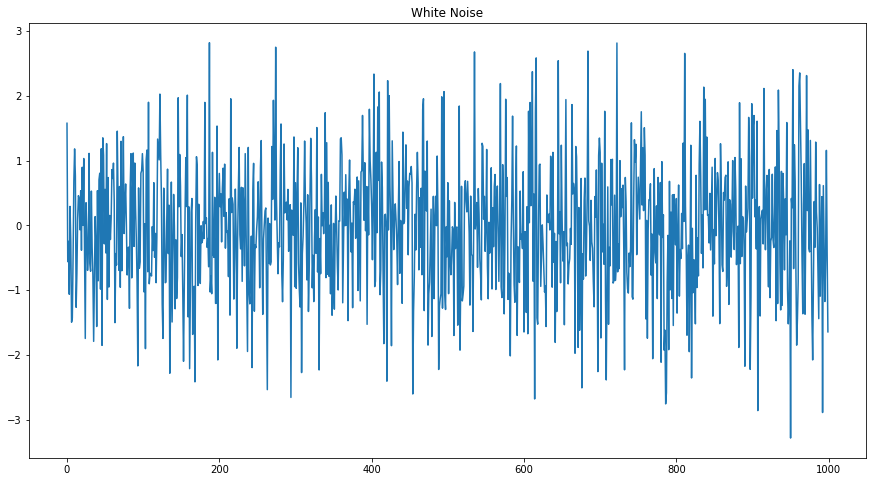

In [26]:
#White noise has mean=0, std=1
mean= 0
std = 1

#Make a white noise time series
noise = pd.Series([gauss(mean, std) for x in range(1000)])
noise.plot(title="White Noise", figsize=(15, 8))

## Check out mean and variance
noise.mean(), noise.var()

In [27]:
NSE_data["Symbol"].value_counts()

ASTRAL        34538
BERGEPAINT    32071
IGL           19736
KANSAINER     17269
RELAXO        12335
CDSL          11451
HDFCLIFE       9450
IEX            8676
SIEMENS        4934
CAMS           2844
PRINCEPIPE     2568
SUMCHEM        2467
SBICARD        1125
ROUTE           984
Name: Symbol, dtype: int64

In [28]:
nifty_data["Symbol"].value_counts()

HDFCBANK      32450
ADANIPORTS    20508
ICICIBANK     19180
KOTAKBANK     15165
POWERGRID      6908
RELIANCE       6490
Name: Symbol, dtype: int64

### RELIANCE

In [29]:
rel = nifty_data.loc[nifty_data["Symbol"] == "RELIANCE"]

In [30]:
rel["Close"].fillna(method="bfill", inplace=True)
rel["Open"].fillna(method="bfill", inplace=True)
rel["High"].fillna(method="bfill", inplace=True)
rel["Low"].fillna(method="bfill", inplace=True)
rel["Adj Close"].fillna(method="bfill", inplace=True)
rel["Volume"].fillna(method="bfill", inplace=True)

<AxesSubplot:>

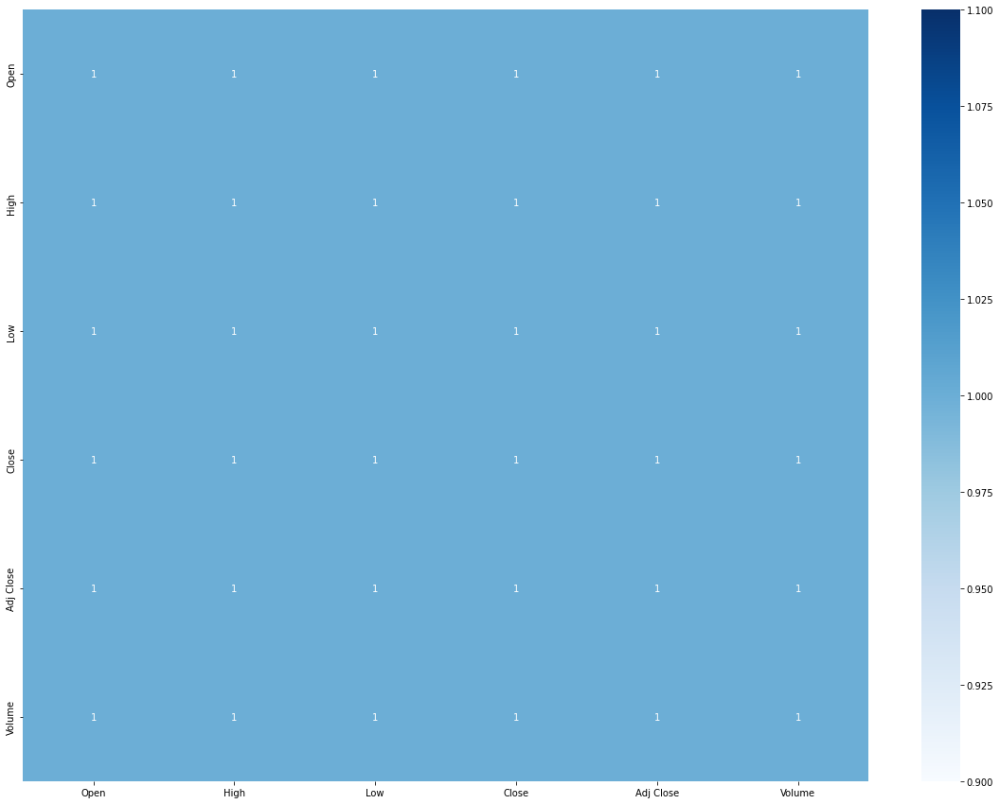

In [31]:
#Plot the heatmap of the dataset
plt.figure(figsize=(20, 15))
sns.heatmap(rel.corr(), annot=True, cmap="Blues")

#### Target Variable Evaluation

<AxesSubplot:xlabel='Date'>

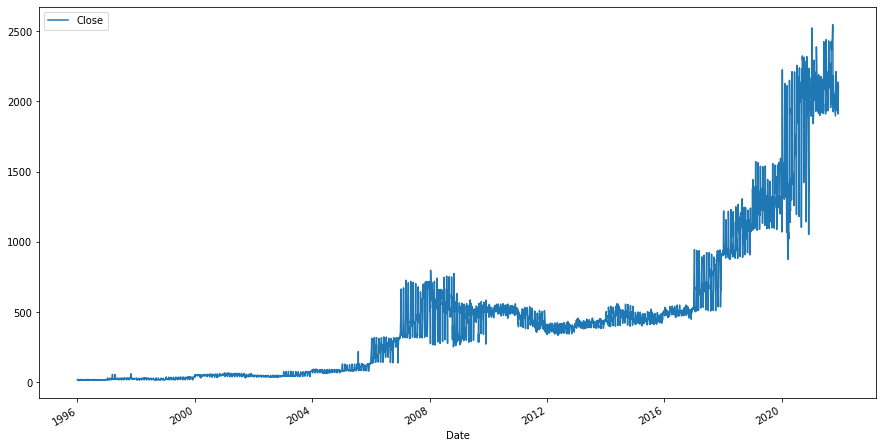

In [108]:
rel_close = rel[["Close"]]
rel_close.plot(figsize=(15, 8))

In [33]:
rel_monthly_mean = rel_close.resample("M").mean()

<AxesSubplot:xlabel='Date'>

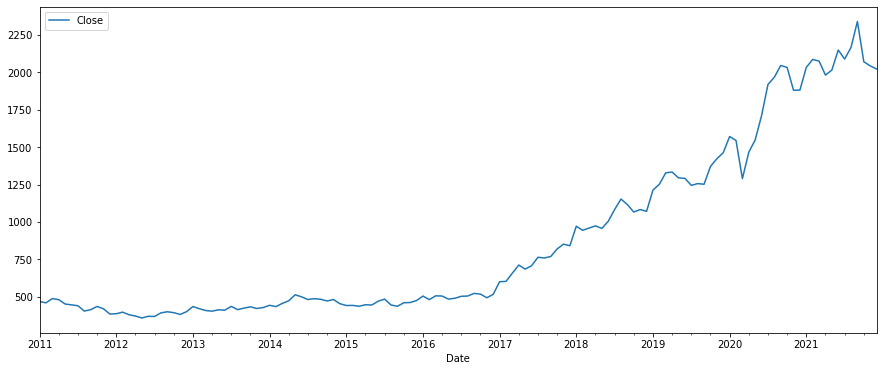

In [34]:
rel_monthly_mean.plot(figsize=(15, 6))

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,2.025776,0.998706,4,127,False,False


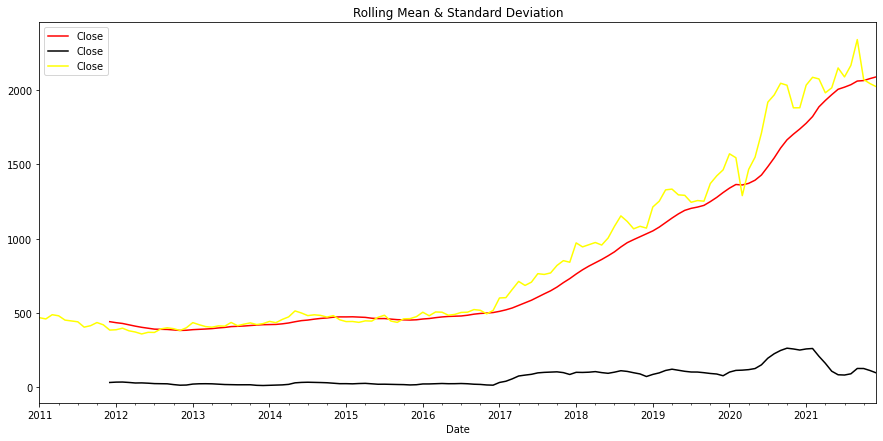

In [35]:
tsf.stationarity_check(rel_monthly_mean)

In [36]:
## Before 26-11-2009, split the stock price by 1/4
## Before 07-09-2017, split the stock price by 1/2
# rel_close[:"2009-11-27"] = rel_close[:"2009-11-27"] / 4
# rel_close["2009-11-27":"2017-09-08"] = rel_close["2009-11-27":"2017-09-08"] / 2

<Figure size 1080x504 with 0 Axes>

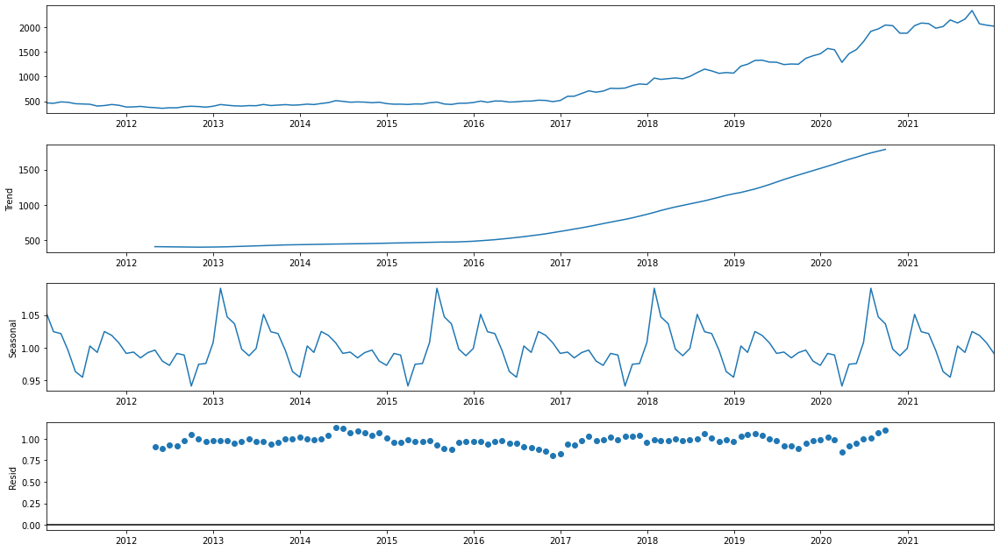

In [37]:
rel_close_decomp = seasonal_decompose(rel_monthly_mean, model="multiplicative", freq=30)
fig = plt.figure()
fig = rel_close_decomp.plot()
fig.set_size_inches(16, 9)

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


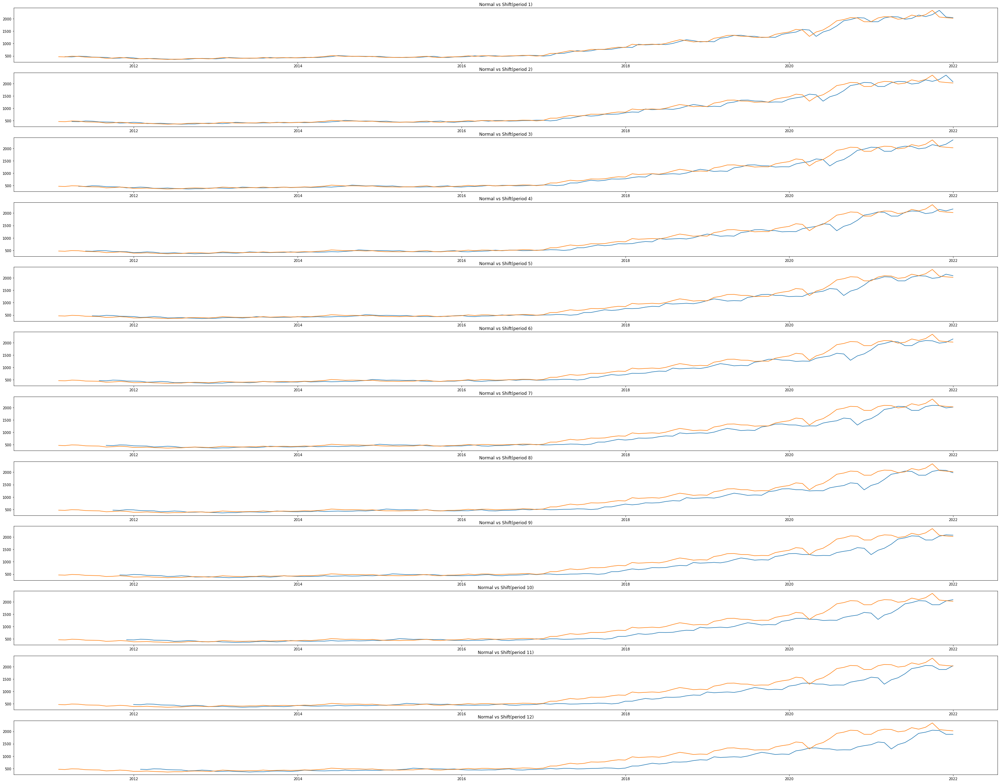

<Figure size 1080x504 with 0 Axes>

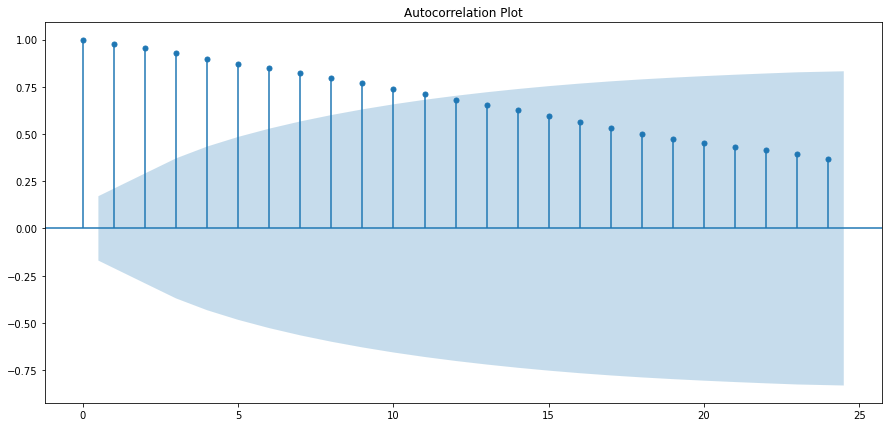

<Figure size 1080x504 with 0 Axes>

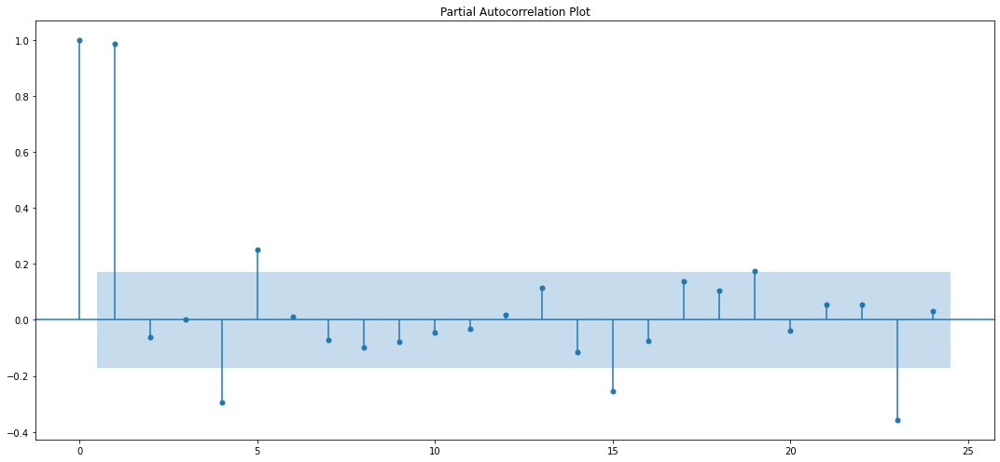

In [38]:
tsf.plot_autocorrelation(rel_monthly_mean, verbose=1)

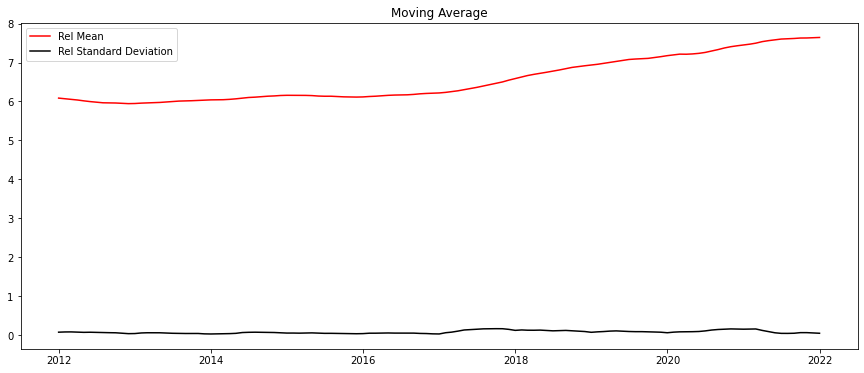

In [39]:
rcParams["figure.figsize"] = 15, 6
rel_close_log = np.log(rel_monthly_mean)
moving_avg_rel = rel_close_log.rolling(12).mean()
std_rel = rel_close_log.rolling(12).std()
plt.plot(moving_avg_rel, color="red", label="Rel Mean")
plt.plot(std_rel, color="black", label="Rel Standard Deviation")
plt.title("Moving Average")
plt.legend(loc="best")
plt.show()

#### Reliance Model

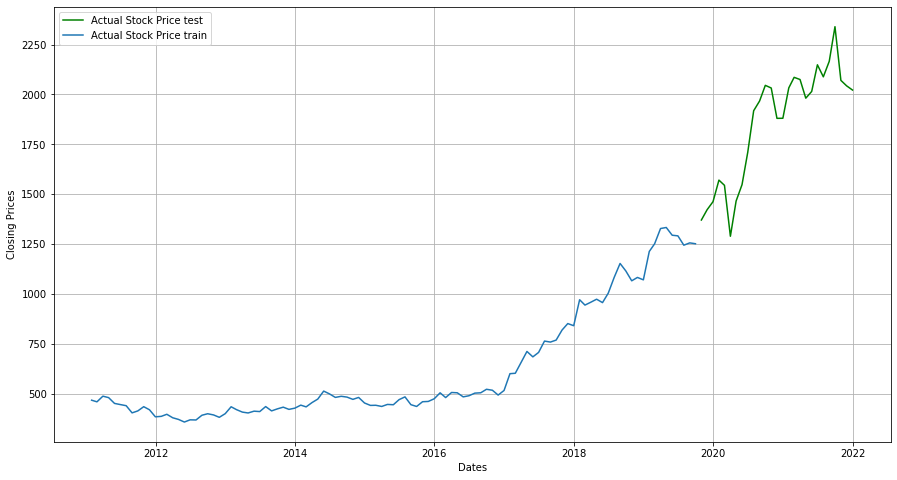

In [40]:
rel_train = rel_close_log[:int(len(rel_close_log) *0.8)]
rel_test = rel_close_log[int(len(rel_close_log) *0.8):]
fig, ax = plt.subplots(figsize=(15, 8))
ax.plot(np.exp(rel_test), color="green", label="Actual Stock Price test")
ax.plot(np.exp(rel_train), label="Actual Stock Price train")
ax.set_xlabel("Dates")
ax.set_ylabel("Closing Prices")
plt.legend(loc="best")
ax.grid(True)
plt.show()

In [41]:
rel_model, rel_fit_sarimax, rel_order, rel_seasonal_order = tsf.model_eval(rel_monthly_mean, arima=None)

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2195.5766038903457
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 2008.1037899864386
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1660.927592629325
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1473.904034729882
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1560.4346676690238
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1543.3637882567205
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1461.102763077176
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1428.7465606392836
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 2010.241914960387
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1725.5026021788246
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1522.7031006662942
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1365.5055973449596
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1472.3040108146556
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1439.8668769162175
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 137

#### ARMA model

In [42]:
rel_arma_model, rel_arma_fitted = tsf.model_eval(rel_monthly_mean, arima=1, order=rel_order)

                              ARMA Model Results                              
Dep. Variable:                  Close   No. Observations:                  132
Model:                     ARMA(0, 1)   Log Likelihood                -941.991
Method:                       css-mle   S.D. of innovations            300.763
Date:                Sun, 03 Oct 2021   AIC                           1889.983
Time:                        23:48:53   BIC                           1898.631
Sample:                    01-31-2011   HQIC                          1893.497
                         - 12-31-2021                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const         872.4107     51.445     16.958      0.000     771.581     973.240
ma.L1.Close     0.9725      0.021     47.113      0.000       0.932       1.013
                                    Roots       

In [43]:
fc, se, conf = rel_arma_fitted.forecast(len(rel_test), alpha=0.05)

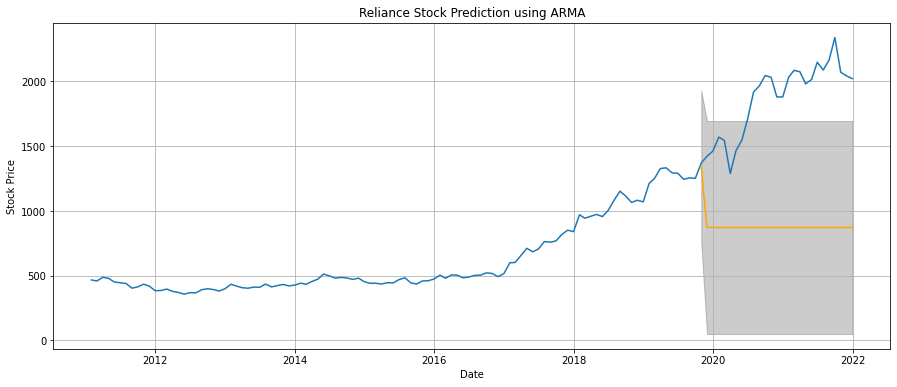

In [44]:
fc_series = pd.Series(fc, index=rel_test.index)
lower_series = pd.Series(conf[:, 0], index=rel_test.index)
upper_series = pd.Series(conf[:, 1], index=rel_test.index)
plt.plot(rel_monthly_mean, label="Actual Stock Price")
# plt.plot(rel_test, color="green", label="Actual Stock Price")
plt.plot(fc_series, color="orange", label="Predicted Stock Price")
plt.fill_between(lower_series.index, lower_series, upper_series, color="k", alpha=0.2)
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.title("Reliance Stock Prediction using ARMA")
plt.grid(True)
plt.show()

In [45]:
## Before 26-11-2009, split the stock price by 1/4
## Before 07-09-2017, split the stock price by 1/2

#### SARIMAX model

In [46]:
sarimax_rel_model_final = SARIMAX(rel_monthly_mean, order=rel_order, seasonal_order=rel_seasonal_order)
final_rel_result = sarimax_rel_model_final.fit()

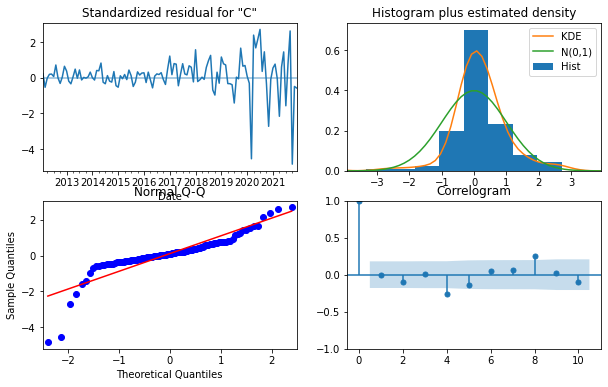

In [47]:
final_rel_result.plot_diagnostics(figsize=(10, 6))
plt.show()

##### Prediction

In [48]:
# final_fc = final_rel_result.forecast(steps=len(rel_test))
# fc_df = pd.DataFrame(final_fc)
# fc_df.reset_index(inplace=True)
# fc_df.drop("index", axis=1, inplace=True)
# fc_df.set_index(rel_test.index, inplace=True)
# fc_df

In [49]:
pred = final_rel_result.get_prediction(start=pd.to_datetime("2019-10-31"), dynamic=False)
pred_ci = pred.conf_int(alpha=0.05)
pred_df = pd.DataFrame(pred.predicted_mean)
pred_df

,predicted_mean
Date,
2019-10-31,1264.911288
2019-11-30,1381.041020
2019-12-31,1419.176157
2020-01-31,1565.325799
2020-02-29,1564.427261
2020-03-31,1579.562918
2020-04-30,1313.617123
2020-05-31,1441.419663
2020-06-30,1571.451701


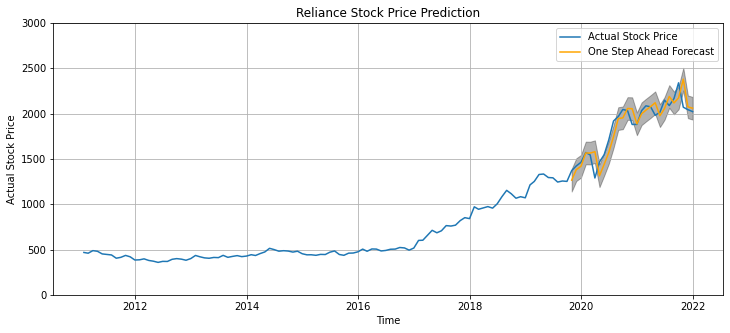

In [50]:
plt.figure(figsize=(12, 5))
plt.grid(True)
plt.plot(rel_monthly_mean, label="Actual Stock Price")
plt.plot(pred_df["predicted_mean"], color="orange",label="One Step Ahead Forecast")
plt.fill_between(pred_ci.index,pred_ci["lower Close"], pred_ci["upper Close"], color="k", alpha=0.3)
plt.title("Reliance Stock Price Prediction")
plt.ylim(0, 3000)
plt.xlabel("Time")
plt.ylabel("Actual Stock Price")
plt.legend(loc="best")
plt.show()

In [51]:
y_pred = pred.predicted_mean
y_true = rel_monthly_mean["Close"]
mse = ((y_pred - y_true) **2).mean()
print(f"The Mean Squared Error is {round(mse, 2)}")
print(f"The root Mean Squared Error is {round(np.sqrt(mse), 2)}")

The Mean Squared Error is 14605.19
The root Mean Squared Error is 120.85


##### One Step Ahead Forecast

In [52]:
forecast = final_rel_result.get_forecast(steps=1000)
forecast_ci = forecast.conf_int()
# ax = rel_test.plot(label="Observed")
# forecast.predicted_mean.plot(ax=ax, label="Forecast")
# ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 0], color="k", alpha=0.25)
# ax.set_xlabel("Date")
# ax.set_ylabel("Stock Price")
# plt.legend()
# plt.show()
dates= pd.date_range(start="2021-10-04",periods=1000, freq="B")
forecast_series = pd.Series(forecast.predicted_mean)
forecast_df = pd.DataFrame(forecast_series)
forecast_df["Dates"] = dates
forecast_df.reset_index(inplace=True)
forecast_df.drop("index", axis=1, inplace=True)
forecast_df.set_index(forecast_df["Dates"], inplace=True)
forecast_df.drop("Dates", axis=1, inplace=True)

forecast_ci["Dates"] = dates
forecast_ci.set_index("Dates", inplace=True)
forecast_df["2023"]

,predicted_mean
Dates,
2023-01-02,9684.472926
2023-01-03,9612.750557
2023-01-04,9635.877484
2023-01-05,9667.570259
2023-01-06,9776.853469
...,...
2023-12-25,15486.973710
2023-12-26,15596.256919
2023-12-27,15639.688430


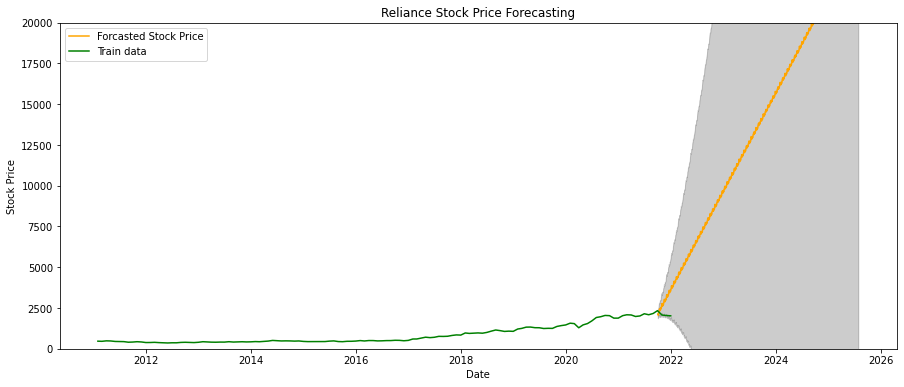

In [53]:
# list_1000_2500 = [i for i in range(1000, 2500, 250)]
req_dates = pd.date_range(start="04/01/2018", end="04/30/2022", freq="B").date
# b = "2021-07-01"
# a = "2021-05-01" 
plt.plot(forecast_df, color="orange", label="Forcasted Stock Price")
plt.plot(rel_monthly_mean, color="green", label="Train data")
# plt.axvspan(a, b, color="grey", alpha=0.2)
plt.fill_between(forecast_ci.index,forecast_ci["lower Close"], forecast_ci["upper Close"], color="k", alpha=0.2)
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.ylim(0, 20000)
plt.title("Reliance Stock Price Forecasting")
plt.legend(loc="best")
plt.show()



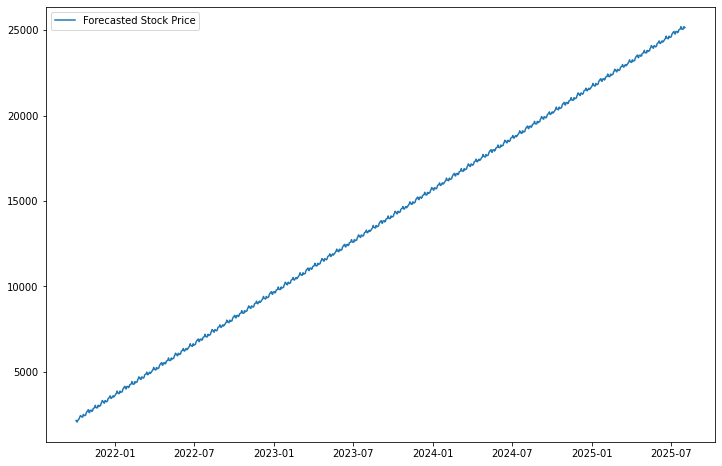

In [54]:
plt.figure(figsize=(12, 8))
plt.plot(forecast_df, label="Forecasted Stock Price")
plt.legend(loc="best")
plt.show()

#### LSTM prediction

In [55]:
rel_training_set = rel_monthly_mean[:int(len(rel_monthly_mean)*0.9)]
rel_test_set = rel_monthly_mean[int(len(rel_monthly_mean)*0.9):]

In [56]:
sc= MinMaxScaler(feature_range=(0,1))
rel_training_set_scaled = sc.fit_transform(rel_training_set)

In [57]:
X_train = []
y_train = []

for i in range(60, len(rel_training_set)):
    X_train.append(rel_training_set_scaled[i-60:i, 0])
    y_train.append(rel_training_set_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

X_train.shape

(58, 60, 1)

In [58]:
model_lstm_rel = tsf.model_stock(X_train, y_train)

Epoch 1/50
2/2 [==============================] - 13s 107ms/step - loss: 0.2077
Epoch 2/50
2/2 [==============================] - 0s 87ms/step - loss: 0.1379
Epoch 3/50
2/2 [==============================] - 0s 164ms/step - loss: 0.0657
Epoch 4/50
2/2 [==============================] - 0s 111ms/step - loss: 0.0238
Epoch 5/50
2/2 [==============================] - 0s 86ms/step - loss: 0.0388
Epoch 6/50
2/2 [==============================] - 0s 116ms/step - loss: 0.0161
Epoch 7/50
2/2 [==============================] - 0s 87ms/step - loss: 0.0180
Epoch 8/50
2/2 [==============================] - 0s 104ms/step - loss: 0.0245
Epoch 9/50
2/2 [==============================] - 0s 141ms/step - loss: 0.0201
Epoch 10/50
2/2 [==============================] - 0s 152ms/step - loss: 0.0116
Epoch 11/50
2/2 [==============================] - 0s 115ms/step - loss: 0.0084
Epoch 12/50
2/2 [==============================] - 0s 95ms/step - loss: 0.0122
Epoch 13/50
2/2 [==============================] - 0

In [59]:
model_lstm_rel.save_weights("LSTM_stocks_weights/")

In [60]:
model_lstm_rel.save("complete_LSTM_stocks_model/")

INFO:tensorflow:Assets written to: complete_LSTM_stocks_model/assets


INFO:tensorflow:Assets written to: complete_LSTM_stocks_model/assets


In [61]:
rel_LSTM_model = models.load_model("complete_LSTM_stocks_model/")

In [62]:
rel_dataset_total = pd.concat([rel_training_set, rel_test_set], axis=0)

inputs = rel_dataset_total[len(rel_dataset_total) - len(rel_test_set) - 60:].values

inputs = inputs.reshape(-1, 1)
inputs = sc.transform(inputs)

X_test = []
for i in range(60, len(inputs)):
    X_test.append(inputs[i-60:i, 0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

print(X_test.shape)

(14, 60, 1)


In [63]:
predicted_stock_price_test = model_lstm_rel.predict(X_test)
predicted_stock_price_test = sc.inverse_transform(predicted_stock_price_test)

In [64]:
predicted_stock_price_train = model_lstm_rel.predict(X_train)
predicted_stock_price_train = sc.inverse_transform(predicted_stock_price_train)

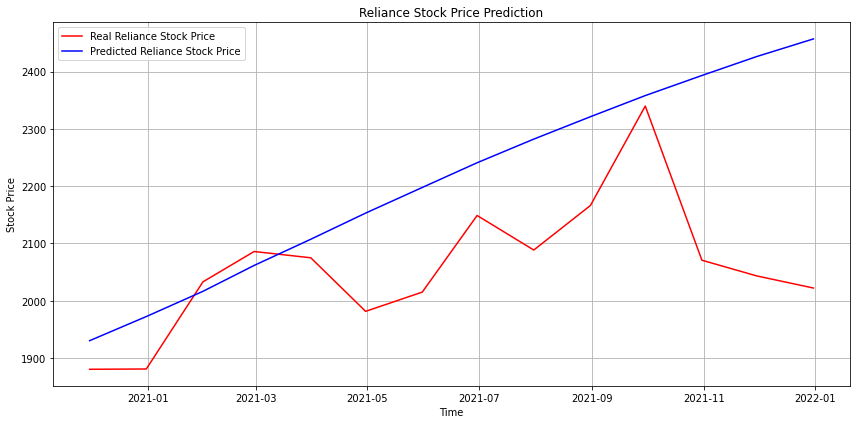

In [65]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(rel_test_set.index,rel_test_set.values, color="red", label="Real Reliance Stock Price")
ax.plot(rel_test_set.index,predicted_stock_price_test, color="blue", label="Predicted Reliance Stock Price")
ax.set_xlabel("Time")
ax.set_ylabel("Stock Price")
ax.set_title("Reliance Stock Price Prediction")
ax.legend(loc="best")
plt.tight_layout()
plt.grid()
plt.show()


In [67]:
rel_pred = pd.DataFrame(predicted_stock_price_test, index=rel_test_set.index)
rel_pred.columns = ["Predicted Closing Price"]

In [68]:
rel_pred_v_actual = pd.concat([rel_test_set, rel_pred], axis=1)
rel_pred_v_actual

,Close,Predicted Closing Price
Date,,
2020-11-30,1880.303684,1930.251343
2020-12-31,1880.811000,1972.375610
2021-01-31,2032.970000,2016.410034
2021-02-28,2085.940625,2061.600098
2021-03-31,2074.963889,2107.333252
2021-04-30,1981.444444,2152.990967
2021-05-31,2015.071053,2197.746094
2021-06-30,2148.818421,2240.893555
2021-07-31,2088.497368,2282.155029


### HDFC BANK

In [69]:
hdfc_bank = nifty_data.loc[nifty_data["Symbol"] == "HDFCBANK"]

<AxesSubplot:>

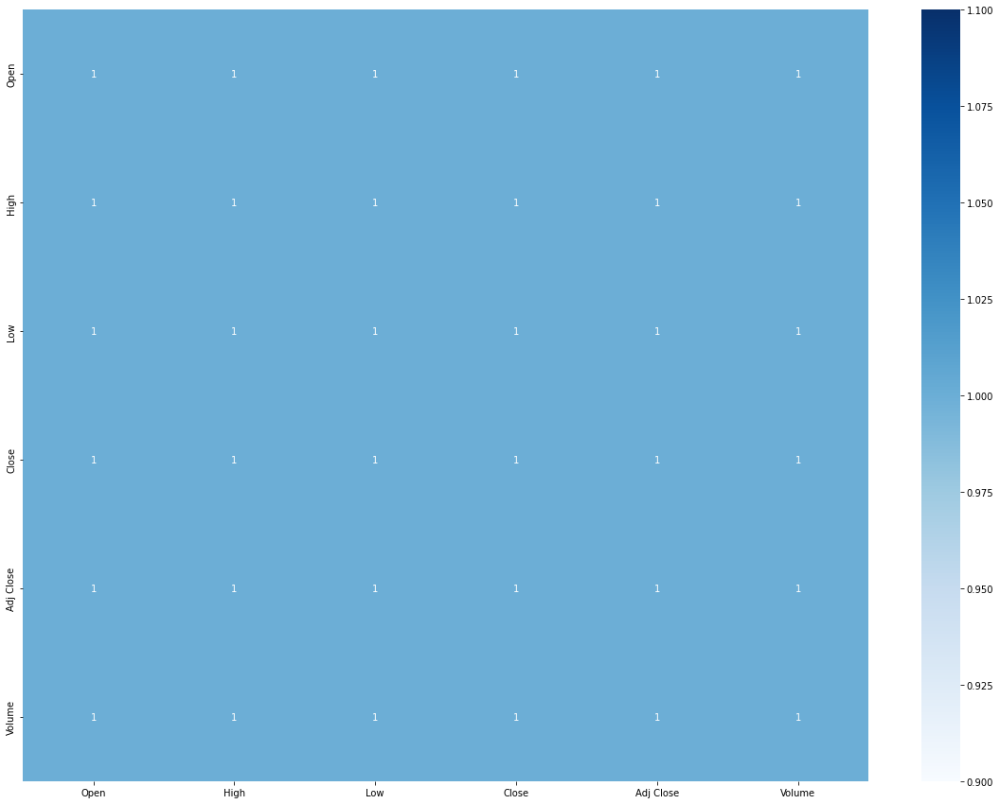

In [70]:
plt.figure(figsize=(20, 15))
sns.heatmap(hdfc_bank.corr(), annot=True, cmap="Blues")

In [71]:
hdfc_bank_close = hdfc_bank[["Close"]]
hdfc_monthly_mean = hdfc_bank_close.resample("M").mean()
hdfc_monthly_mean
# hdfc_monthly_mean = hdfc_bank_close.resample("M").mean()
# hdfc_bank_close["2011-07-10": "2012-07-20"]
# hdfc_bank_close["2019-06": "2019-12"].value_counts().index.min()

,Close
Date,
1996-01-31,2.912273
1996-02-29,3.460682
1996-03-31,3.235952
1996-04-30,3.582143
1996-05-31,3.433400
...,...
2021-08-31,1529.581581
2021-09-30,1556.661906
2021-10-31,1509.210010


In [72]:
## Split 1 (14-07-2011) - 5:1 - Before the date split the price to 1/10
## Split 2 (19-11-2019) - 2:1
# hdfc_bank_close[:"2011-07-15"] = hdfc_bank_close[:"2011-07-15"] / 10
# hdfc_bank_close["2011-07-14":"2019-09-20"] = hdfc_bank_close["2011-07-14":"2019-09-20"] / 2

#### Target Variable Evaluation

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,4.450276,1.0,11,300,False,False


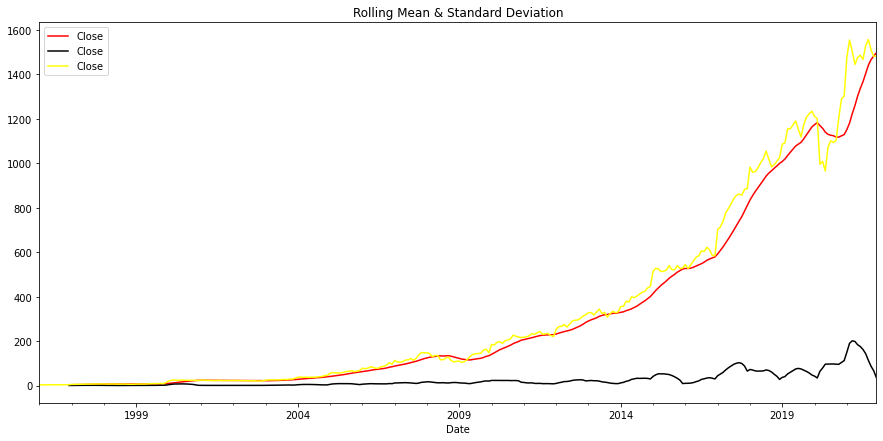

In [73]:
tsf.stationarity_check(hdfc_monthly_mean)

<Figure size 1080x504 with 0 Axes>

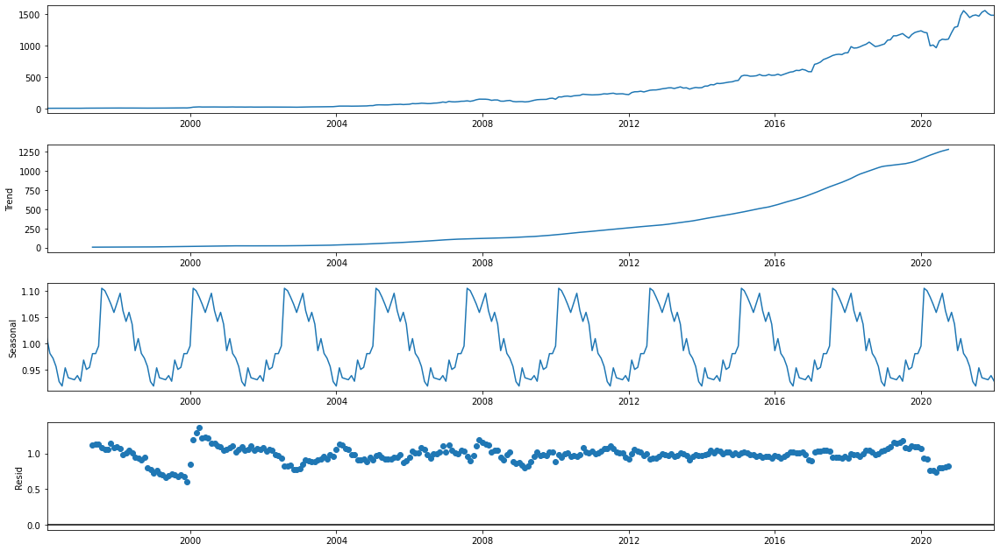

In [74]:
hdfc_seasonal_decomp = seasonal_decompose(hdfc_monthly_mean, model="multiplicative", freq=30)
fig = plt.figure()
fig = hdfc_seasonal_decomp.plot()
fig.set_size_inches(16, 9)

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


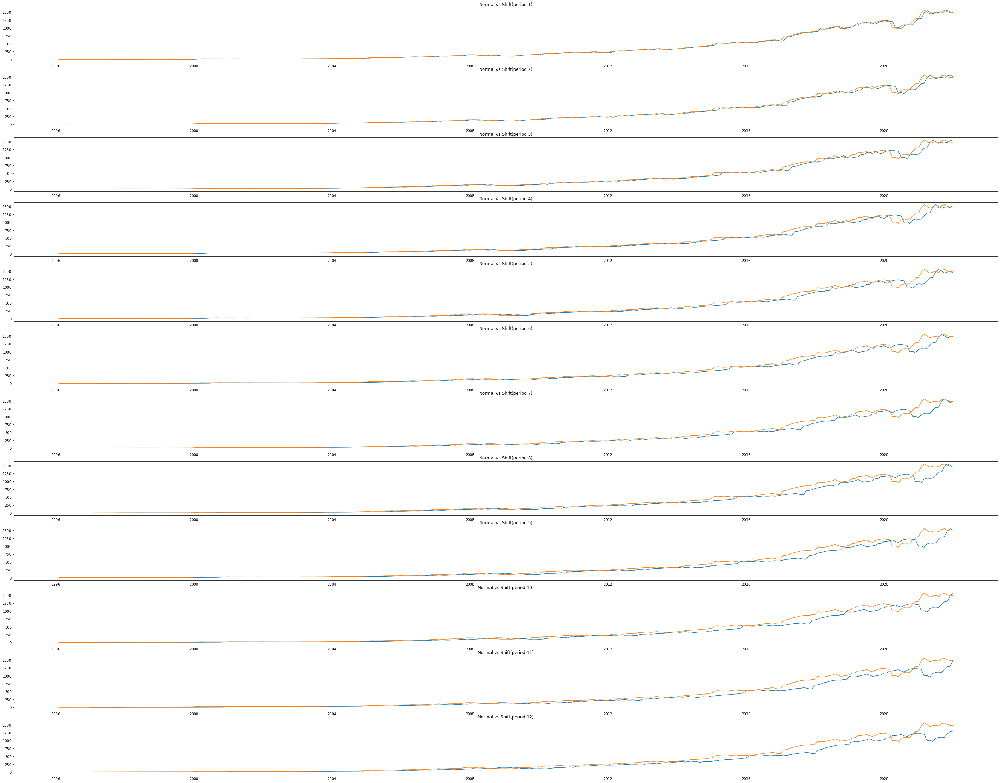

<Figure size 1080x504 with 0 Axes>

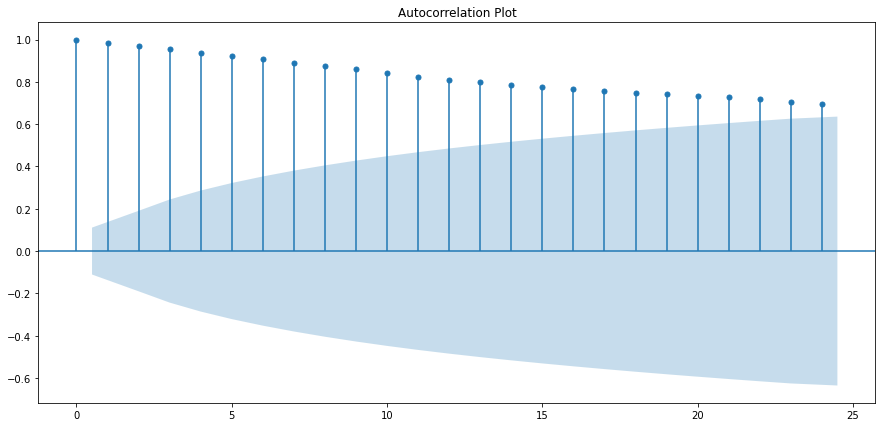

<Figure size 1080x504 with 0 Axes>

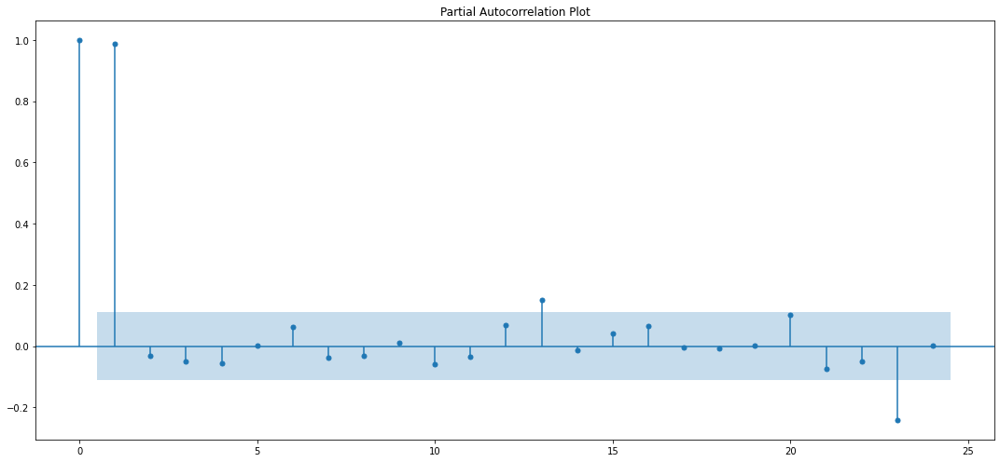

In [75]:
tsf.plot_autocorrelation(hdfc_monthly_mean, verbose=1)

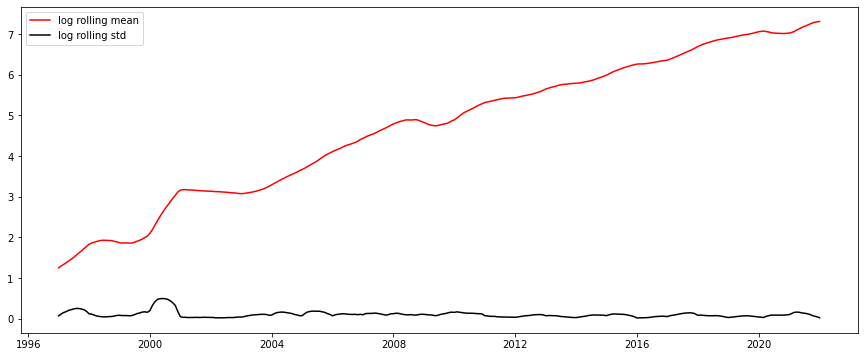

In [76]:
rcParams["figure.figsize"] = 15, 6
hdfc_close_log = np.log(hdfc_monthly_mean)
hdfc_close_log_mean = hdfc_close_log.rolling(window=12).mean()
hdfc_close_log_std = hdfc_close_log.rolling(window=12).std()
plt.plot(hdfc_close_log_mean, color="red", label="log rolling mean")
plt.plot(hdfc_close_log_std, color="black", label="log rolling std")
plt.legend(loc="best")
plt.show()


#### HDFC model

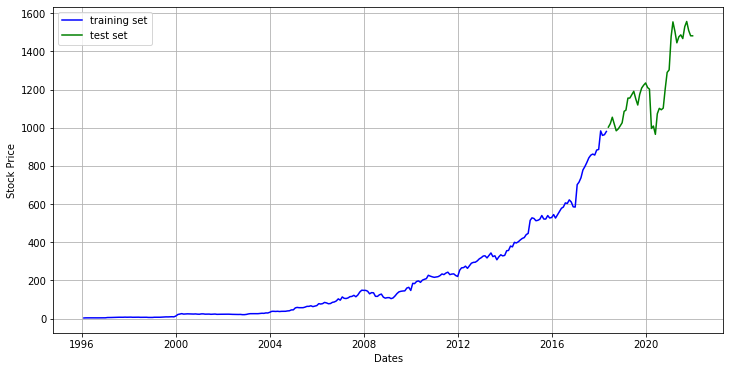

In [77]:
hdfc_training_set = hdfc_close_log[:int(len(hdfc_close_log)*0.86)]
hdfc_test_set = hdfc_close_log[int(len(hdfc_close_log)*0.86):]
fig, ax = plt.subplots(figsize=(12, 6))
ax.grid(True)
ax.plot(hdfc_training_set.index, np.exp(hdfc_training_set), color="blue", label="training set")
ax.plot(hdfc_test_set.index, np.exp(hdfc_test_set), color="green", label="test set")
ax.set_xlabel("Dates")
ax.set_ylabel("Stock Price")
ax.legend(loc="best")
plt.show()

In [78]:
hdfc_model, hdfc_fit_sarimax, hdfc_order, hdfc_seasonal_order = tsf.model_eval(hdfc_monthly_mean, arima=None)

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4802.389966444998
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 4340.903902443468
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 3682.9180388690042
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 3534.7120695047533
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 3473.356489417456
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 3371.340626831514
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 3526.302494197228
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 3370.5557204910983
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 4386.872685450089
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 3947.99471398726
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 3373.7149730086785
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 3248.277819034389
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 3235.3238827183395
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 3112.065948999456
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 3265.9682

#### ARMA model

In [79]:
arma_hdfc_model, arma_hdfc_fit = tsf.model_eval(hdfc_training_set, arima=1, order=hdfc_order)

                              ARMA Model Results                              
Dep. Variable:                  Close   No. Observations:                  268
Model:                     ARMA(0, 1)   Log Likelihood                -334.658
Method:                       css-mle   S.D. of innovations              0.840
Date:                Sun, 03 Oct 2021   AIC                            675.316
Time:                        23:50:47   BIC                            686.089
Sample:                    01-31-1996   HQIC                           679.643
                         - 04-30-2018                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
const           4.3066      0.100     42.947      0.000       4.110       4.503
ma.L1.Close     0.9590      0.011     84.582      0.000       0.937       0.981
                                    Roots       

In [80]:
fc, se, conf = arma_hdfc_fit.forecast(steps=len(hdfc_test_set), alpha=0.05)

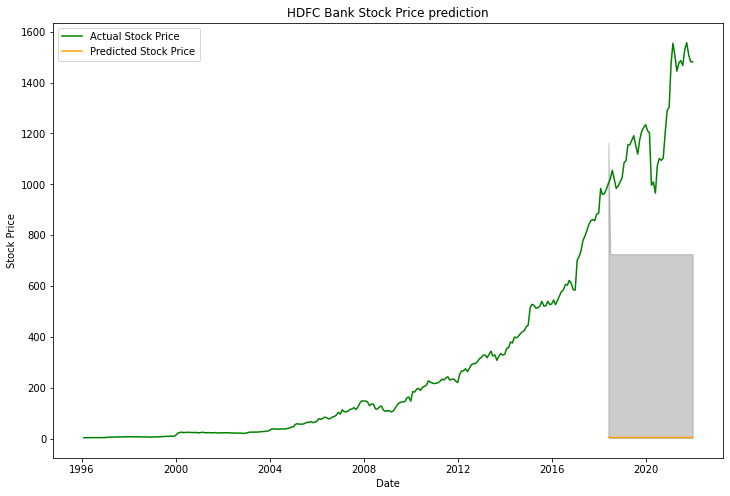

In [81]:
fc_series = pd.Series(fc, index=hdfc_test_set.index)
upper_series = pd.Series(conf[:, 1], index=hdfc_test_set.index)
lower_series = pd.Series(conf[:, 0], index=hdfc_test_set.index)
plt.figure(figsize=(12, 8))
# plt.plot(np.exp(hdfc_training_set), label="Train data")
plt.plot(hdfc_monthly_mean,color="green", label="Actual Stock Price")
plt.plot(fc_series, color="orange", label="Predicted Stock Price")
plt.fill_between(lower_series.index, lower_series, np.exp(upper_series), alpha=0.2, color="k")
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.title("HDFC Bank Stock Price prediction")
plt.legend(loc="best")
plt.show()

#### SARIMAX model

In [82]:
final_hdfc_model = SARIMAX(hdfc_monthly_mean, order=hdfc_order, seasonal_order=hdfc_seasonal_order)
final_hdfc_fit = final_hdfc_model.fit()

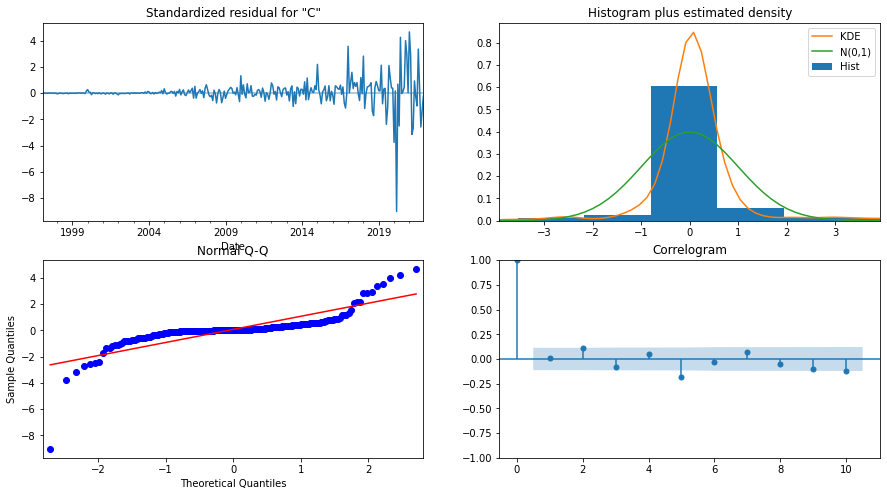

In [83]:
final_hdfc_fit.plot_diagnostics(figsize=(15, 8))
plt.show()

##### Prediction

In [84]:
hdfc_pred = final_hdfc_fit.get_prediction(start = pd.to_datetime("2019-10-31"), dynamic=False)
pred_ci = hdfc_pred.conf_int()
pred_ci


,lower Close,upper Close
Date,,
2019-10-31,1132.762919,1226.938371
2019-11-30,1165.557714,1259.733165
2019-12-31,1178.102546,1272.277997
2020-01-31,1253.510616,1347.686067
2020-02-29,1150.666420,1244.841868
2020-03-31,1165.823355,1259.998803
2020-04-30,945.078385,1039.253833
2020-05-31,978.066529,1072.241977
2020-06-30,923.505274,1017.680722


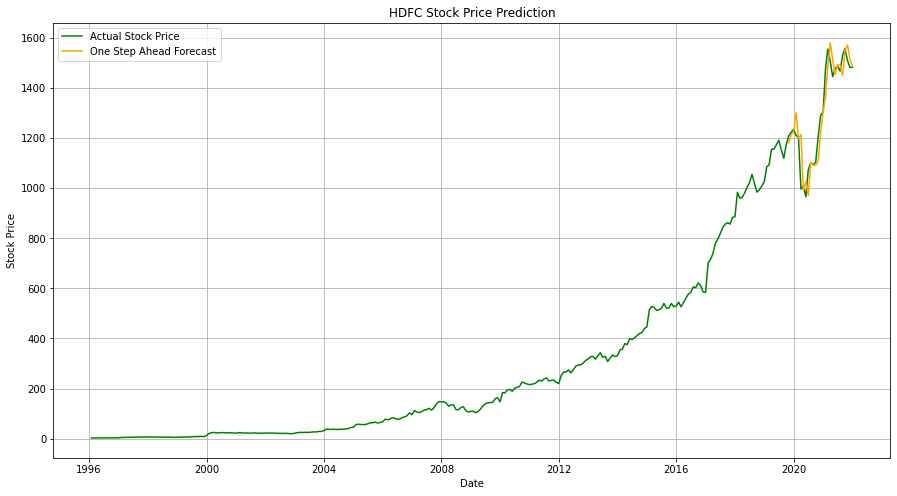

In [85]:
plt.figure(figsize=(15, 8))
plt.grid(True)
# plt.plot(np.exp(hdfc_training_set), color="blue", label="Training Set")
plt.plot(hdfc_monthly_mean, color="green", label="Actual Stock Price")
plt.plot(hdfc_pred.predicted_mean, color="orange", label="One Step Ahead Forecast")
# plt.fill_between(pred_ci.index, pred_ci["lower Close"], pred_ci["upper Close"], alpha=0.2, color="k")
# plt.yticks([x for x in range(0, 2500, 250)])
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.title("HDFC Stock Price Prediction")
plt.legend(loc="best")
plt.show()

##### One Step Ahead Forecast

In [86]:
hdfc_forecast = final_hdfc_fit.get_forecast(steps=1000)
hdfc_forecast_ci = hdfc_forecast.conf_int()

dates= pd.date_range(start="2019-10-04", periods=1000, freq="B")
hdfc_forecast_series = pd.Series(hdfc_forecast.predicted_mean)
hdfc_forecast_series
hdfc_forecast_df = pd.DataFrame(hdfc_forecast_series)
hdfc_forecast_df.reset_index(inplace=True)
hdfc_forecast_df["Dates"] = dates
hdfc_forecast_df.set_index("Dates", inplace=True)
# hdfc_forecast_df.drop("Dates",axis=1, inplace=True)
# hdfc_forecast_df
hdfc_forecast_df.drop("index", axis=1, inplace=True)

hdfc_forecast_ci["Dates"] = dates
hdfc_forecast_ci.set_index("Dates", inplace=True)

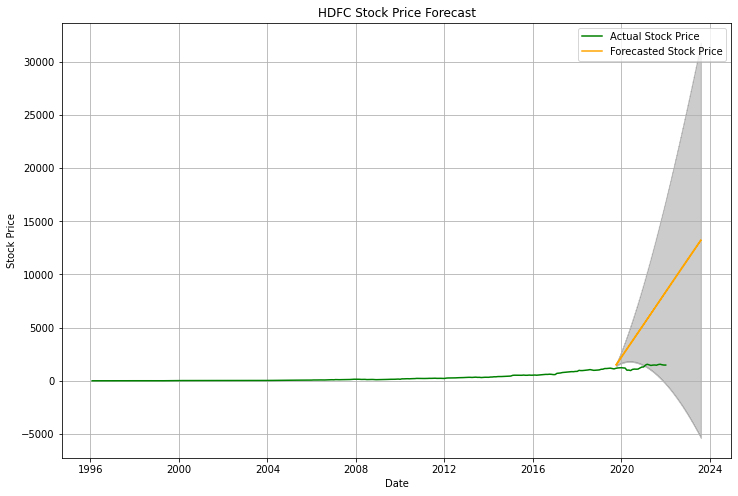

In [87]:
plt.figure(figsize=(12, 8))
a = "2021-05-01"
b = "2021-07-01"
plt.grid(True)
plt.plot(hdfc_monthly_mean, color="green", label="Actual Stock Price")
plt.plot(hdfc_forecast_df, color="orange", label="Forecasted Stock Price")
# plt.axvspan(a, b, color="grey", alpha=0.2)
plt.fill_between(hdfc_forecast_ci.index, hdfc_forecast_ci["lower Close"], hdfc_forecast_ci["upper Close"], alpha=0.2, color="k")
plt.xlabel("Date")
plt.ylabel("Stock Price")
plt.title("HDFC Stock Price Forecast")
plt.legend(loc="best")
plt.show()

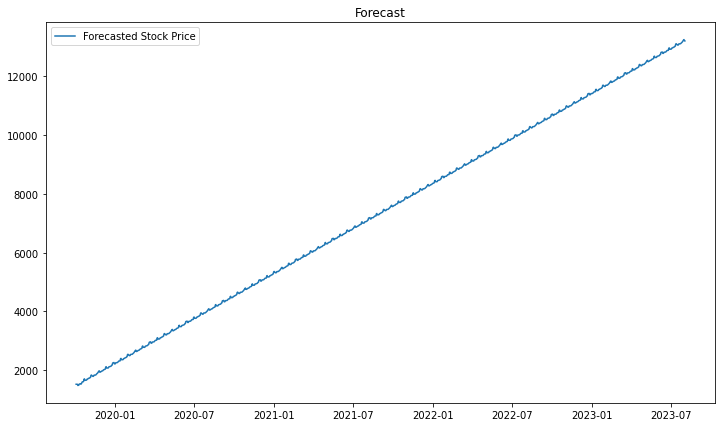

In [88]:
plt.figure(figsize=(12, 7))
plt.plot(hdfc_forecast_df, label="Forecasted Stock Price")
plt.title("Forecast")
plt.legend()
plt.show()

#### LSTM prediction

In [89]:
hdfc_train = hdfc_monthly_mean[:int(len(hdfc_monthly_mean)*0.9)]
hdfc_test = hdfc_monthly_mean[int(len(hdfc_monthly_mean)*0.9):]
sc = MinMaxScaler(feature_range=(0, 1))
hdfc_train_scaled = sc.fit_transform(hdfc_train)

In [90]:
X_train = []
y_train = []
for i in range(60, len(hdfc_train_scaled)):
    X_train.append(hdfc_train_scaled[i-60:i, 0])
    y_train.append(hdfc_train_scaled[i, 0])
X_train, y_train = np.array(X_train), np.array(y_train)

X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

X_train.shape

(220, 60, 1)

In [91]:
hdfc_model = tsf.model_stock(X_train, y_train)

Epoch 1/50
7/7 [==============================] - 14s 167ms/step - loss: 0.0590
Epoch 2/50
7/7 [==============================] - 1s 151ms/step - loss: 0.0116
Epoch 3/50
7/7 [==============================] - 1s 153ms/step - loss: 0.0040
Epoch 4/50
7/7 [==============================] - 1s 209ms/step - loss: 0.0039
Epoch 5/50
7/7 [==============================] - 2s 216ms/step - loss: 0.0022
Epoch 6/50
7/7 [==============================] - 1s 212ms/step - loss: 0.0016
Epoch 7/50
7/7 [==============================] - 1s 169ms/step - loss: 0.0012
Epoch 8/50
7/7 [==============================] - 1s 179ms/step - loss: 9.7249e-04
Epoch 9/50
7/7 [==============================] - 1s 149ms/step - loss: 0.0011
Epoch 10/50
7/7 [==============================] - 1s 157ms/step - loss: 0.0012
Epoch 11/50
7/7 [==============================] - 1s 172ms/step - loss: 0.0010
Epoch 12/50
7/7 [==============================] - 1s 168ms/step - loss: 9.2054e-04
Epoch 13/50
7/7 [=======================

In [92]:
hdfc_dataset_total = pd.concat([hdfc_train, hdfc_test], axis=0)

inputs = hdfc_dataset_total[len(hdfc_dataset_total) - len(hdfc_test) - 60:].values

inputs = inputs.reshape(-1, 1)
inputs = sc.transform(inputs)

X_test = []
for i in range(60, len(inputs)):
    X_test.append(inputs[i-60:i, 0])
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

print(X_test.shape)

(32, 60, 1)


In [93]:
hdfc_pred = hdfc_model.predict(X_test)
hdfc_pred = sc.inverse_transform(hdfc_pred)


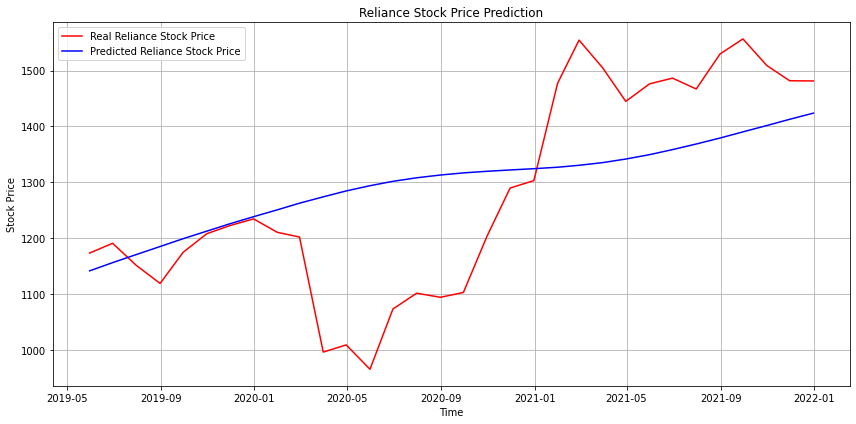

In [94]:
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(hdfc_test.index,hdfc_test.values, color="red", label="Real Reliance Stock Price")
ax.plot(hdfc_test.index,hdfc_pred, color="blue", label="Predicted Reliance Stock Price")
ax.set_xlabel("Time")
ax.set_ylabel("Stock Price")
ax.set_title("Reliance Stock Price Prediction")
ax.legend(loc="best")
plt.tight_layout()
plt.grid()
plt.show()

## Global function

In [161]:
def stock_market_prediction(df, symbol, heatmap=None,stationarity=None, decompose=None, ac=None, log_plot=None, best_params=None, arma_model=None, sarimax=None, lstm=None, test=None, date=True):
    stock_df= df.loc[df["Symbol"] == symbol]
#     stock_df["Date"] = pd.to_datetime(stock_df["Date"])
#     stock_df.set_index(stock_df["Date"], inplace=True)
#     stock_df.drop("Date", axis=1, inplace=True)

    #Plot the heatmap of the dataset
    if heatmap != None:
        plt.figure(figsize=(20, 15))
        sns.heatmap(stock_df.corr(), annot=True, cmap="Blues")
        plt.show()


    ts = stock_df[["Close"]]
    ts_monthly_mean = ts.resample("M").mean()
    ts_monthly_mean.fillna(method="bfill", inplace=True)
    
    if stationarity != None:
        tsf.stationarity_check(ts_monthly_mean)

    if decompose != None:
        if len(ts_monthly_mean) >= 60:
            ts_decomp = seasonal_decompose(ts_monthly_mean, model="multiplicative", freq=30)
            fig = plt.figure()
            fig = ts_decomp.plot()
            fig.set_size_inches(16, 9)
        else:
            ts_weekly_mean = ts.resample("W").mean()
            ts_weekly_mean.fillna(method="bfill", inplace=True)
            ts_decomp = seasonal_decompose(ts_weekly_mean, model="multiplicative", freq=30)
            fig = plt.figure()
            fig = ts_decomp.plot()
            fig.set_size_inches(16, 9)
            
        

    if ac != None:
        if len(ts_monthly_mean) >=60:
            tsf.plot_autocorrelation(ts_monthly_mean, verbose=1)
        else:
            tsf.plot_autocorrelation(ts_weekly_mean, verbose=1)
    
    if log_plot != None:
        plt.figure(figsize=(15, 7))
        ts_log = np.log(ts_monthly_mean)
        moving_avg = ts_log.rolling(12).mean()
        std= ts_log.rolling(12).std()
        plt.plot(moving_avg, color="red", label="Mean")
        plt.plot(std, color="black", label="Standard Deviation")
        plt.title("Moving Average")
        plt.legend(loc="best")
        plt.show()


# ####  Model



    ts_train = ts_log[:int(len(ts_log) *0.8)]
    ts_test = ts_log[int(len(ts_log) *0.8):]
    fig, ax = plt.subplots(figsize=(15, 8))
    ax.plot(ts_test, color="green", label="Actual Stock Price")
    ax.plot(ts_train, label="train data")
    ax.set_xlabel("Dates")
    ax.set_ylabel("Closing Prices")
    plt.legend(loc="best")
    ax.grid(True)
    plt.show()

    if best_params != None:
        ts_model, ts_fit_sarimax, order, seasonal_order= tsf.model_eval(ts_monthly_mean, arima=None)
        
#     if arma_model != None:
#         ts_arma_model, ts_arma_fitted = tsf.model_eval(ts_monthly_mean, arima=1, order= (1,1))
#         fc, se, conf = ts_arma_fitted.forecast(len(ts_test), alpha=0.05)


#     fc_series = pd.Series(fc, index=ts_monthly_mean.index)
#     lower_series = pd.Series(conf[:, 0], index=ts_monthly_mean.index)
#     upper_series = pd.Series(conf[:, 1], index=ts_monthly_mean.index)
#     plt.plot(ts_monthly_mean, label="train data")
# #     plt.plot(np.exp(ts_test), color="green", label="Actual Stock Price")
#     plt.plot(fc_series, color="orange", label="Predicted Stock Price")
#     plt.fill_between(lower_series.index, lower_series, upper_series, color="k", alpha=0.2)
#     plt.xlabel("Date")
#     plt.ylabel("Stock Price")
#     plt.title("Stock Prediction using ARMA")
#     plt.show()


# #### SARIMAX model

    if sarimax != None:

        sarimax_model_final = SARIMAX(ts_monthly_mean, order=order, seasonal_order=seasonal_order)
        final_result = sarimax_model_final.fit()
        

    final_result.plot_diagnostics(figsize=(10, 6))
    plt.show()


# ##### Prediction


# final_fc = final_rel_result.forecast(steps=len(rel_test))
# fc_df = pd.DataFrame(final_fc)
# fc_df.reset_index(inplace=True)
# fc_df.drop("index", axis=1, inplace=True)
# fc_df.set_index(rel_test.index, inplace=True)
# fc_df

    if date:
        pred = final_result.get_prediction(start=pd.to_datetime("2019-10-31"), dynamic=False)
        pred_ci = pred.conf_int(alpha=0.05)
    else:
        pred = final_result.get_prediction(start=pd.to_datetime("2020-04-01"), dynamic=False)
        pred_ci = pred.conf_int(alpha=0.05)



    plt.figure(figsize=(12, 5))
    plt.grid(True)
    plt.plot(ts_monthly_mean, label="Actual Stock Price")
#     plt.plot(np.exp(ts_test), color="green", label="Test Data")
    plt.plot(pred.predicted_mean, label="Predicted Stock Price")
    plt.fill_between(pred_ci.index, pred_ci["lower Close"], pred_ci["upper Close"], color="k", alpha=0.3)
    plt.title(f"{symbol} Stock Price Prediction")
    plt.xlabel("Time")
    plt.ylabel("Actual Stock Price")
    plt.legend(loc="best")
    plt.show()




    y_pred = pred.predicted_mean
    y_true = ts_monthly_mean["Close"]
    mse = ((y_pred - y_true) **2).mean()
    print(f"The Mean Squared Error is {round(mse, 2)}")
    print(f"The root Mean Squared Error is {round(np.sqrt(mse), 2)}")


# ##### One Step Ahead Forecast



    forecast = final_result.get_forecast(steps=1000)
    pred_ci = forecast.conf_int()
# ax = rel_test.plot(label="Observed")
# forecast.predicted_mean.plot(ax=ax, label="Forecast")
# ax.fill_between(pred_ci.index, pred_ci.iloc[:, 0], pred_ci.iloc[:, 0], color="k", alpha=0.25)
# ax.set_xlabel("Date")
# ax.set_ylabel("Stock Price")
# plt.legend()
# plt.show()
    dates= pd.date_range(start="2019-10-31", periods= 1000, freq="B")
    forecast_series = pd.Series(forecast.predicted_mean)
    forecast_df = pd.DataFrame(forecast_series)
    forecast_df["Dates"] = dates
    forecast_df.reset_index(inplace=True)
    forecast_df.drop("index", axis=1, inplace=True)
    forecast_df.set_index(forecast_df["Dates"], inplace=True)
    forecast_df.drop("Dates",axis=1, inplace=True)

    pred_ci["Dates"] = dates
    pred_ci.set_index("Dates", inplace=True)


# list_1000_2500 = [i for i in range(1000, 2500, 250)]
    req_dates = pd.date_range(start="04/01/2018", end="04/30/2022", freq="B").date
# b = "2021-07-01"
# a = "2021-05-01" 
    plt.plot(forecast_df, color="orange", label="Forcasted Stock Price")
    plt.plot(ts_monthly_mean, color="green", label="Actual Stock Price")
#     plt.plot(np.exp(ts_test), color="blue", label="Actual Stock Price")
    # plt.axvspan(a, b, color="grey", alpha=0.2)
    plt.fill_between(pred_ci.index,pred_ci["lower Close"], pred_ci["upper Close"], alpha=0.2, color="k")
# plt.yticks(list_1000_2500)
    plt.grid(True)
    plt.xlabel("Date")
    plt.ylabel("Stock Price")
    plt.legend(loc="best")
    plt.title(f"{symbol} Forecast")
    plt.show()




    plt.figure(figsize=(12, 8))
    plt.plot(forecast_df, label="Forecasted Stock Price")
    plt.legend(loc="best")
    plt.show()


# #### LSTM prediction

    if lstm != None:

        ts_training_set = ts_monthly_mean[:int(len(ts_log)*0.9)]
        ts_test_set = ts_monthly_mean[int(len(ts_log)*0.9):]


        sc= MinMaxScaler(feature_range=(0,1))
        ts_training_set_scaled = sc.fit_transform(ts_training_set)


        X_train = []
        y_train = []
        for i in range(60, len(ts_training_set_scaled)):
            X_train.append(ts_training_set_scaled[i-60:i, 0])
            y_train.append(ts_training_set_scaled[i, 0])
            
        X_train, y_train = np.array(X_train), np.array(y_train)
        X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))



        model_lstm_ts = tsf.model_stock(X_train, y_train)

        if test != None:
            X_test = []
            ts_dataset_total = pd.concat([ts_training_set, ts_test_set], axis=0)

            inputs = ts_dataset_total[len(ts_dataset_total) - len(ts_test_set) - 60:].values

            inputs = inputs.reshape(-1, 1)
            inputs = sc.transform(inputs)

            X_test = []
            for i in range(60, len(inputs)):
                X_test.append(inputs[i-60:i, 0])
            X_test = np.array(X_test)
            X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))

                            
    


            predicted_stock_price_test = model_lstm_ts.predict(X_test)
            predicted_stock_price_test = sc.inverse_transform(predicted_stock_price_test)




    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(ts_test_set.index,ts_test_set, color="red", label=f"Real {symbol} Stock Price")
    ax.plot(ts_test_set.index,predicted_stock_price_test, color="blue", label=f"Predicted {symbol} Stock Price")
    ax.set_xlabel("Time")
    ax.set_ylabel("Stock Price")
    ax.set_title(f"{symbol} Stock Price Prediction")
    ax.legend(loc="best")
    plt.tight_layout()
    plt.show()
    
    return

### ADANIPORTS

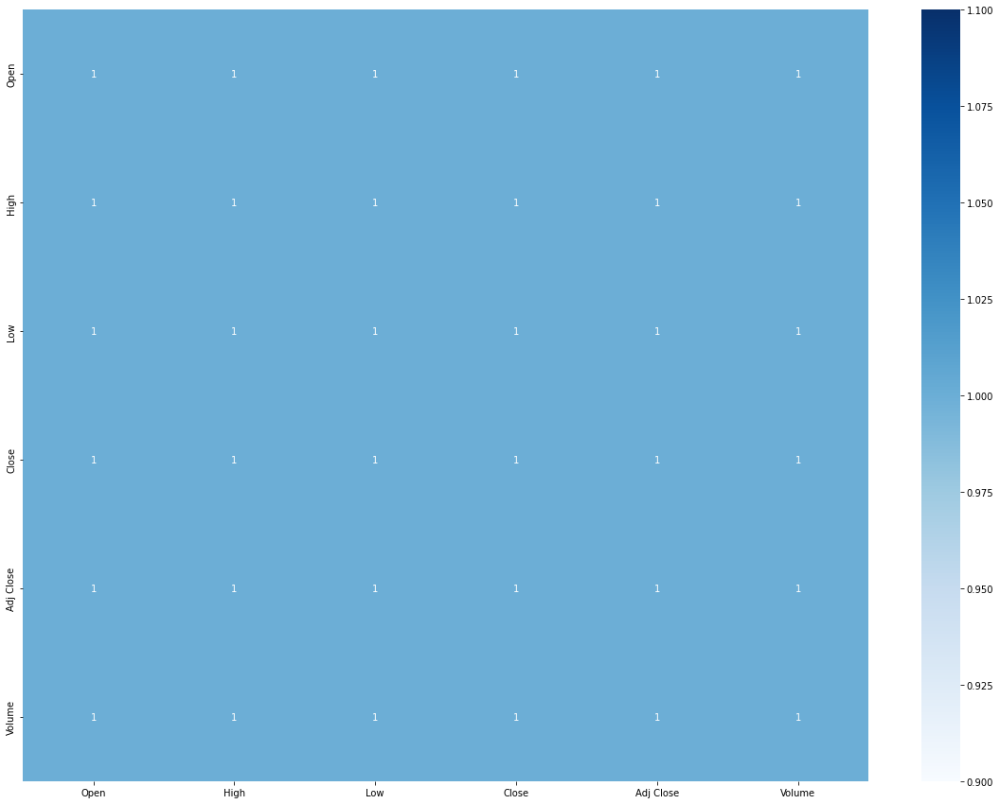

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,0.165612,0.970266,1,176,False,False


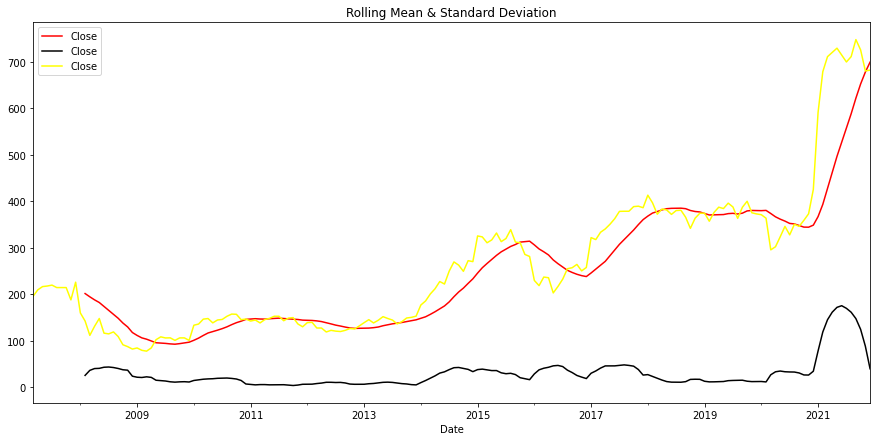

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

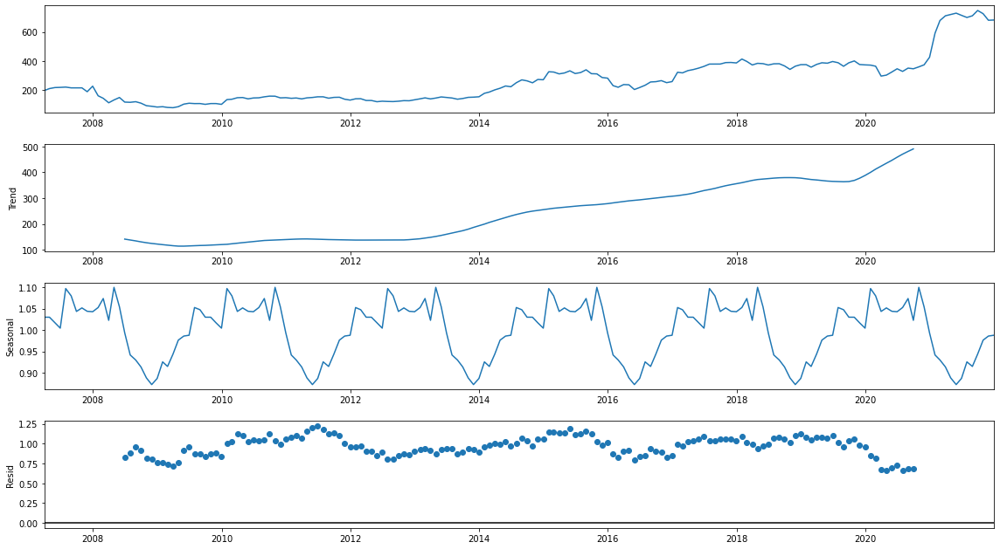

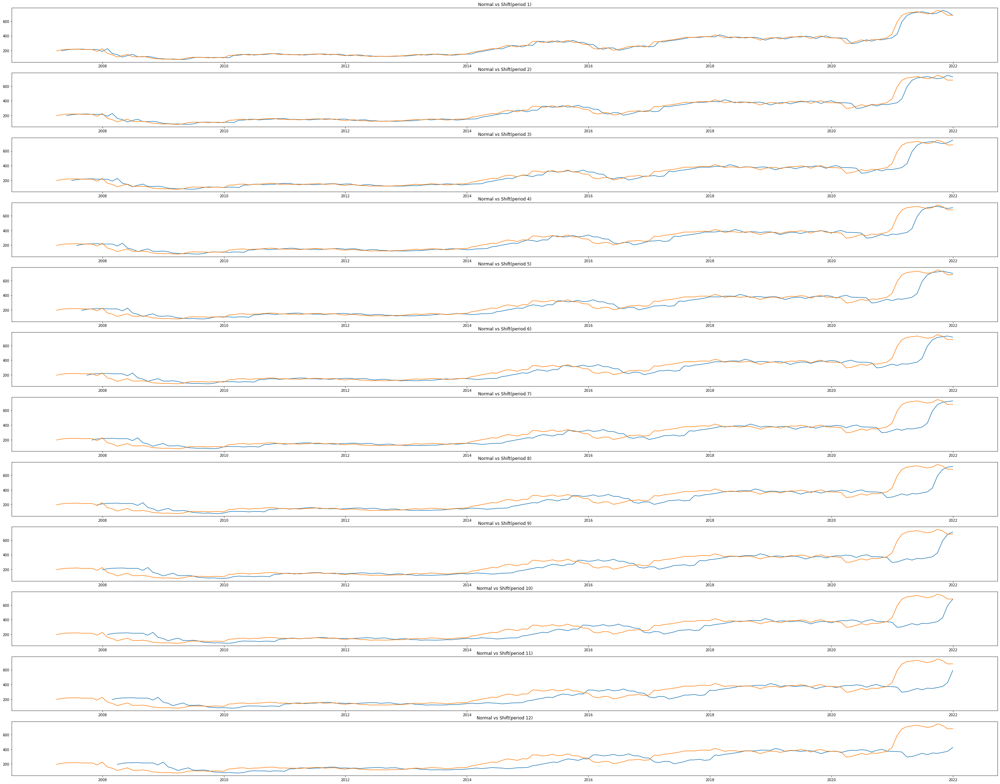

<Figure size 1080x504 with 0 Axes>

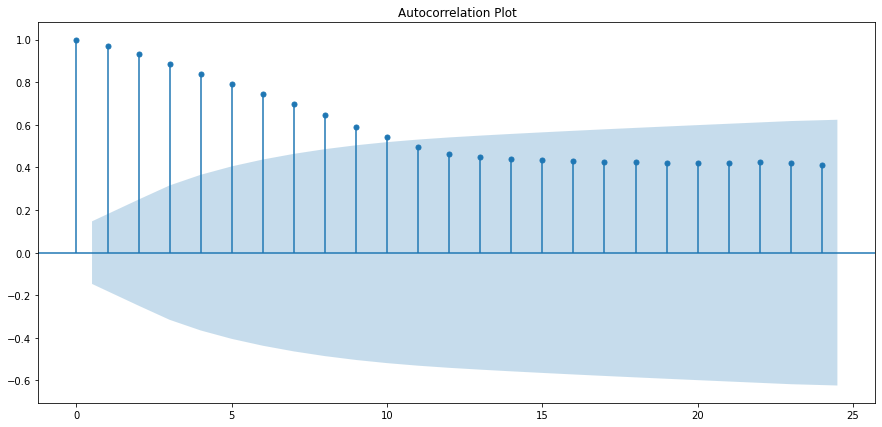

<Figure size 1080x504 with 0 Axes>

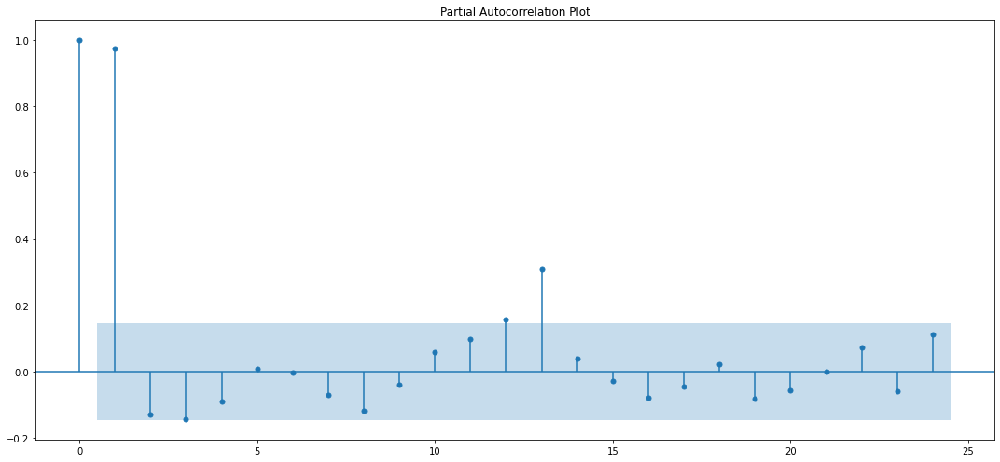

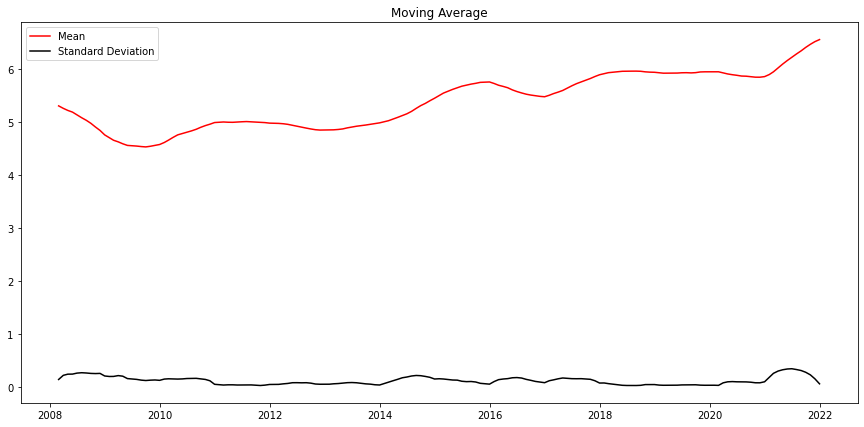

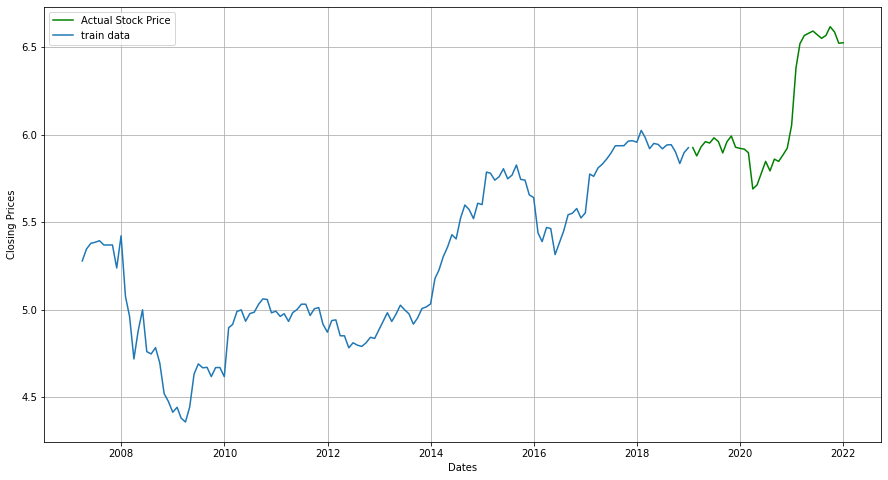

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2530.4937177964566
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 2370.553430821997
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 2037.5060044489267
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1888.617955193747
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2032.6437205242166
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1942.6860843295028
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1898.7541608890338
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1888.4891948258069
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 2286.4219407879978
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 2146.1967358747756
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1847.5220167178545
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1703.0781284329041
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1862.5394785205538
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1759.4486235108443
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1

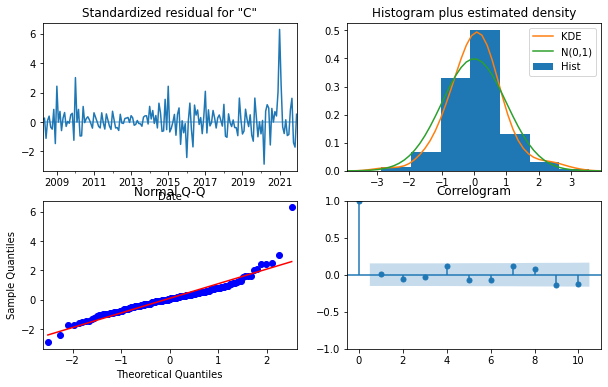

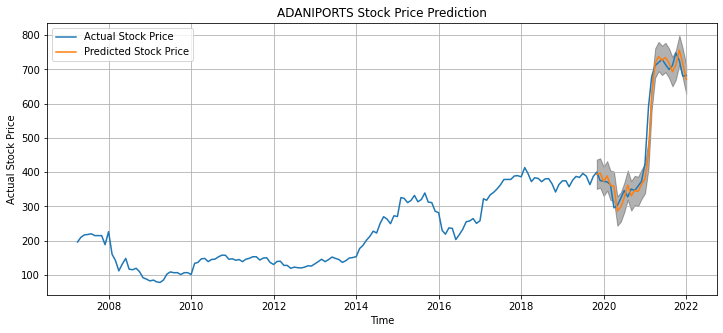

The Mean Squared Error is 1381.25
The root Mean Squared Error is 37.17


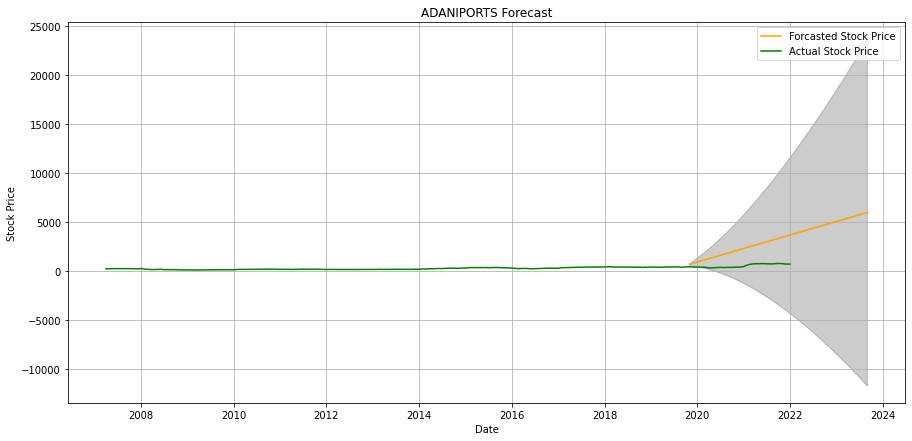

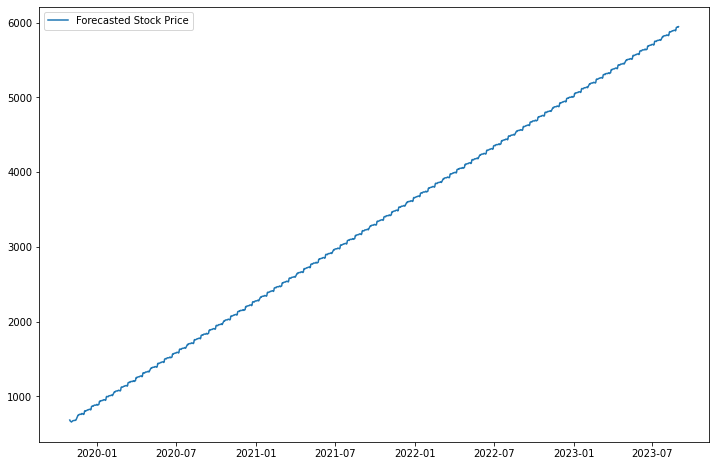

Epoch 1/50
4/4 [==============================] - 12s 222ms/step - loss: 0.3578
Epoch 2/50
4/4 [==============================] - 1s 221ms/step - loss: 0.0502
Epoch 3/50
4/4 [==============================] - 1s 205ms/step - loss: 0.0402
Epoch 4/50
4/4 [==============================] - 1s 202ms/step - loss: 0.0536
Epoch 5/50
4/4 [==============================] - 1s 194ms/step - loss: 0.0386
Epoch 6/50
4/4 [==============================] - 1s 204ms/step - loss: 0.0343
Epoch 7/50
4/4 [==============================] - 1s 183ms/step - loss: 0.0344
Epoch 8/50
4/4 [==============================] - 1s 230ms/step - loss: 0.0302
Epoch 9/50
4/4 [==============================] - 1s 240ms/step - loss: 0.0297
Epoch 10/50
4/4 [==============================] - 1s 238ms/step - loss: 0.0288
Epoch 11/50
4/4 [==============================] - 1s 212ms/step - loss: 0.0273
Epoch 12/50
4/4 [==============================] - 1s 182ms/step - loss: 0.0261
Epoch 13/50
4/4 [==============================]

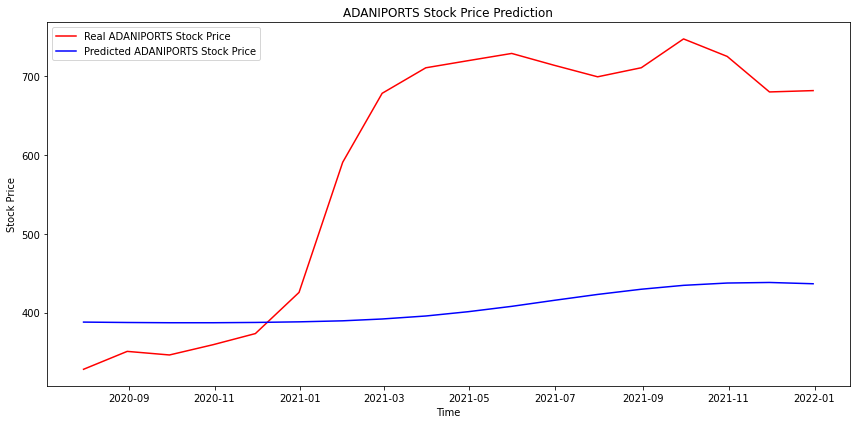

In [122]:
stock_market_prediction(nifty_data,symbol="ADANIPORTS",heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1,sarimax=1, lstm=1, test=1)

### POWERGRID

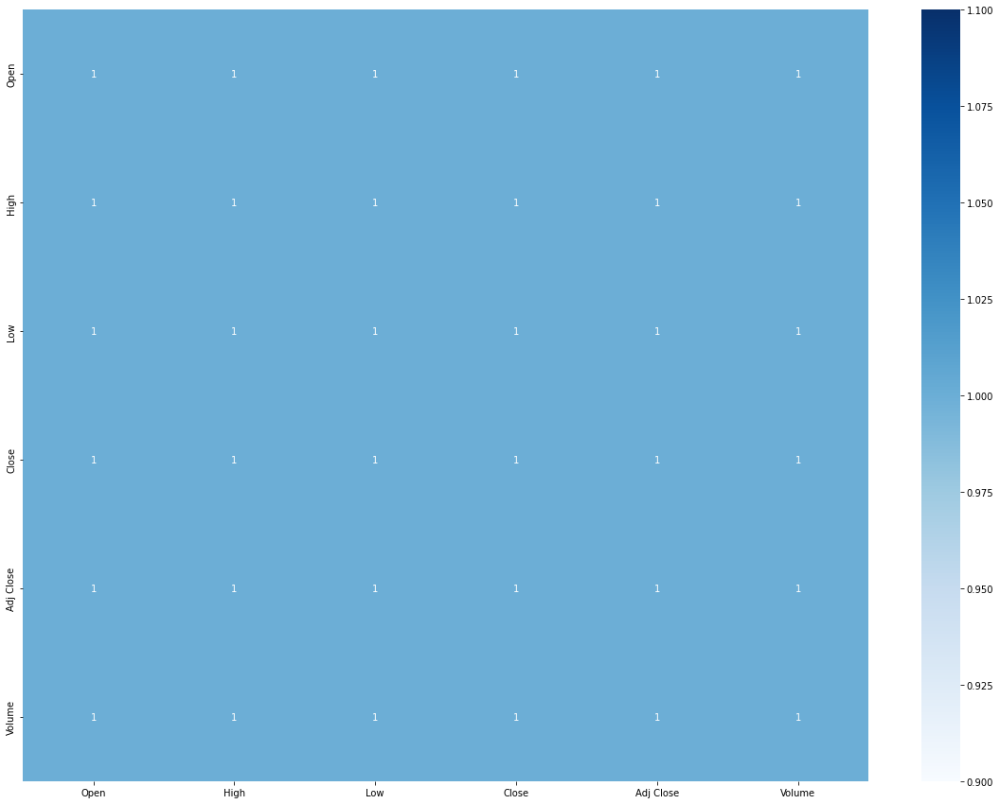

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.075836,0.951793,14,165,False,False


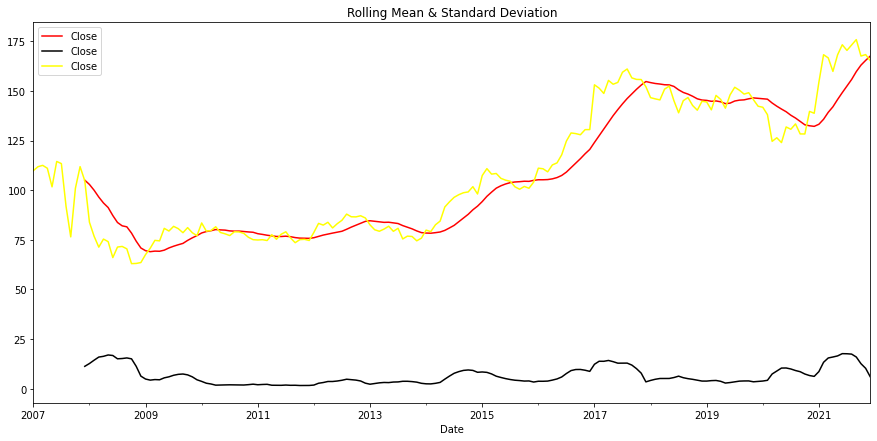

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

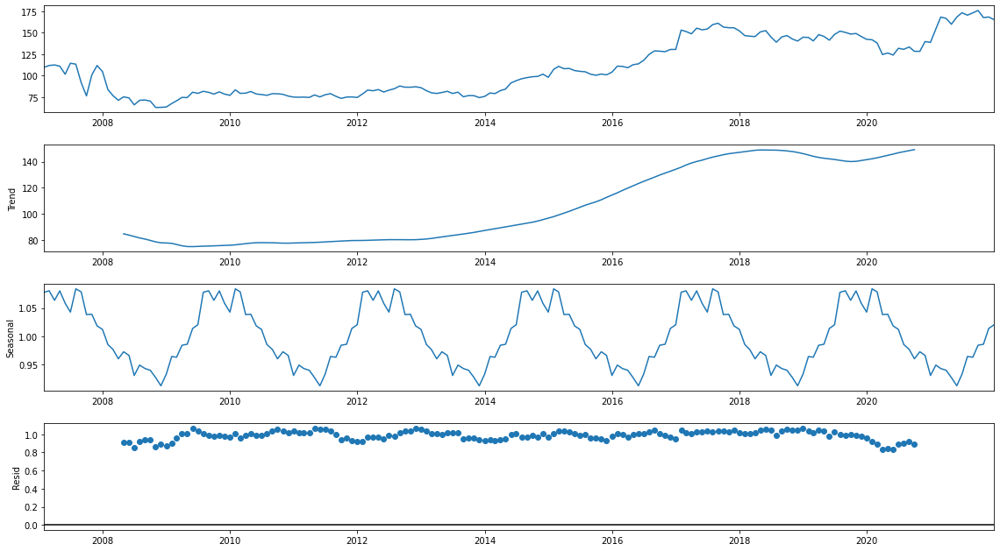

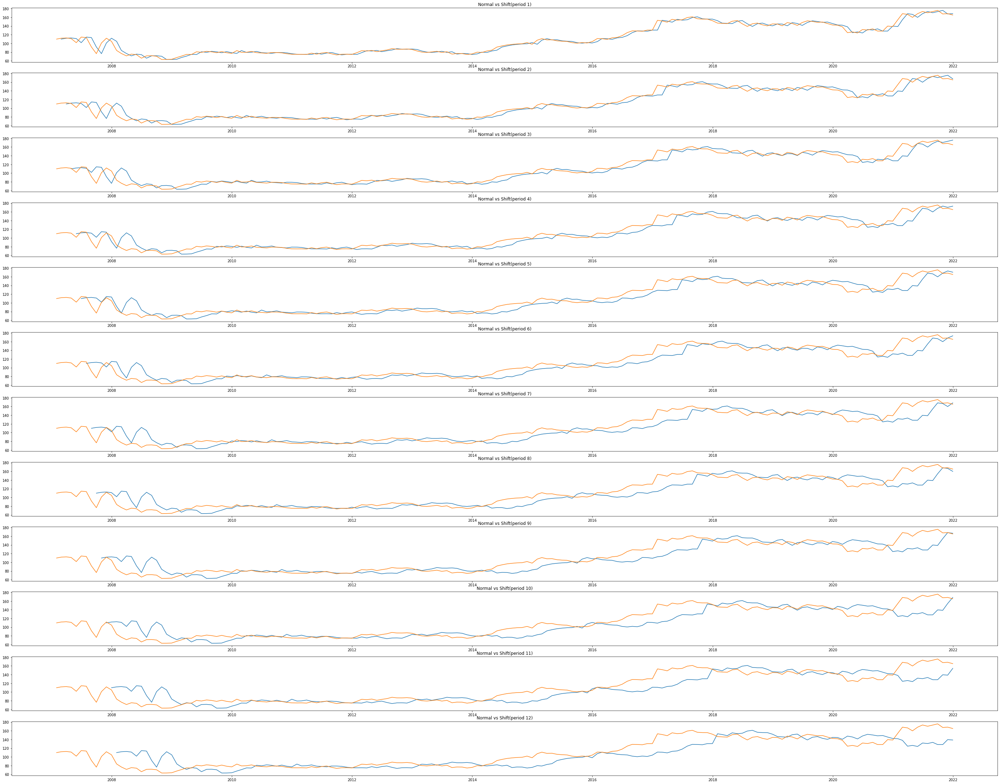

<Figure size 1080x504 with 0 Axes>

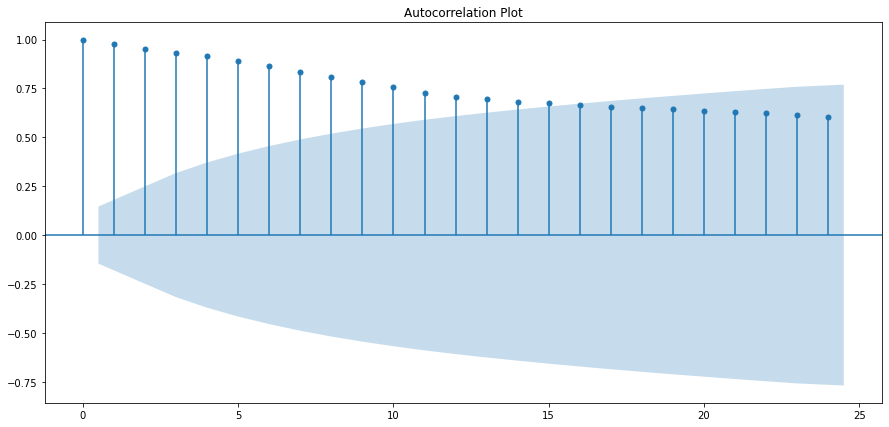

<Figure size 1080x504 with 0 Axes>

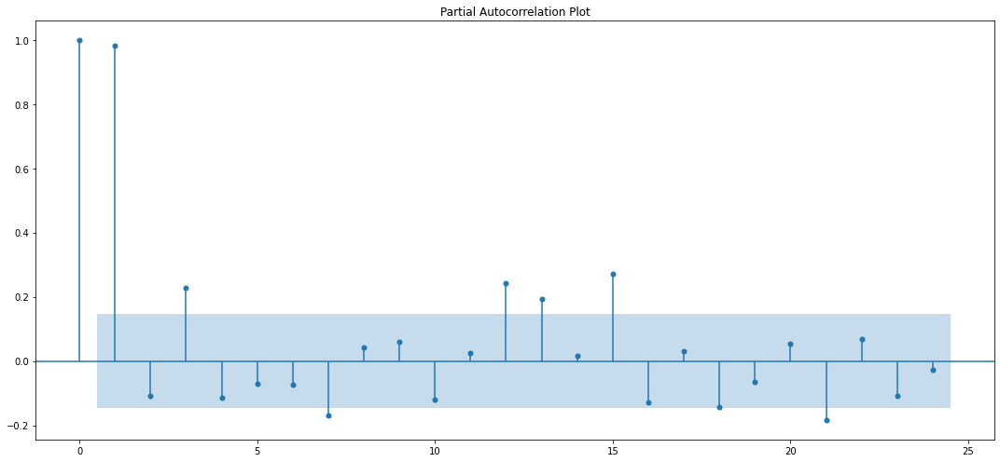

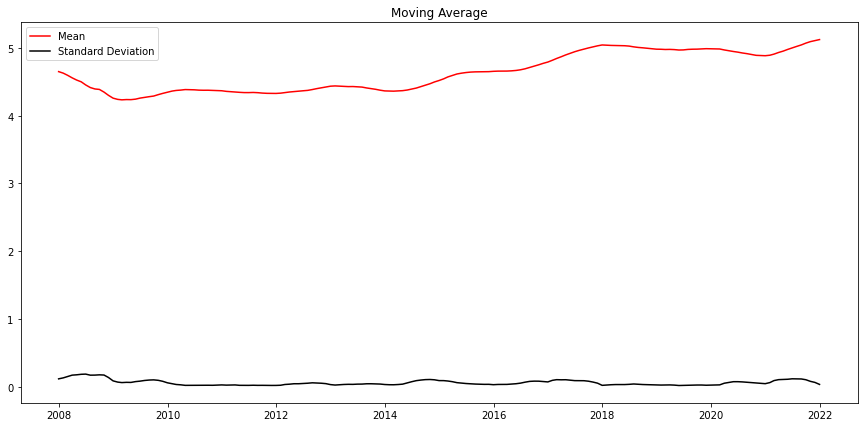

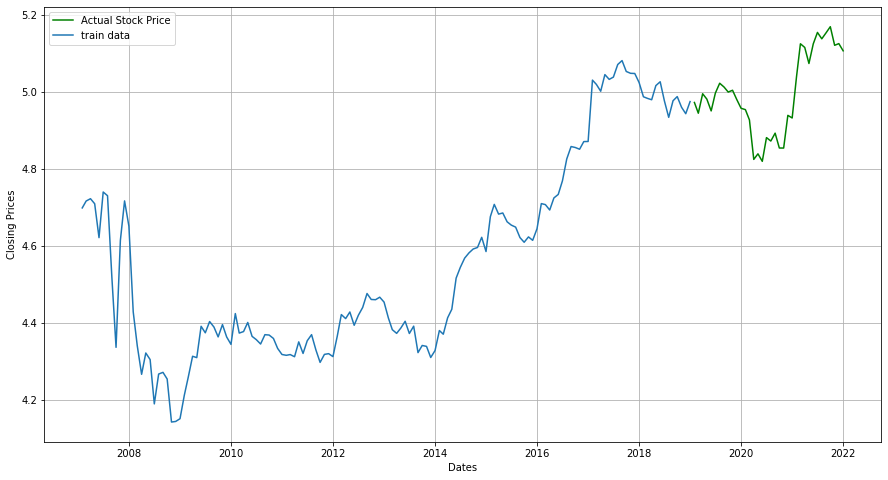

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2204.4610334553818
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1894.1999531967767
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1474.0740845610105
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1336.206198681692
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1479.515052819413
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1456.3364526136063
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1343.156179805193
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1335.220432817952
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1956.4867540862786
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1668.5376897811502
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1303.0052267428882
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1174.1005432652082
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1321.181475887254
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1280.8107325159203
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1184

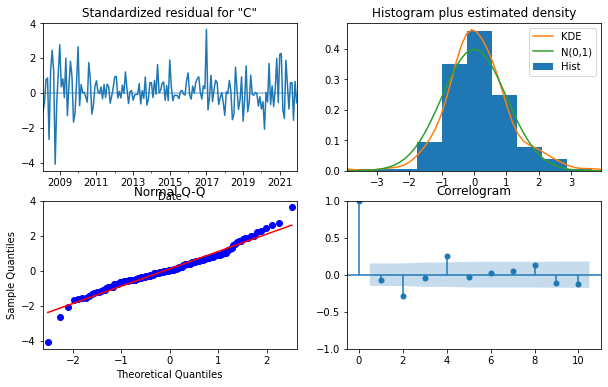

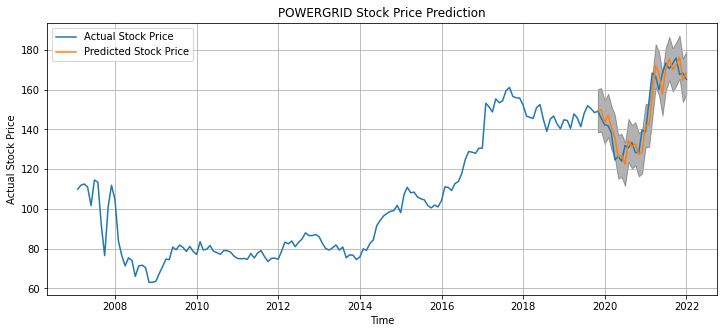

The Mean Squared Error is 41.68
The root Mean Squared Error is 6.46


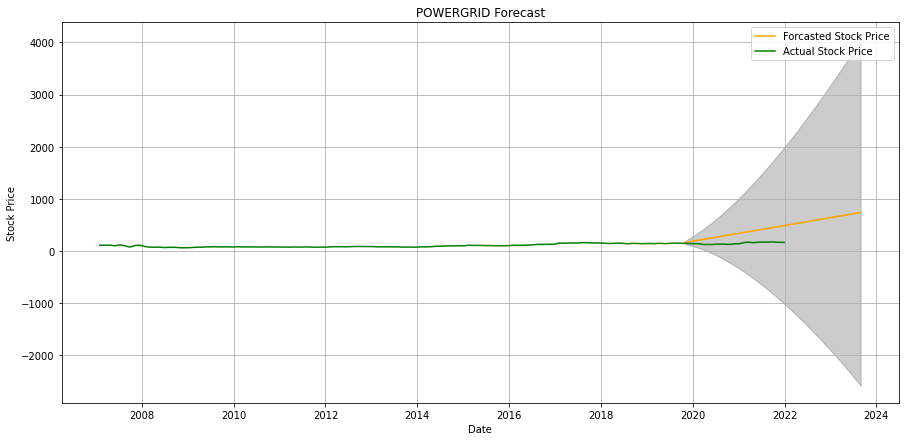

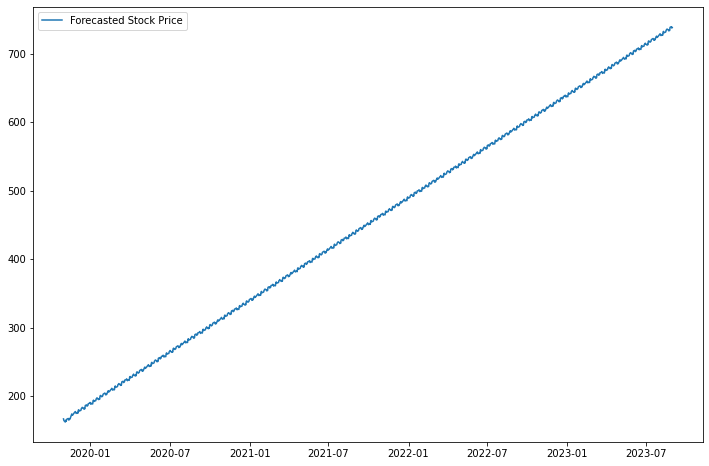

Epoch 1/50
4/4 [==============================] - 14s 268ms/step - loss: 0.2669
Epoch 2/50
4/4 [==============================] - 1s 232ms/step - loss: 0.0717
Epoch 3/50
4/4 [==============================] - 1s 226ms/step - loss: 0.0232
Epoch 4/50
4/4 [==============================] - 1s 214ms/step - loss: 0.0419
Epoch 5/50
4/4 [==============================] - 1s 200ms/step - loss: 0.0267
Epoch 6/50
4/4 [==============================] - 1s 216ms/step - loss: 0.0259
Epoch 7/50
4/4 [==============================] - 1s 168ms/step - loss: 0.0220
Epoch 8/50
4/4 [==============================] - 1s 202ms/step - loss: 0.0189
Epoch 9/50
4/4 [==============================] - 1s 219ms/step - loss: 0.0176
Epoch 10/50
4/4 [==============================] - 1s 219ms/step - loss: 0.0187
Epoch 11/50
4/4 [==============================] - 1s 199ms/step - loss: 0.0172
Epoch 12/50
4/4 [==============================] - 1s 209ms/step - loss: 0.0177
Epoch 13/50
4/4 [==============================]

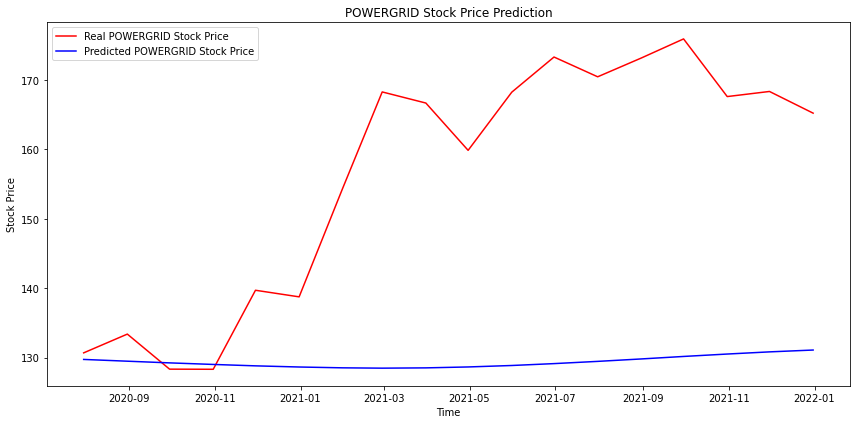

In [126]:
stock_market_prediction(nifty_data, symbol="POWERGRID", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### ICICI BANK

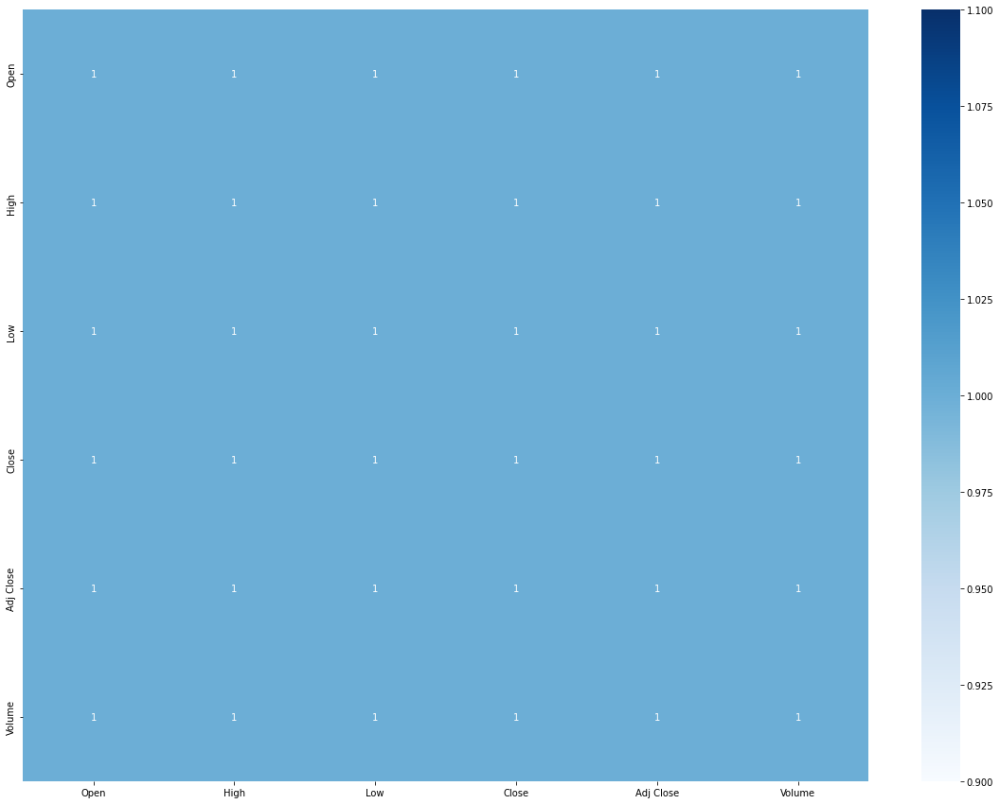

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,0.723996,0.990305,0,239,False,False


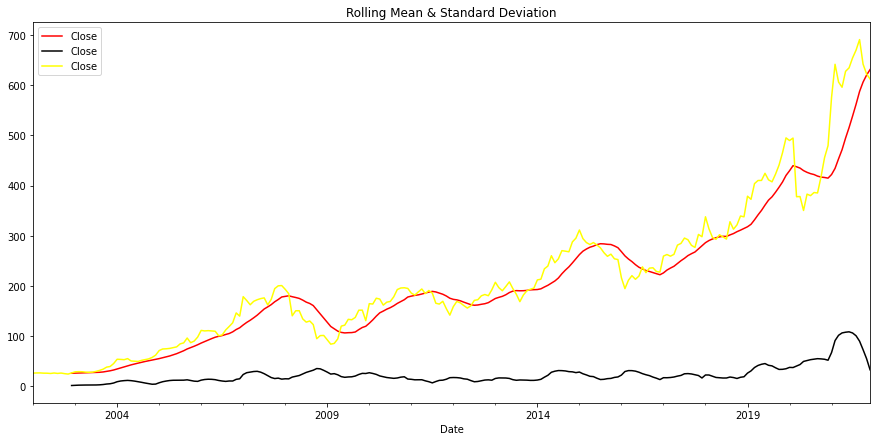

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

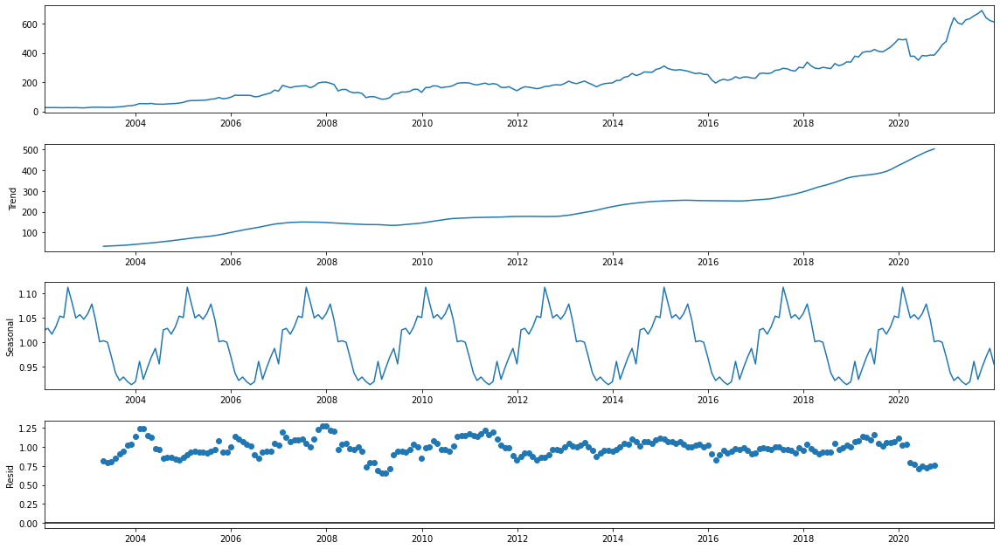

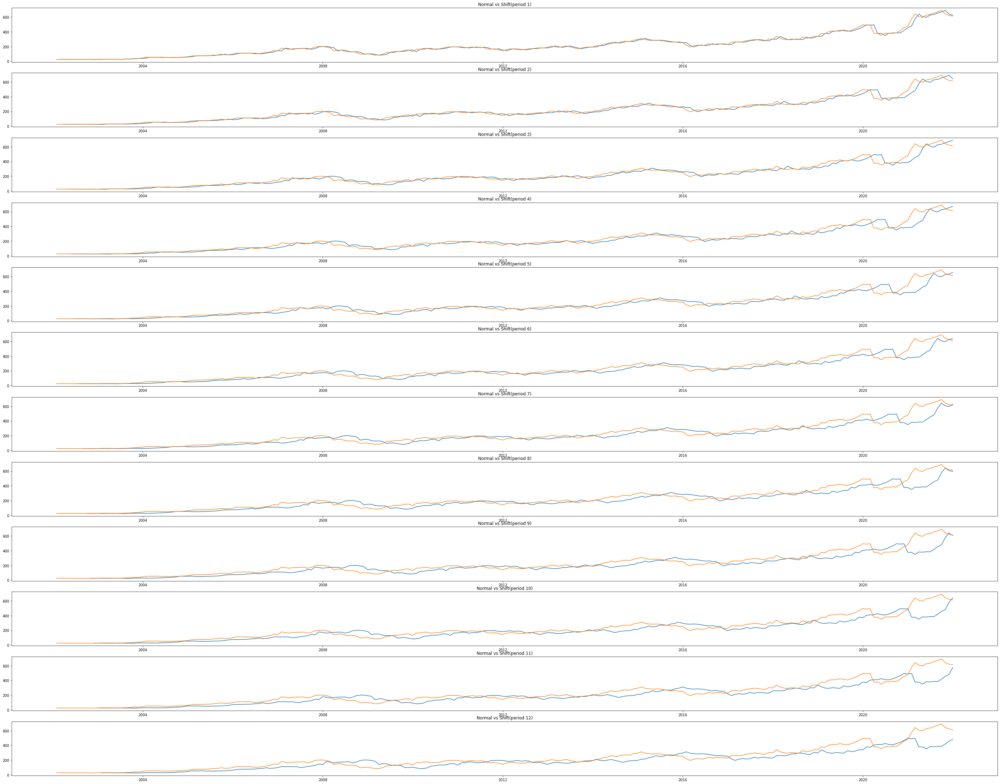

<Figure size 1080x504 with 0 Axes>

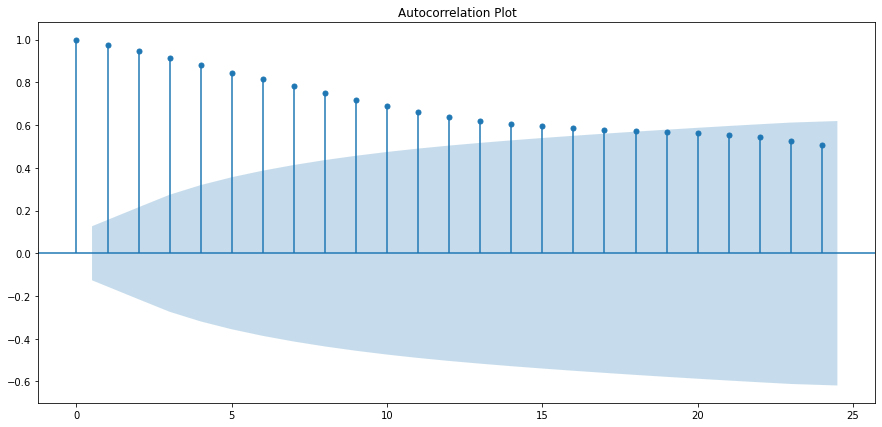

<Figure size 1080x504 with 0 Axes>

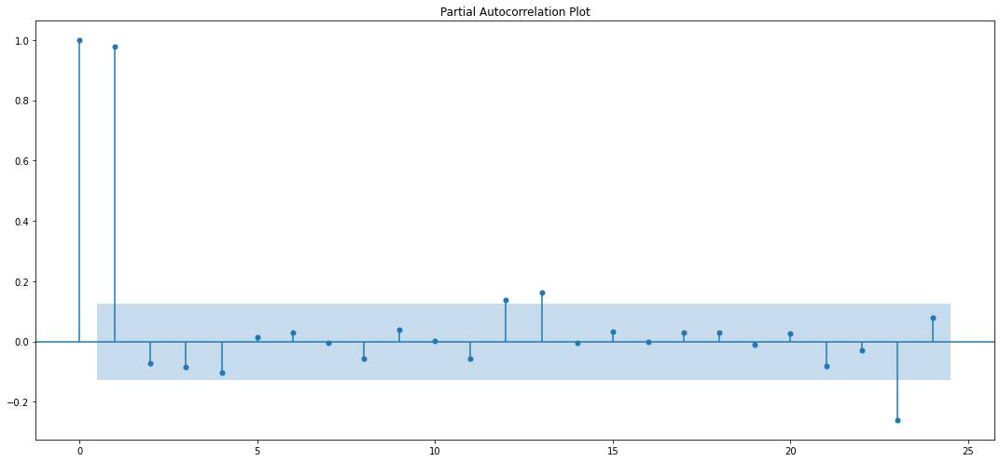

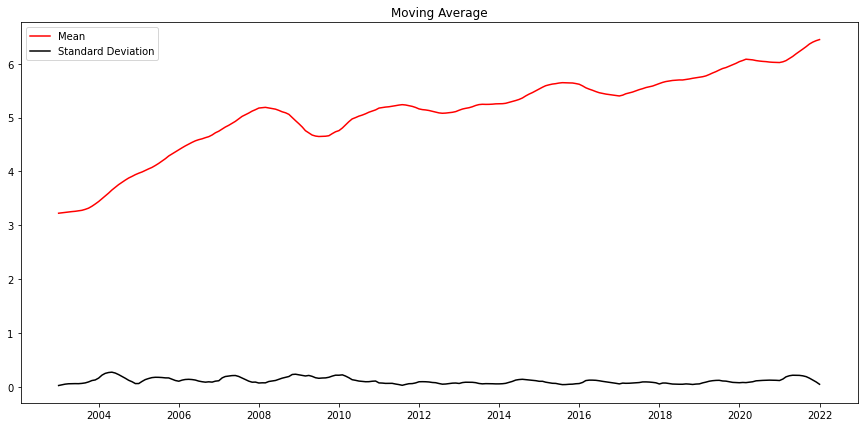

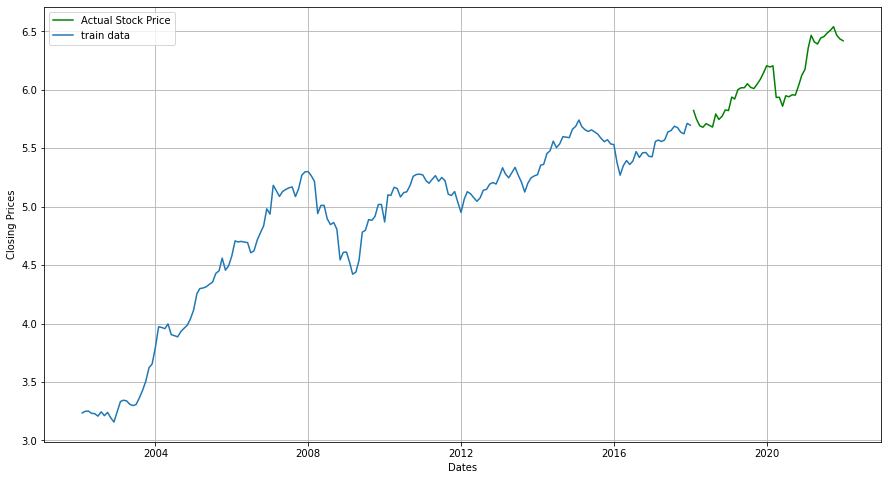

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 3336.993015180141
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 3000.665342703258
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 2594.445443086718
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 2469.5759257872223
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2545.954901241257
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 2475.14350400362
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 2478.8665152704734
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 2462.767987382749
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 3022.3261464252964
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 2710.6323204579203
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 2370.2620349256454
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2252.3277361205533
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2351.139691464127
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2259.149655291757
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 2268.765

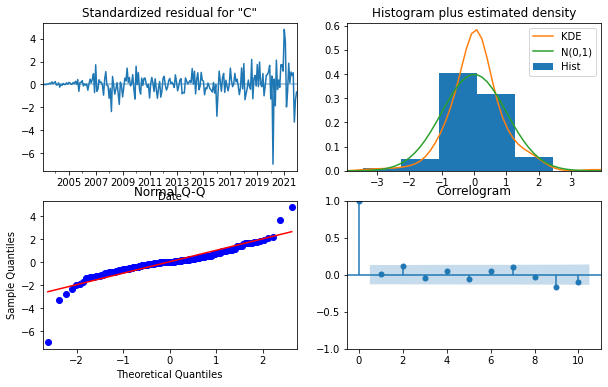

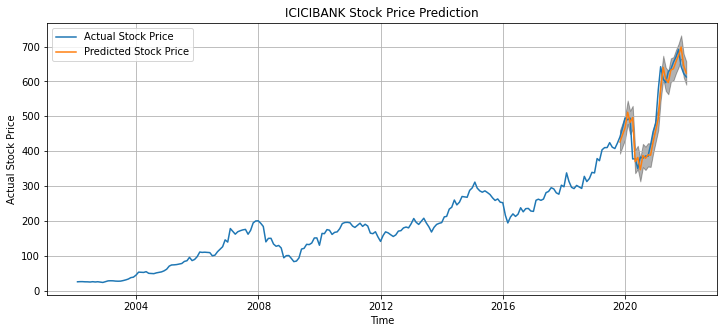

The Mean Squared Error is 1421.38
The root Mean Squared Error is 37.7


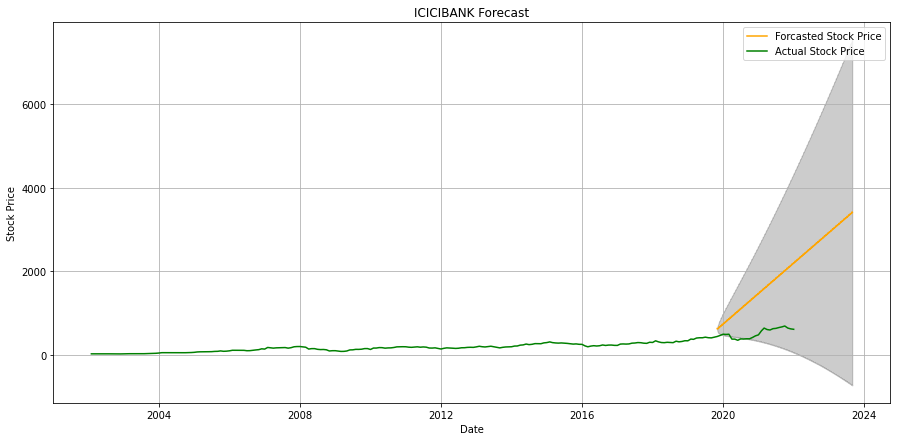

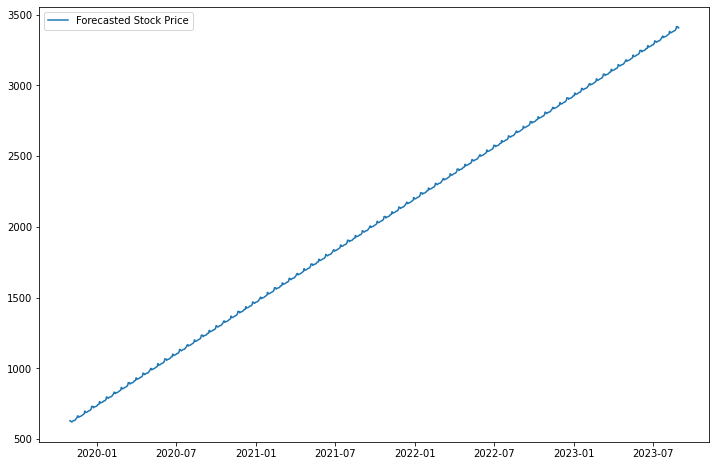

Epoch 1/50
5/5 [==============================] - 15s 220ms/step - loss: 0.1043
Epoch 2/50
5/5 [==============================] - 1s 217ms/step - loss: 0.0275
Epoch 3/50
5/5 [==============================] - 1s 221ms/step - loss: 0.0256
Epoch 4/50
5/5 [==============================] - 1s 203ms/step - loss: 0.0178
Epoch 5/50
5/5 [==============================] - 1s 219ms/step - loss: 0.0168
Epoch 6/50
5/5 [==============================] - 1s 217ms/step - loss: 0.0159
Epoch 7/50
5/5 [==============================] - 1s 194ms/step - loss: 0.0136
Epoch 8/50
5/5 [==============================] - 1s 216ms/step - loss: 0.0127
Epoch 9/50
5/5 [==============================] - 1s 202ms/step - loss: 0.0118 0s - loss: 0.01
Epoch 10/50
5/5 [==============================] - 1s 212ms/step - loss: 0.0108
Epoch 11/50
5/5 [==============================] - 1s 201ms/step - loss: 0.0104
Epoch 12/50
5/5 [==============================] - 1s 207ms/step - loss: 0.0095
Epoch 13/50
5/5 [===============

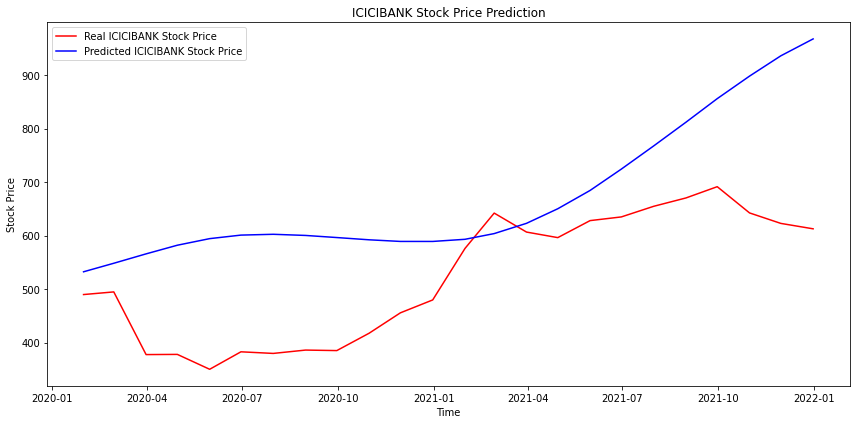

In [127]:
stock_market_prediction(nifty_data, symbol="ICICIBANK", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### KOTAK BANK

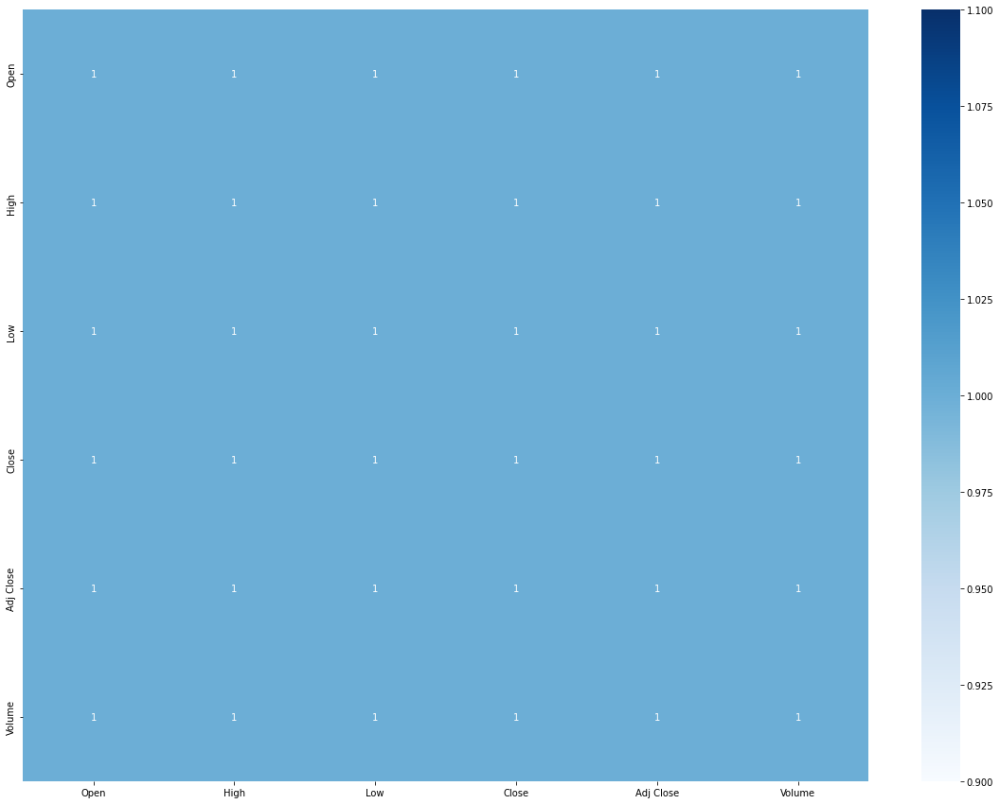

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,3.338074,1.0,8,243,False,False


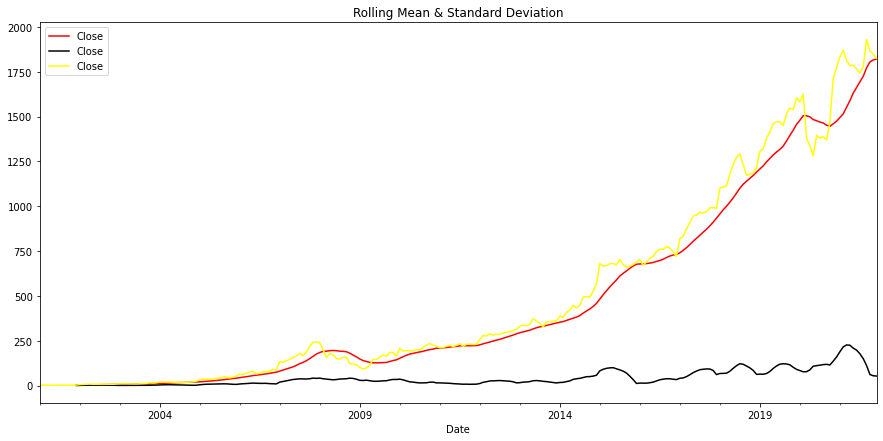

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

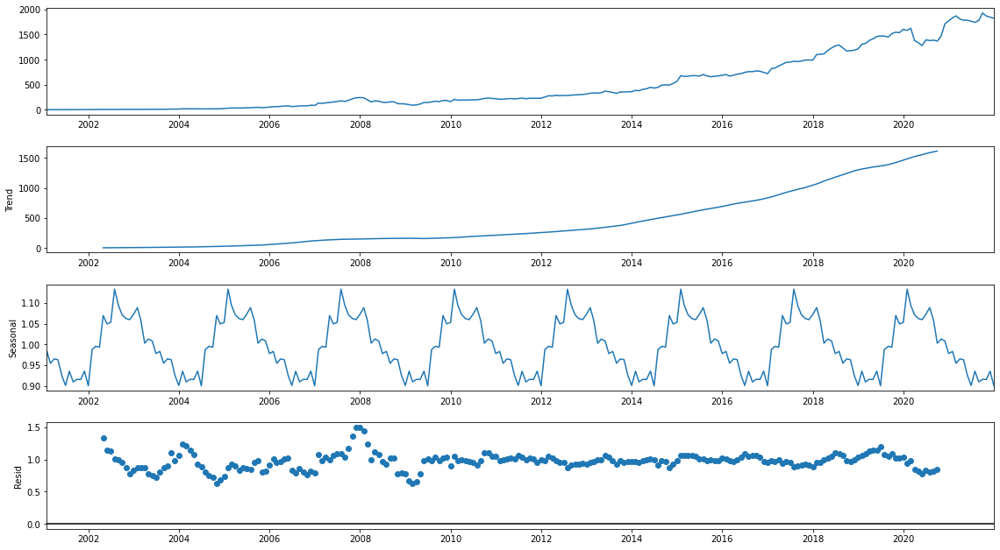

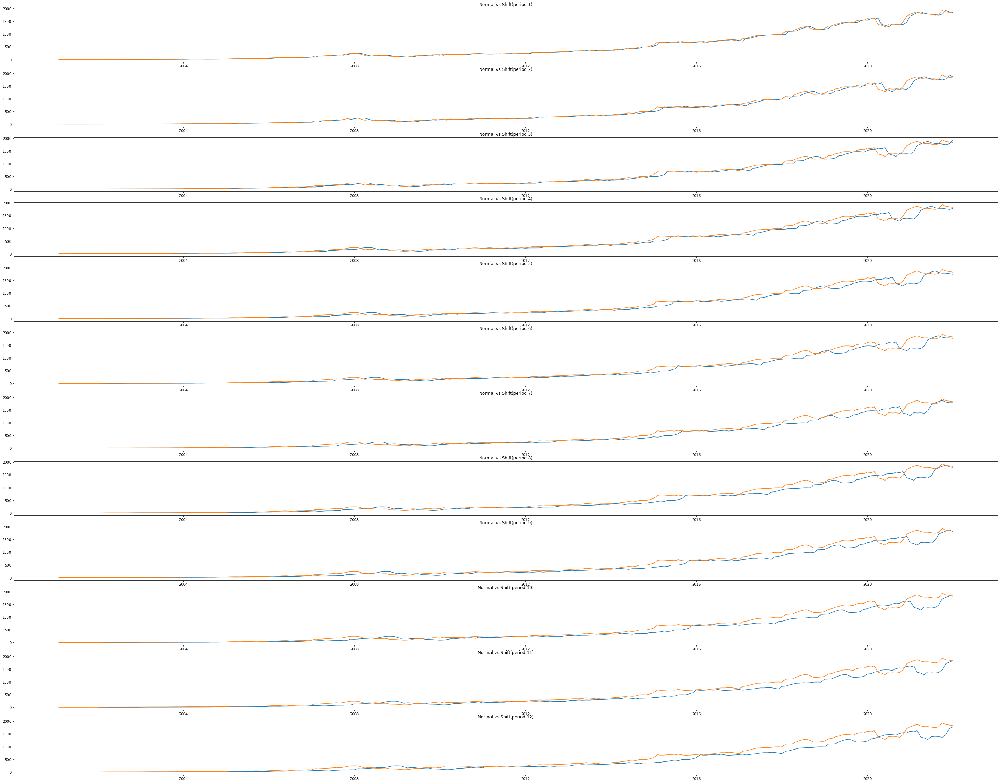

<Figure size 1080x504 with 0 Axes>

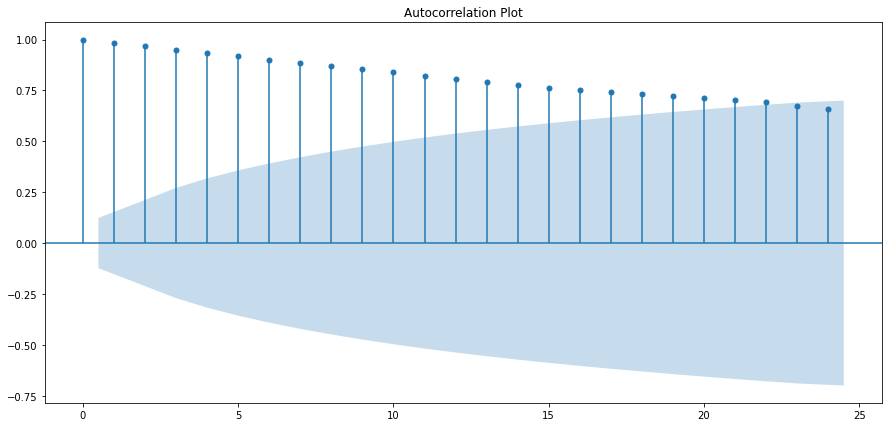

<Figure size 1080x504 with 0 Axes>

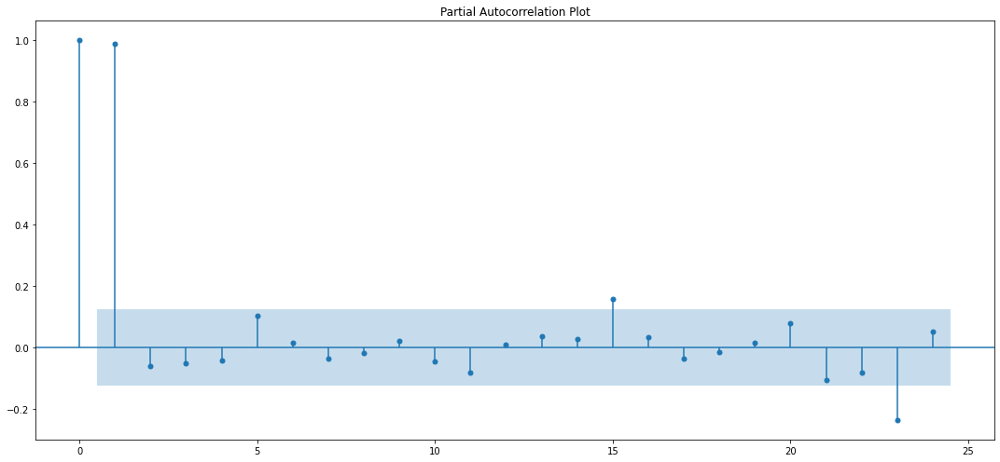

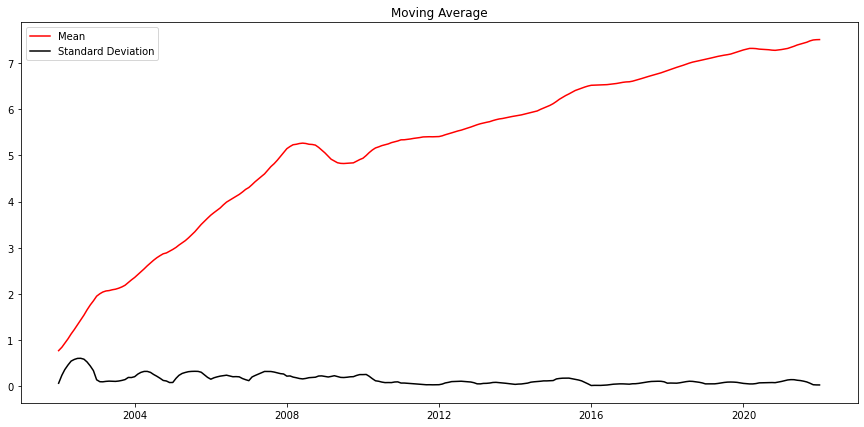

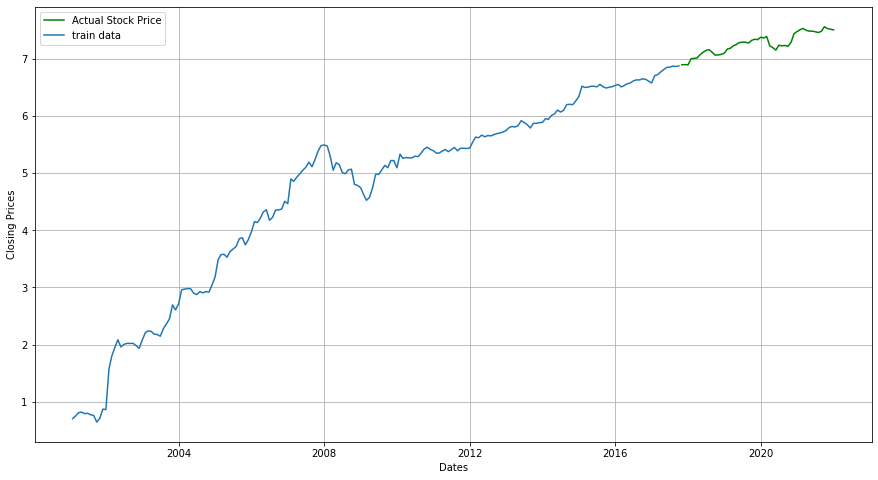

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 4032.348721160328
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 3619.375881891007
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 3080.247826236411
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 2919.031701114656
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 2905.8990154223593
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 2857.199400764439
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 2907.24898885735
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 2787.9169584217616
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 3693.7827615804085
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 3311.01616476479
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 2841.146571339985
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 2706.3709739202213
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 2732.334904742327
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 2661.6379830469423
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 2721.71232

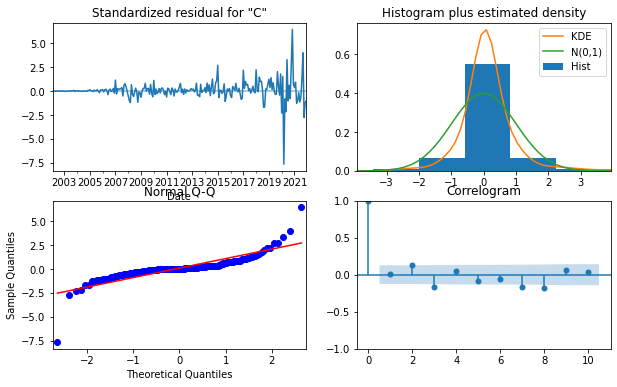

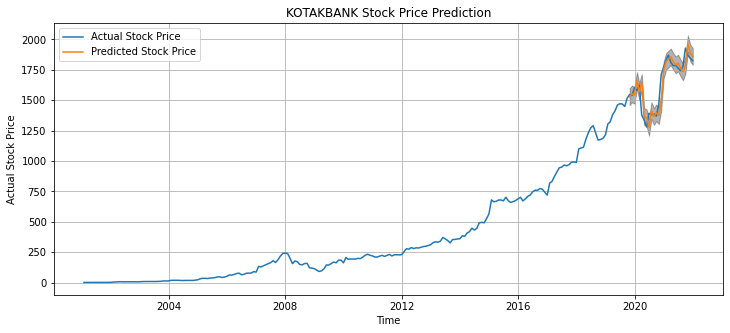

The Mean Squared Error is 7831.11
The root Mean Squared Error is 88.49


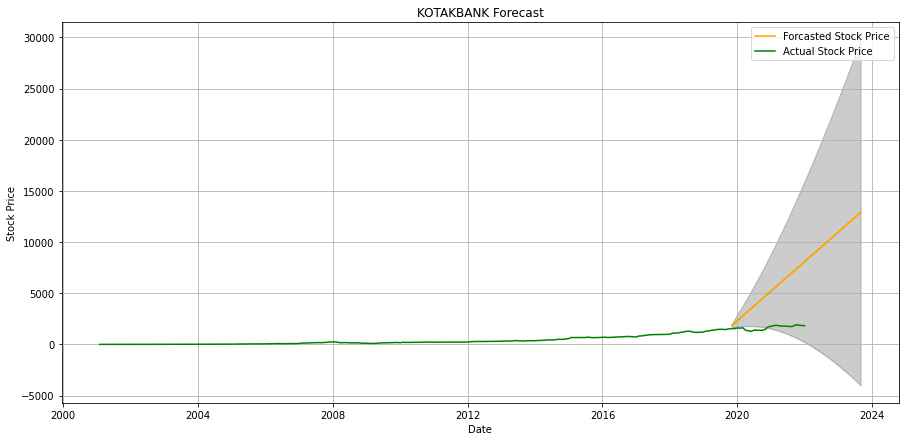

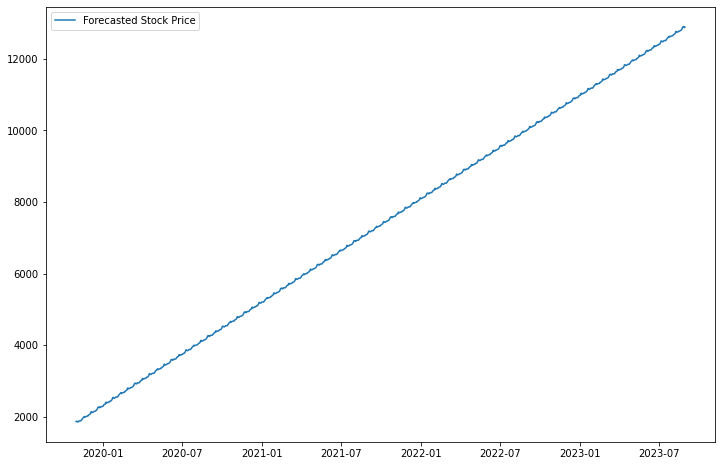

Epoch 1/50
6/6 [==============================] - 14s 221ms/step - loss: 0.0833
Epoch 2/50
6/6 [==============================] - 1s 202ms/step - loss: 0.0166
Epoch 3/50
6/6 [==============================] - 1s 219ms/step - loss: 0.0126
Epoch 4/50
6/6 [==============================] - 1s 179ms/step - loss: 0.0048
Epoch 5/50
6/6 [==============================] - 1s 193ms/step - loss: 0.0039
Epoch 6/50
6/6 [==============================] - 2s 253ms/step - loss: 0.0025
Epoch 7/50
6/6 [==============================] - 1s 228ms/step - loss: 0.0024
Epoch 8/50
6/6 [==============================] - 1s 184ms/step - loss: 0.0021
Epoch 9/50
6/6 [==============================] - 1s 215ms/step - loss: 0.0016
Epoch 10/50
6/6 [==============================] - 1s 189ms/step - loss: 0.0019
Epoch 11/50
6/6 [==============================] - 1s 193ms/step - loss: 0.0017
Epoch 12/50
6/6 [==============================] - 1s 216ms/step - loss: 0.0018
Epoch 13/50
6/6 [==============================]

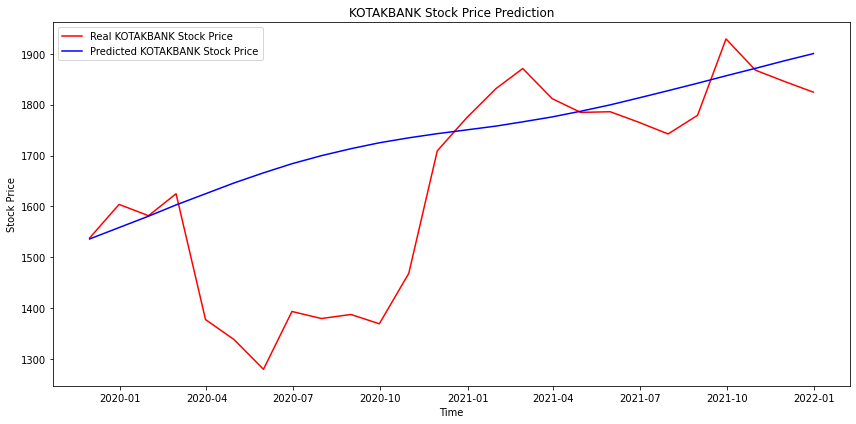

In [128]:
stock_market_prediction(nifty_data, symbol="KOTAKBANK", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### ASTRAL

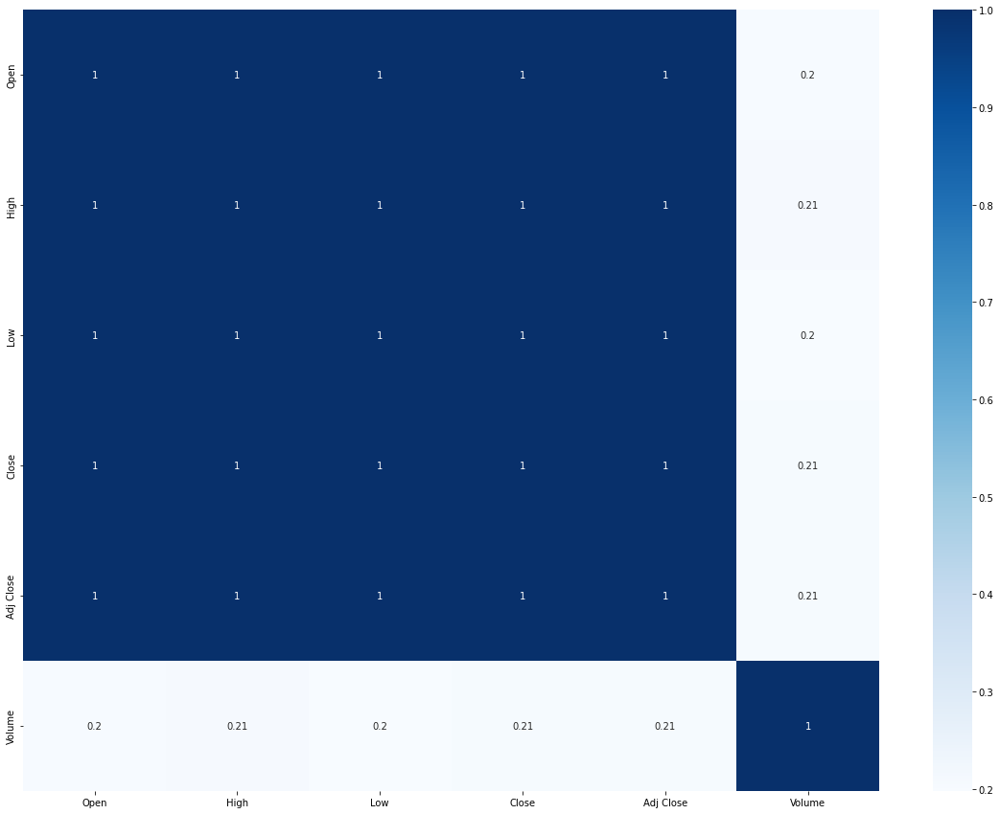

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,2.775656,1.0,9,122,False,False


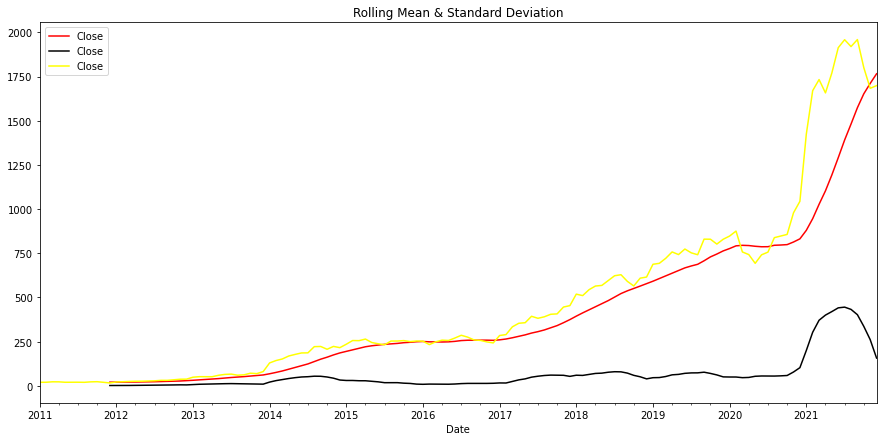

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

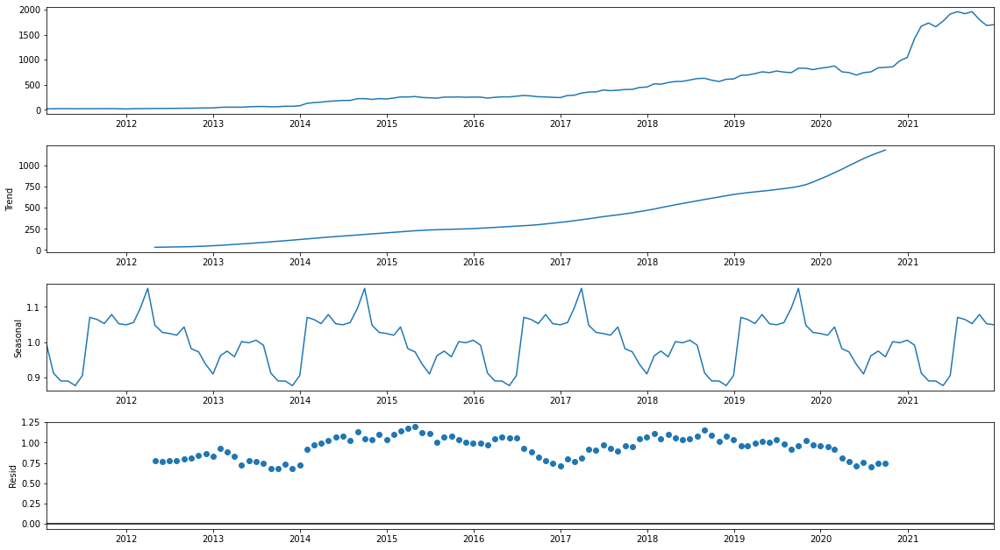

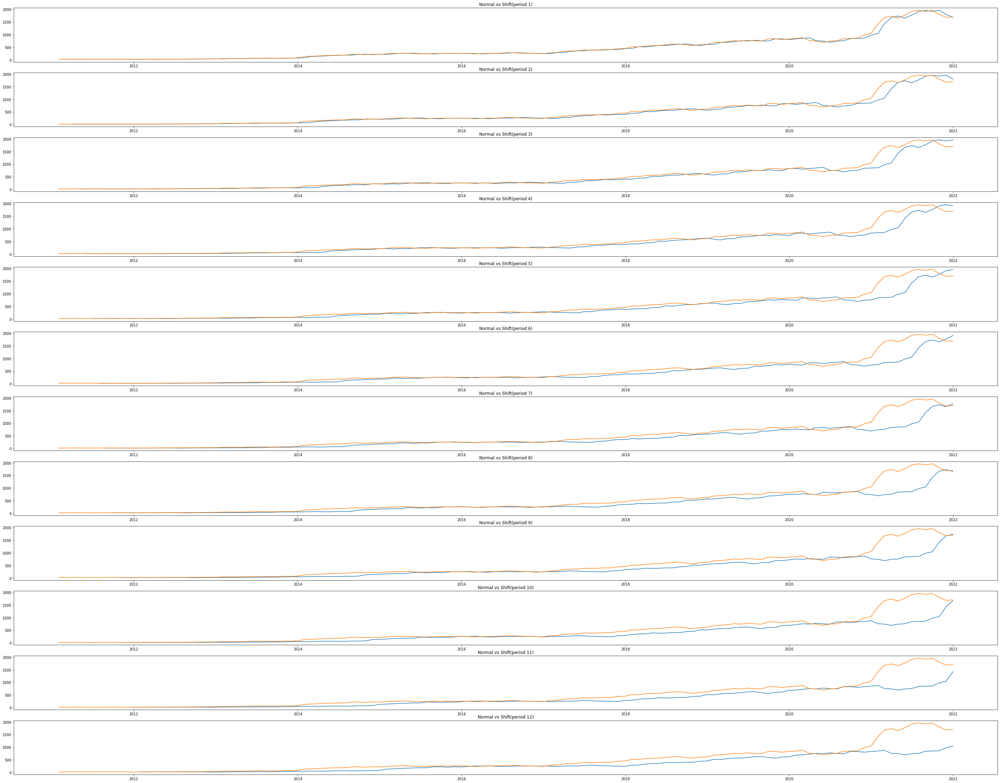

<Figure size 1080x504 with 0 Axes>

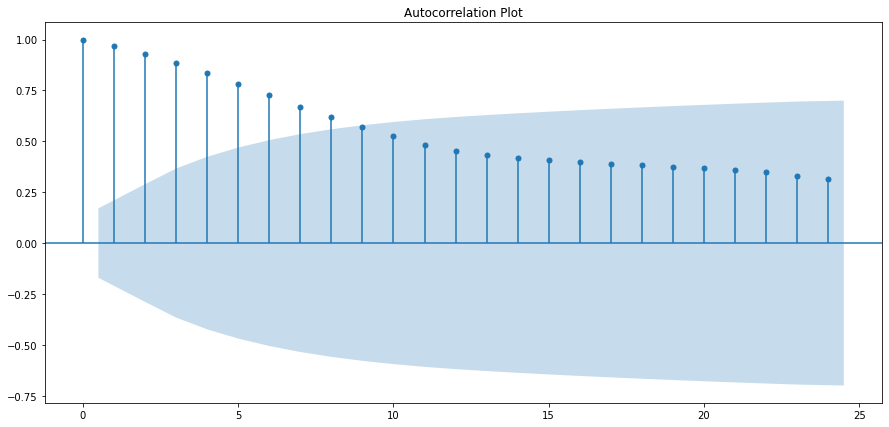

<Figure size 1080x504 with 0 Axes>

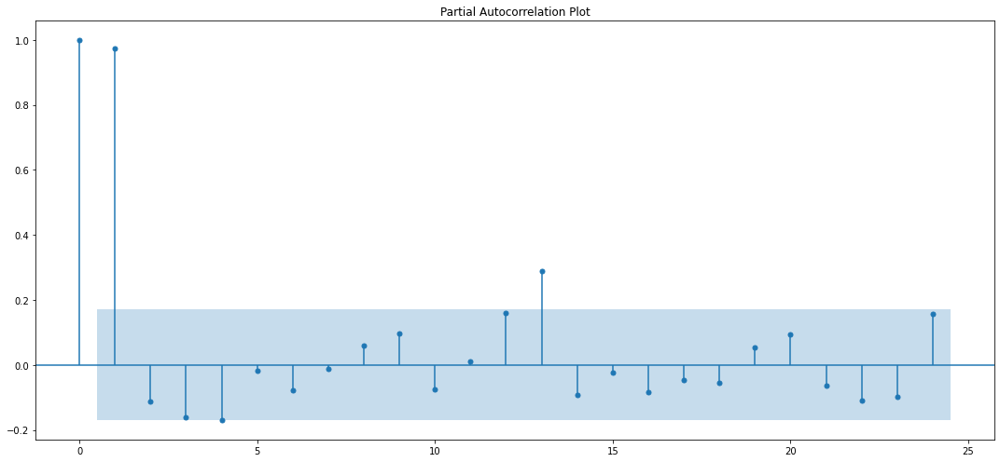

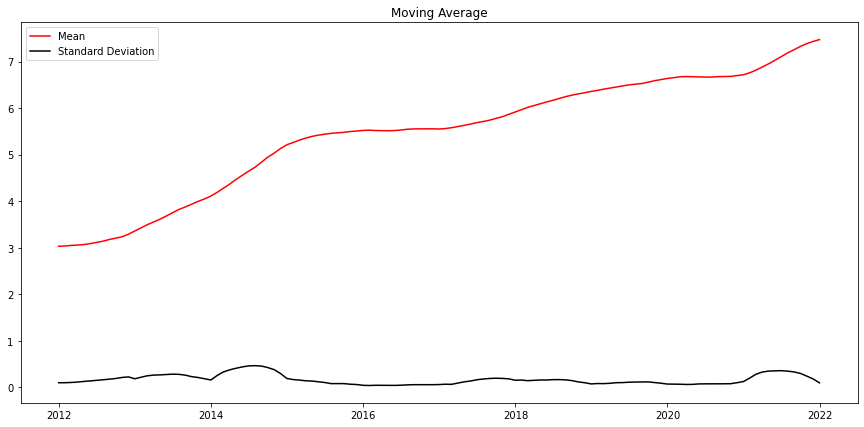

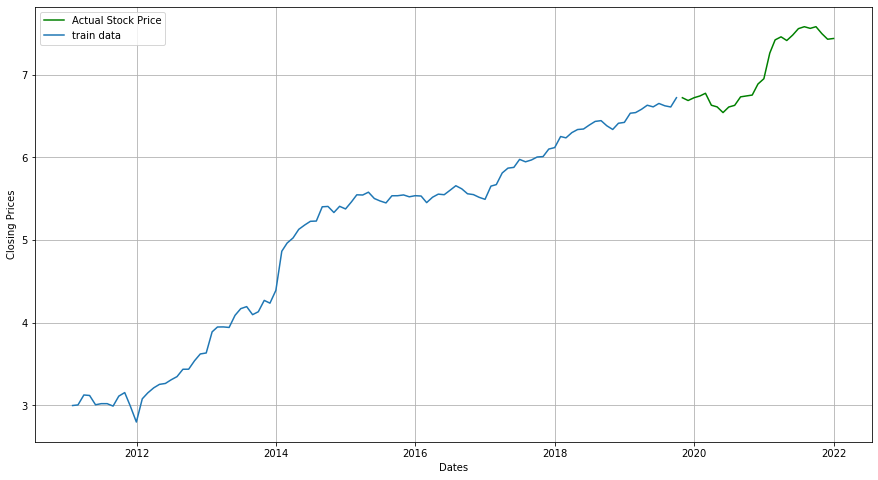

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2083.2619540762225
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1839.8888800446714
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1715.6694625064933
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1551.7292747747765
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1636.491543618321
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1562.735529380177
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1554.4550149147922
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1499.5381468831968
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1899.986287090913
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1677.2030670016297
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1561.134219174128
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1414.0687706422154
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1519.3903899660666
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1433.4195404526286
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 143

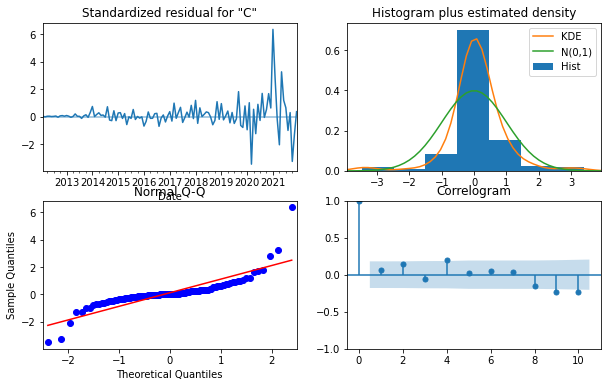

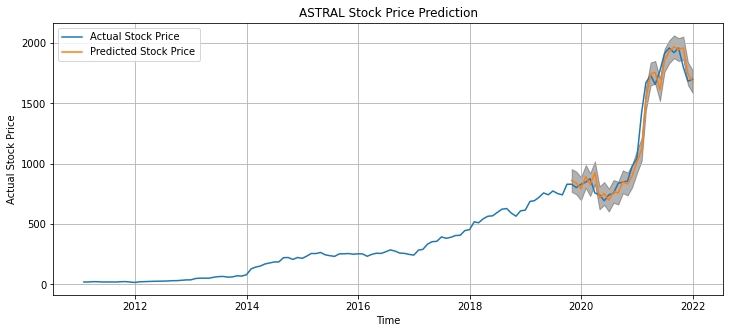

The Mean Squared Error is 8906.07
The root Mean Squared Error is 94.37


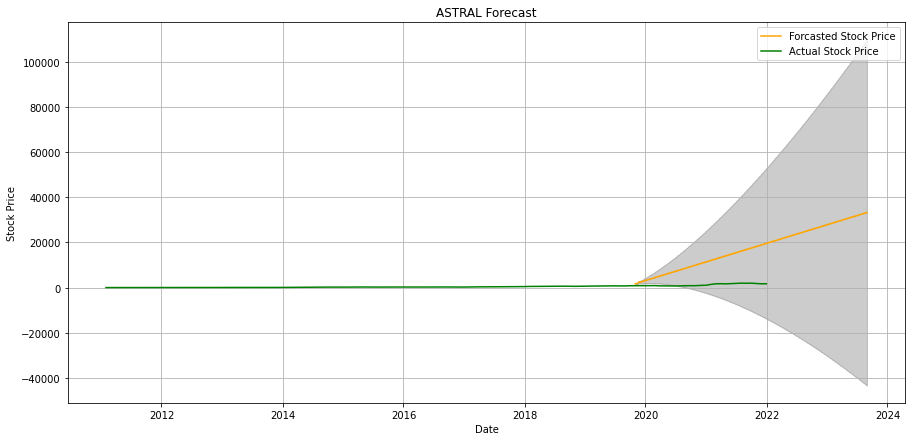

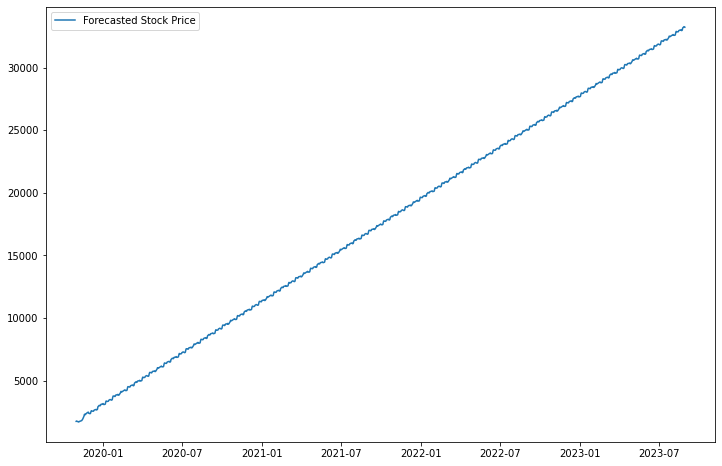

Epoch 1/50
2/2 [==============================] - 16s 260ms/step - loss: 0.4075
Epoch 2/50
2/2 [==============================] - 1s 241ms/step - loss: 0.2905
Epoch 3/50
2/2 [==============================] - 0s 231ms/step - loss: 0.1380
Epoch 4/50
2/2 [==============================] - 0s 246ms/step - loss: 0.0300
Epoch 5/50
2/2 [==============================] - 0s 240ms/step - loss: 0.0948
Epoch 6/50
2/2 [==============================] - 0s 240ms/step - loss: 0.0238
Epoch 7/50
2/2 [==============================] - 0s 240ms/step - loss: 0.0196
Epoch 8/50
2/2 [==============================] - 0s 248ms/step - loss: 0.0394
Epoch 9/50
2/2 [==============================] - 1s 250ms/step - loss: 0.0413
Epoch 10/50
2/2 [==============================] - 0s 228ms/step - loss: 0.0257
Epoch 11/50
2/2 [==============================] - 0s 228ms/step - loss: 0.0157
Epoch 12/50
2/2 [==============================] - 0s 222ms/step - loss: 0.0159
Epoch 13/50
2/2 [==============================]

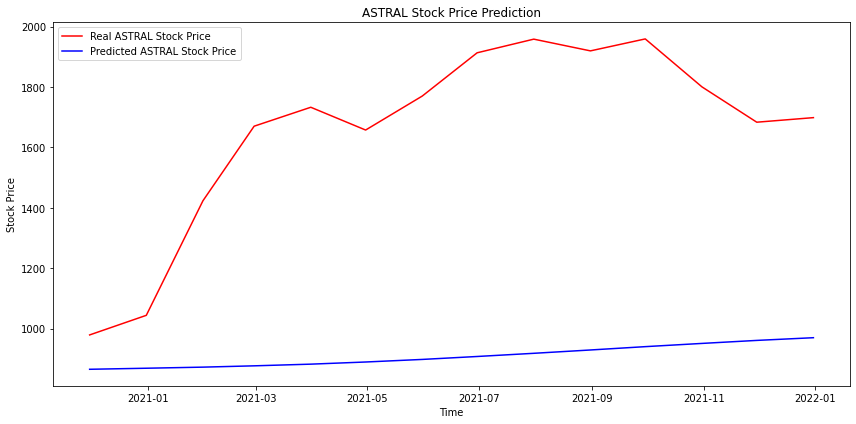

In [129]:
stock_market_prediction(NSE_data, symbol="ASTRAL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### SUMCHEM

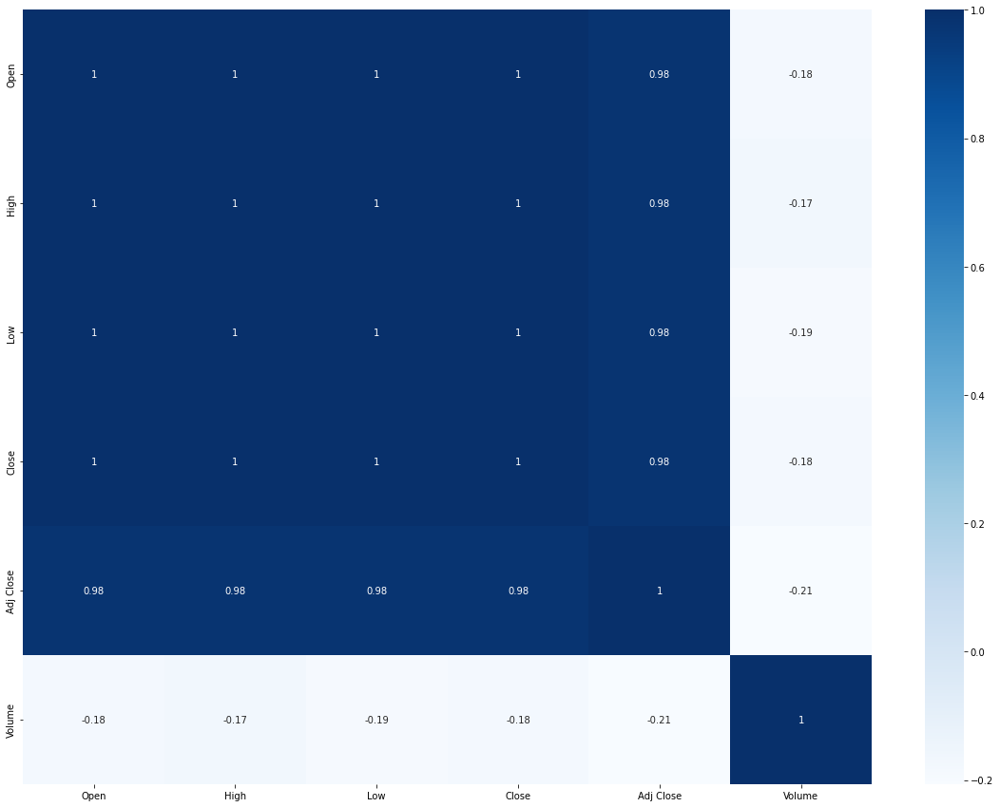

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.890788,0.336407,1,130,False,False


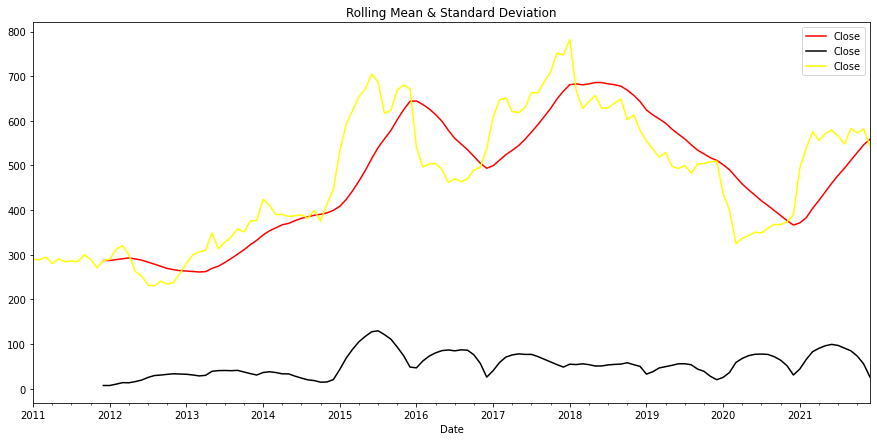

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

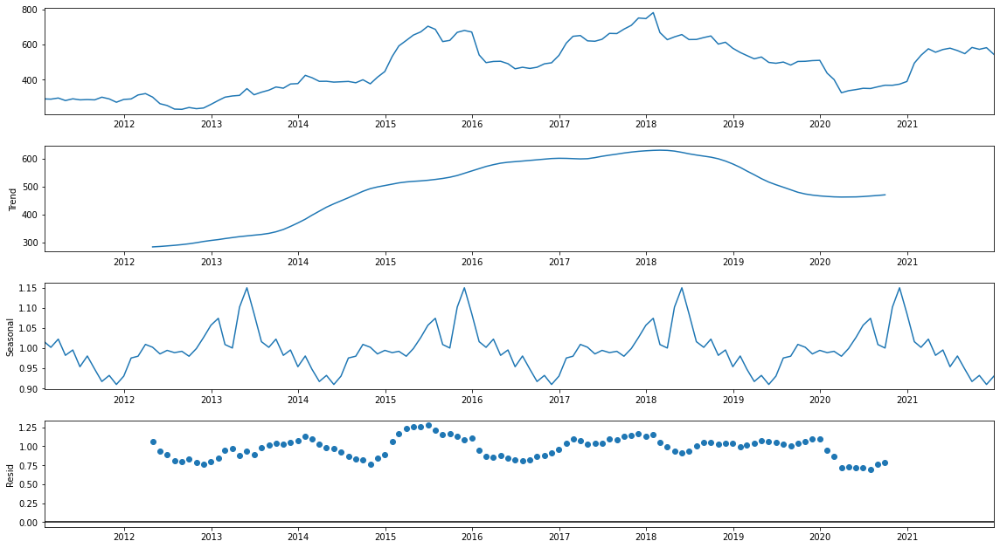

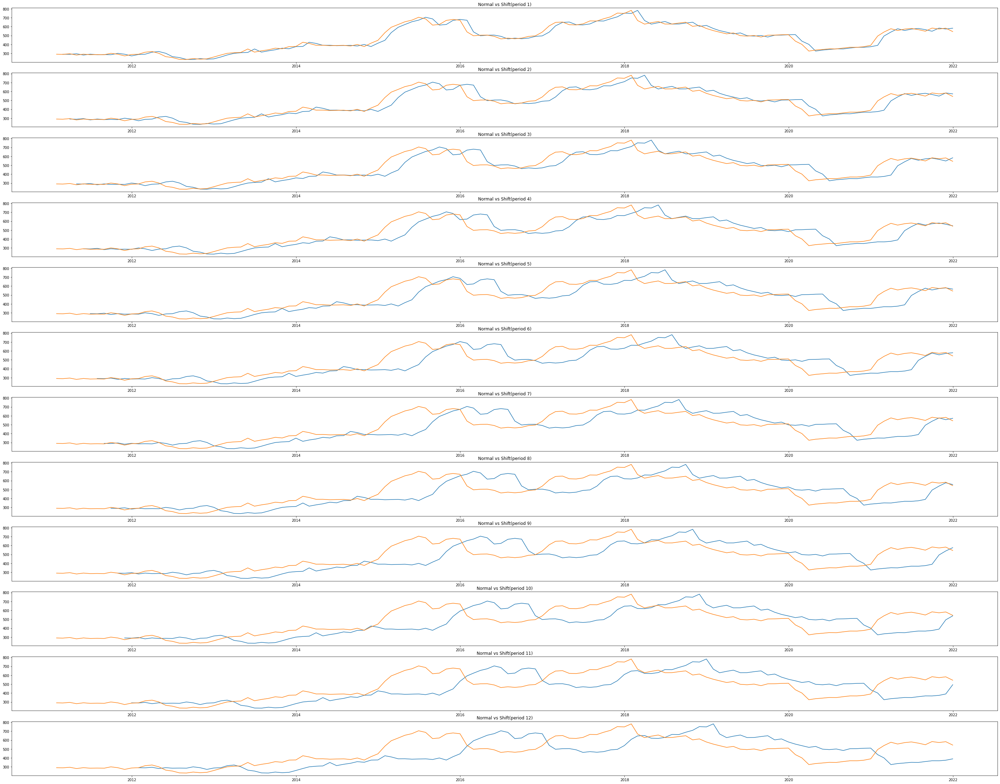

<Figure size 1080x504 with 0 Axes>

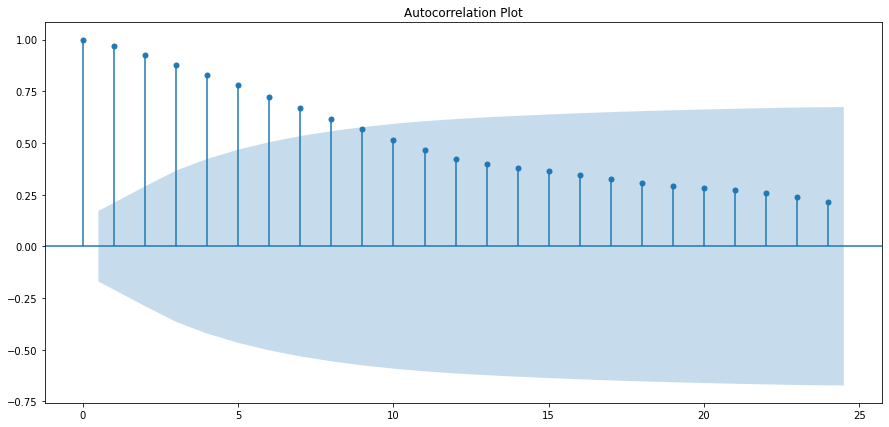

<Figure size 1080x504 with 0 Axes>

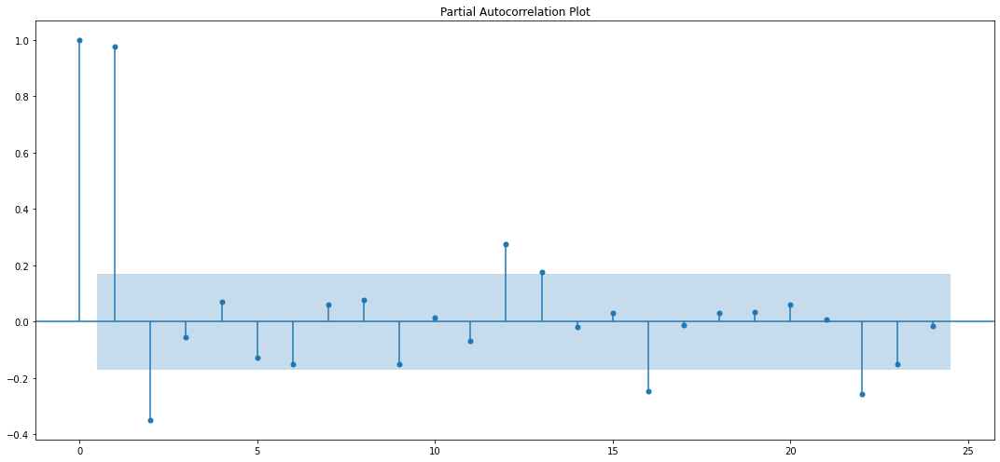

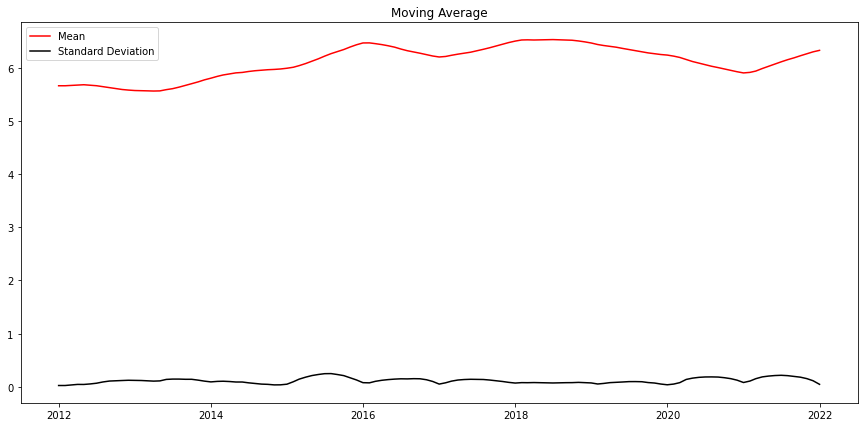

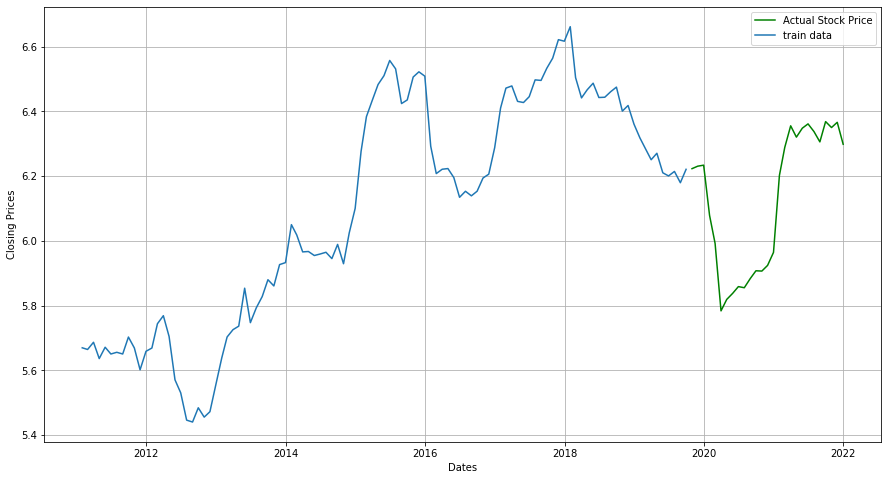

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1998.2255415844413
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1733.6579056116225
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1532.7738295859838
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1378.5722443843863
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1546.630742558516
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1522.6939368823223
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1389.2270572145853
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1379.2283509440606
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1818.83968035883
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1572.7229732475257
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1402.0908835673358
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1255.479065482121
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1424.201589049455
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1388.7833485108724
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1279

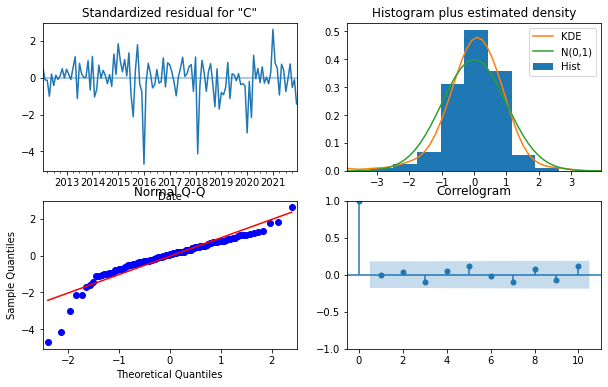

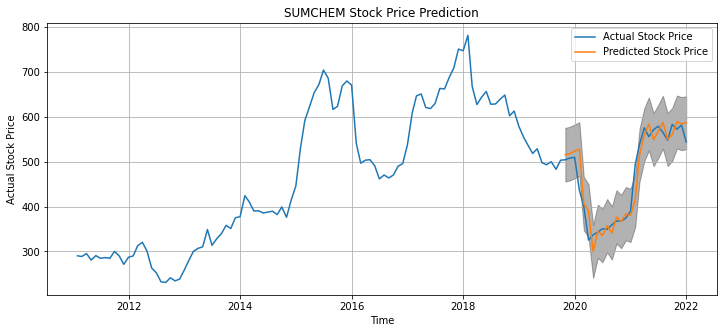

The Mean Squared Error is 1005.08
The root Mean Squared Error is 31.7


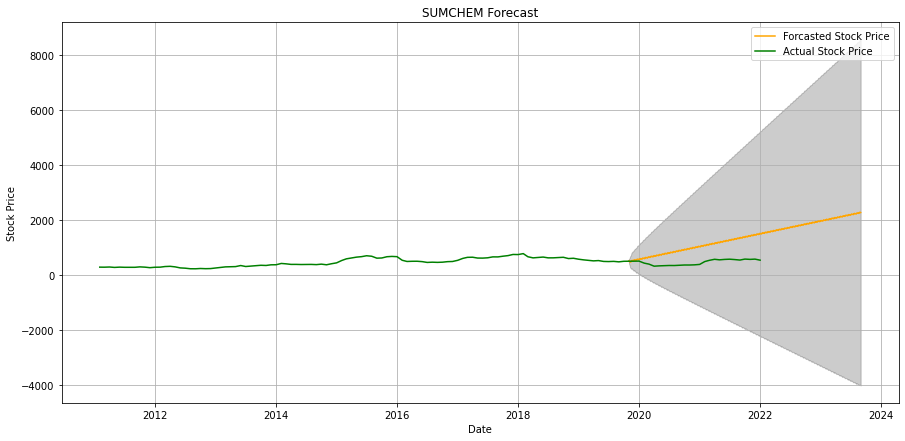

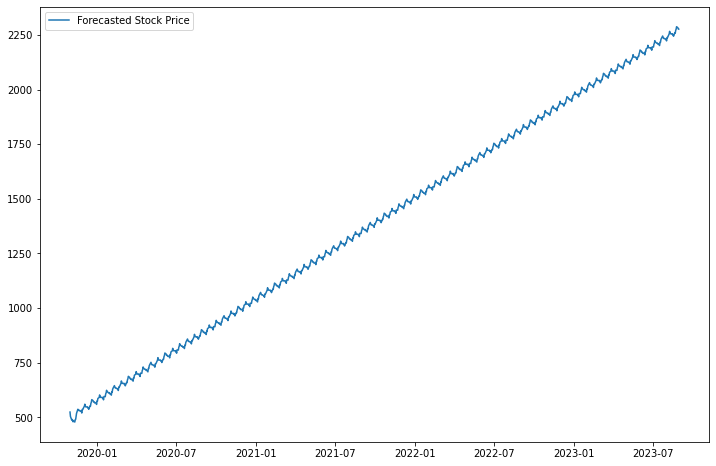

Epoch 1/50
2/2 [==============================] - 15s 203ms/step - loss: 0.3194
Epoch 2/50
2/2 [==============================] - 0s 202ms/step - loss: 0.1406
Epoch 3/50
2/2 [==============================] - 0s 201ms/step - loss: 0.0689
Epoch 4/50
2/2 [==============================] - 0s 200ms/step - loss: 0.0856
Epoch 5/50
2/2 [==============================] - 0s 220ms/step - loss: 0.0430
Epoch 6/50
2/2 [==============================] - 0s 212ms/step - loss: 0.0531
Epoch 7/50
2/2 [==============================] - 0s 162ms/step - loss: 0.0600
Epoch 8/50
2/2 [==============================] - 0s 235ms/step - loss: 0.0562
Epoch 9/50
2/2 [==============================] - 1s 264ms/step - loss: 0.0452
Epoch 10/50
2/2 [==============================] - 1s 254ms/step - loss: 0.0452
Epoch 11/50
2/2 [==============================] - 1s 260ms/step - loss: 0.0481
Epoch 12/50
2/2 [==============================] - 1s 261ms/step - loss: 0.0433
Epoch 13/50
2/2 [==============================]

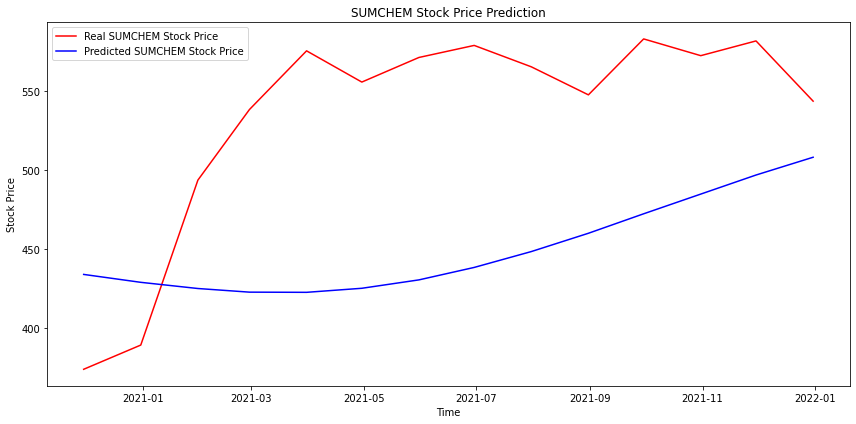

In [130]:
stock_market_prediction(NSE_data, symbol="SUMCHEM", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### BERGEPAINT

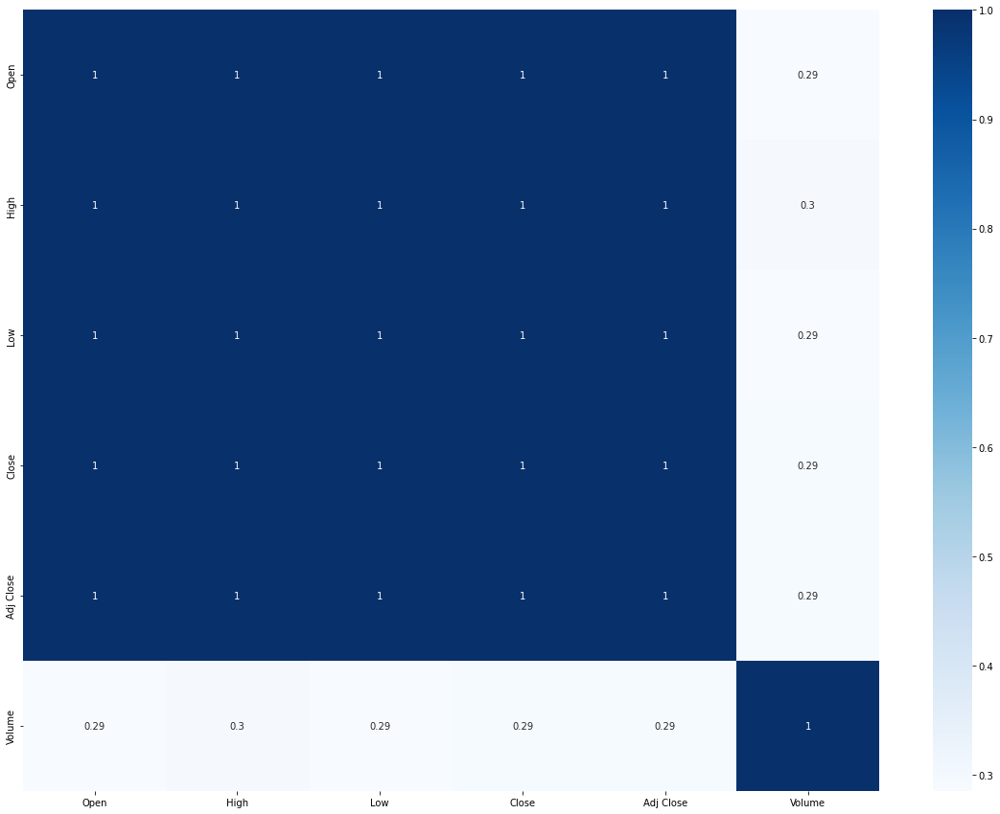

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.514558,0.997577,0,131,False,False


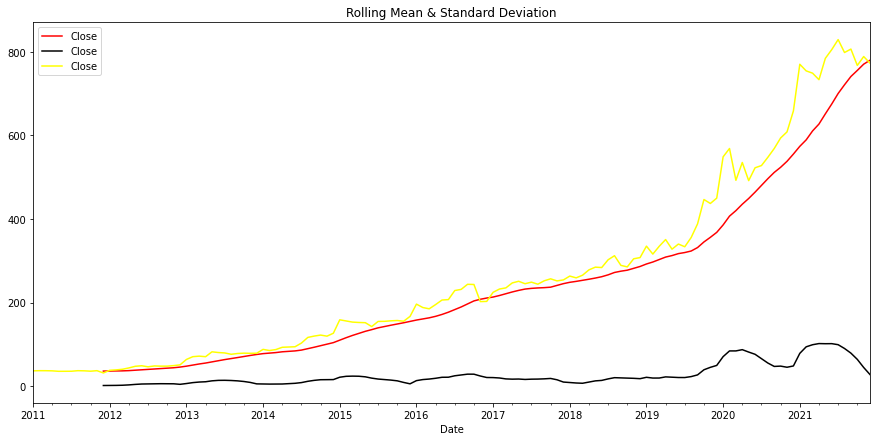

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

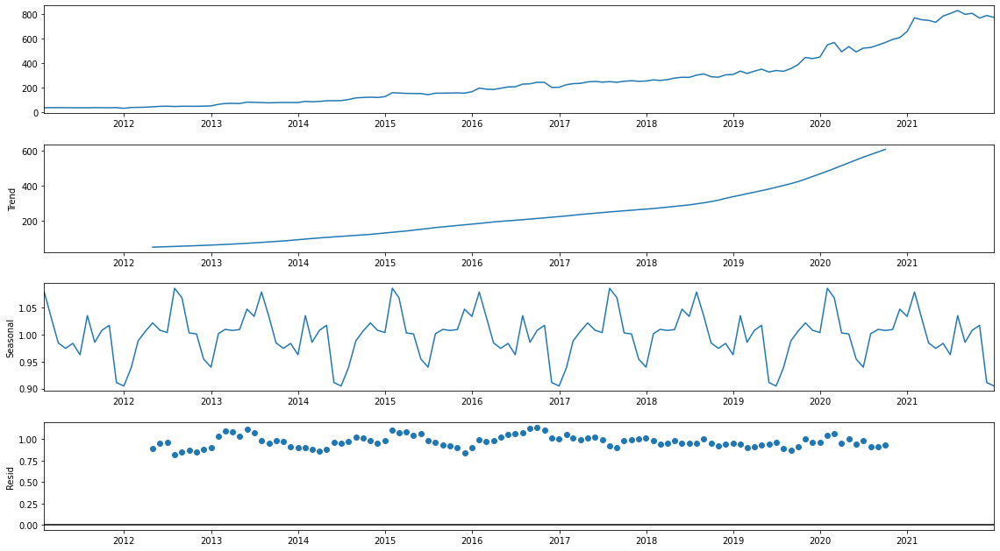

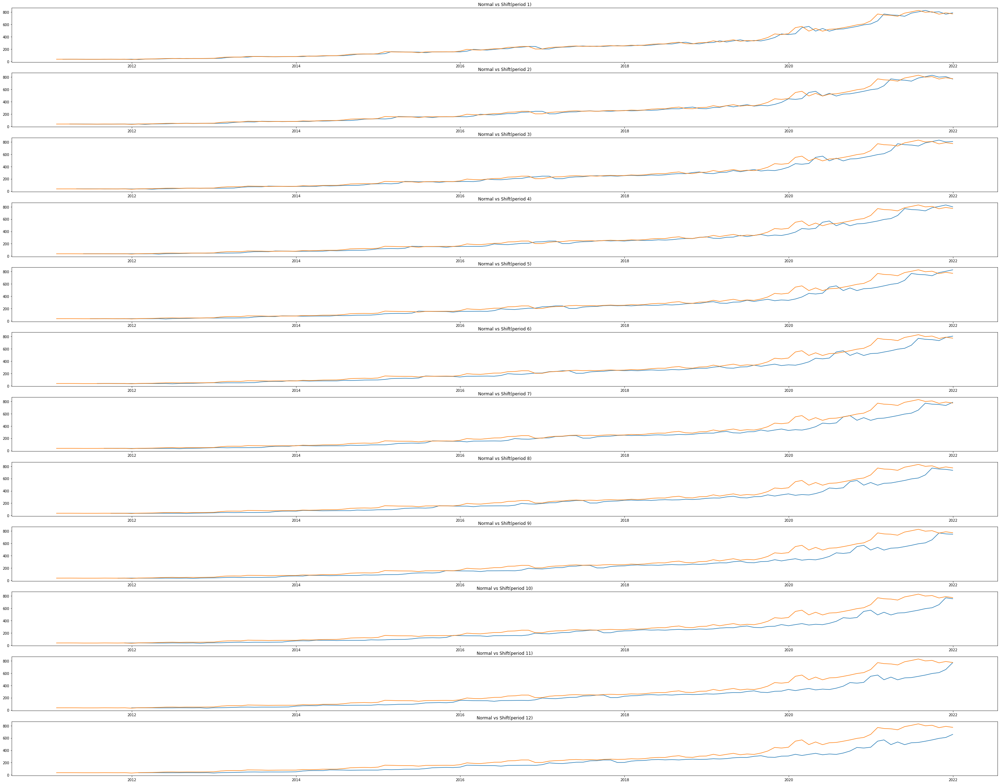

<Figure size 1080x504 with 0 Axes>

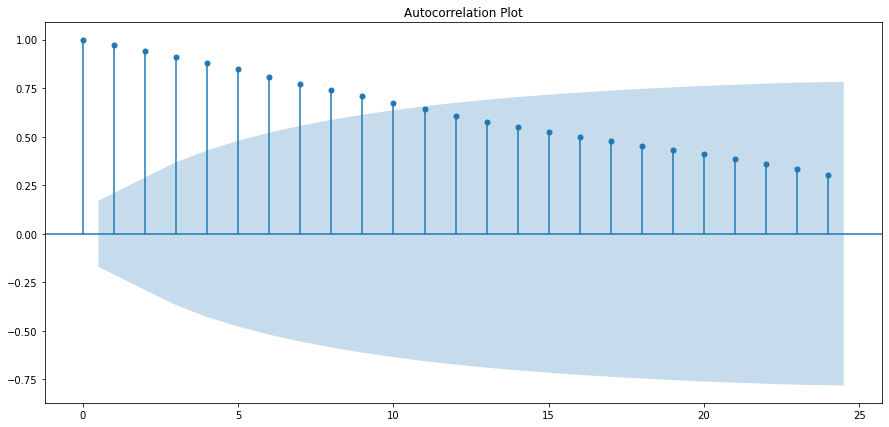

<Figure size 1080x504 with 0 Axes>

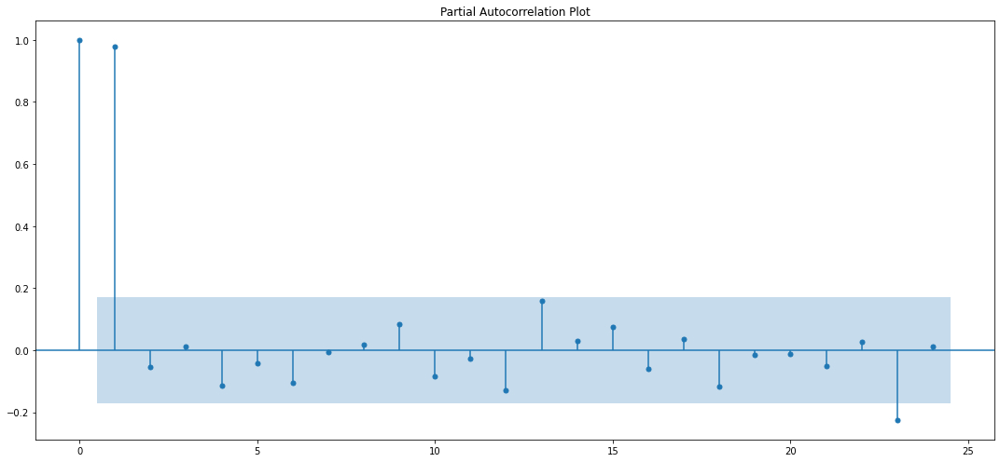

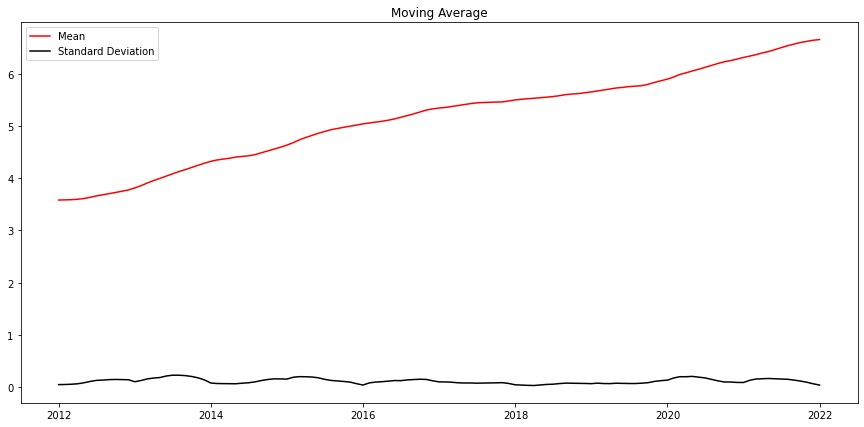

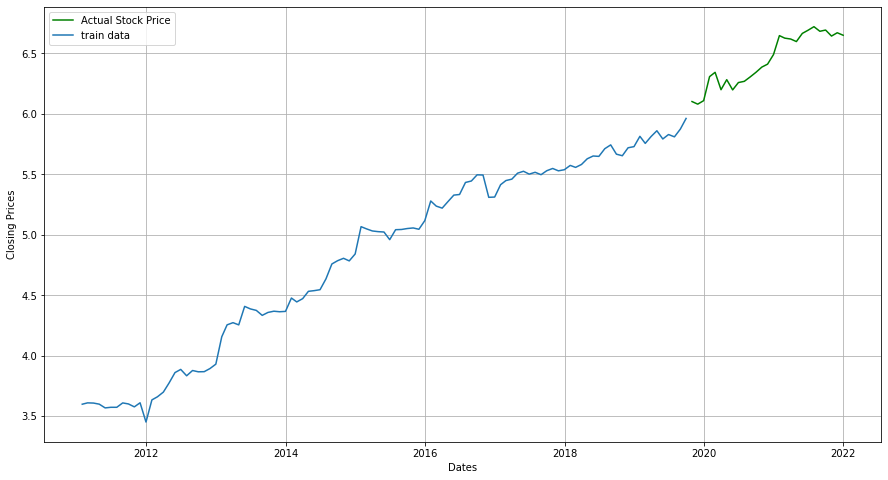

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1903.655668056835
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1745.2405115821616
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1447.0773673795559
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1237.787197037819
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1241.8174085498413
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1232.070066779413
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1170.0712849000906
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1146.4641303888434
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1722.3850696850648
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1480.0771006024918
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1321.999815597242
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1152.4480773757373
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1190.5839650959963
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1162.6124035475464
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 112

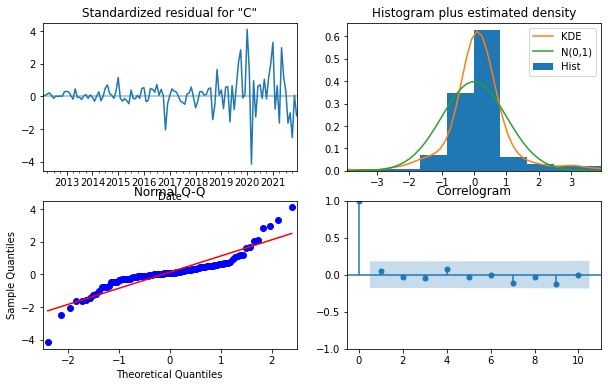

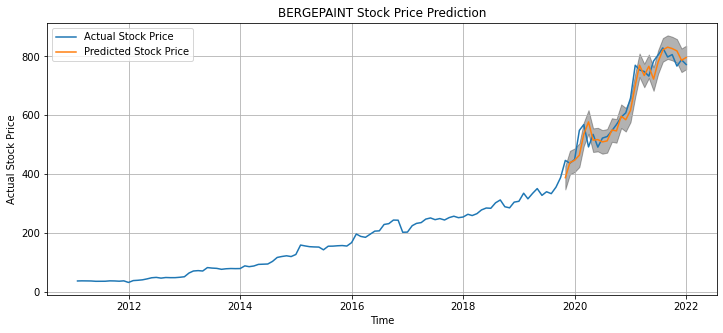

The Mean Squared Error is 1422.16
The root Mean Squared Error is 37.71


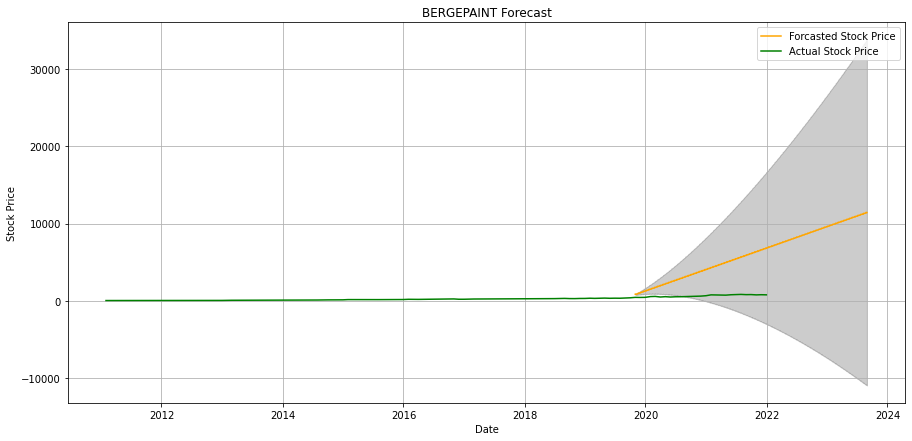

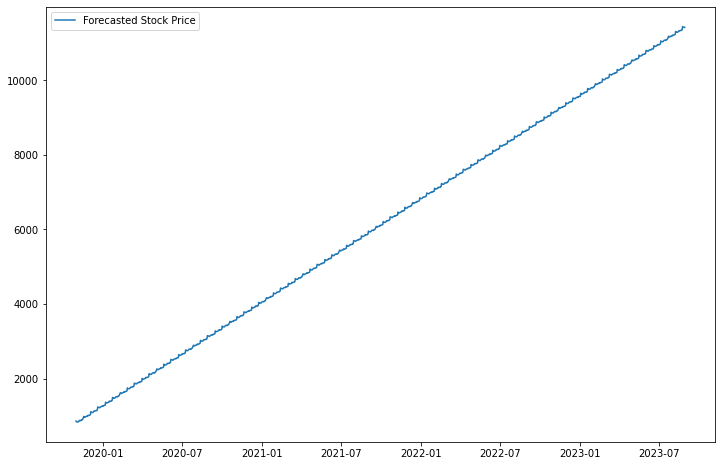

Epoch 1/50
2/2 [==============================] - 15s 182ms/step - loss: 0.2666
Epoch 2/50
2/2 [==============================] - 0s 182ms/step - loss: 0.1417
Epoch 3/50
2/2 [==============================] - 0s 197ms/step - loss: 0.0264
Epoch 4/50
2/2 [==============================] - 0s 189ms/step - loss: 0.0667
Epoch 5/50
2/2 [==============================] - 0s 220ms/step - loss: 0.0197
Epoch 6/50
2/2 [==============================] - 0s 177ms/step - loss: 0.0187
Epoch 7/50
2/2 [==============================] - 0s 202ms/step - loss: 0.0372
Epoch 8/50
2/2 [==============================] - 0s 186ms/step - loss: 0.0351
Epoch 9/50
2/2 [==============================] - 0s 185ms/step - loss: 0.0221
Epoch 10/50
2/2 [==============================] - 0s 180ms/step - loss: 0.0139
Epoch 11/50
2/2 [==============================] - 0s 173ms/step - loss: 0.0185
Epoch 12/50
2/2 [==============================] - 0s 219ms/step - loss: 0.0224
Epoch 13/50
2/2 [==============================]

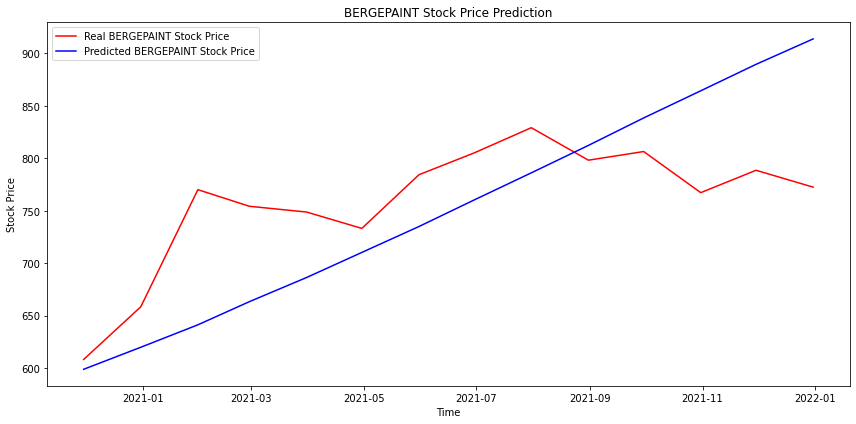

In [131]:
stock_market_prediction(NSE_data, symbol="BERGEPAINT", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### IGL

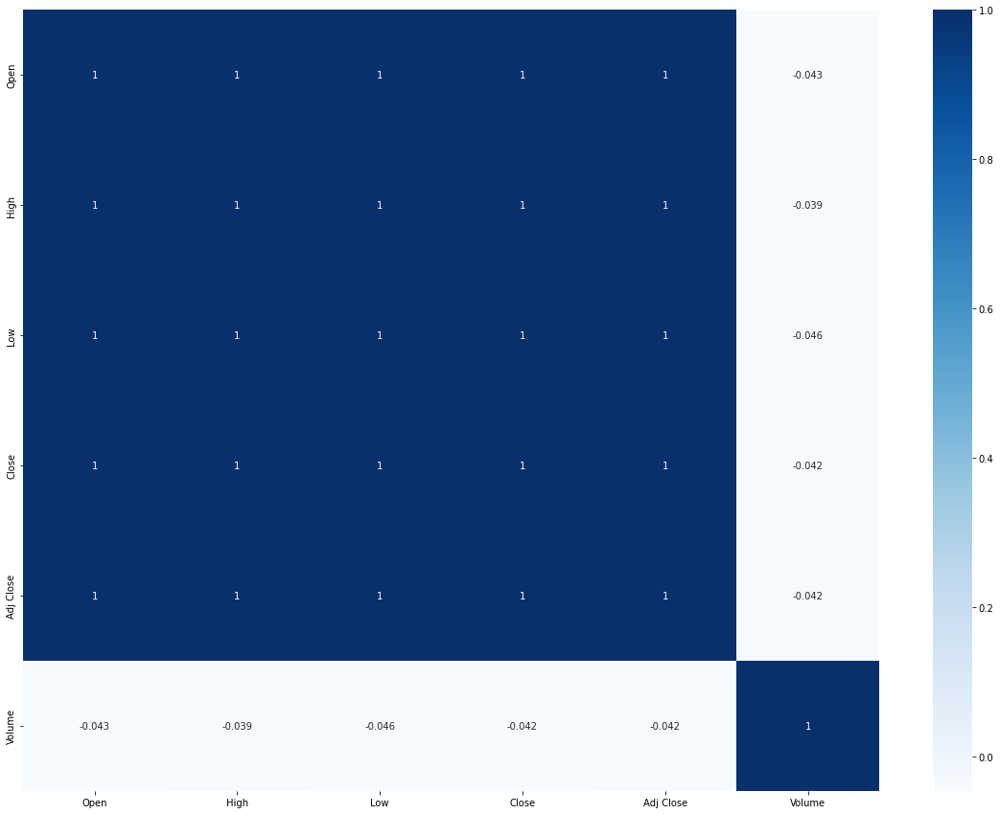

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.111462,0.995313,12,119,False,False


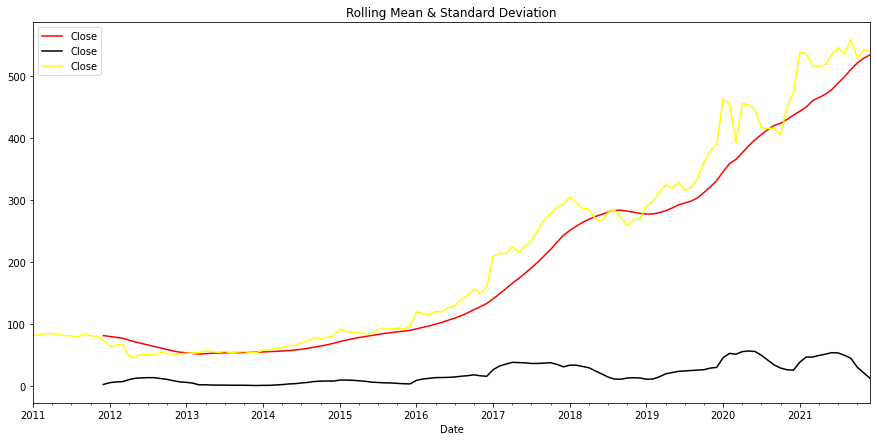

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

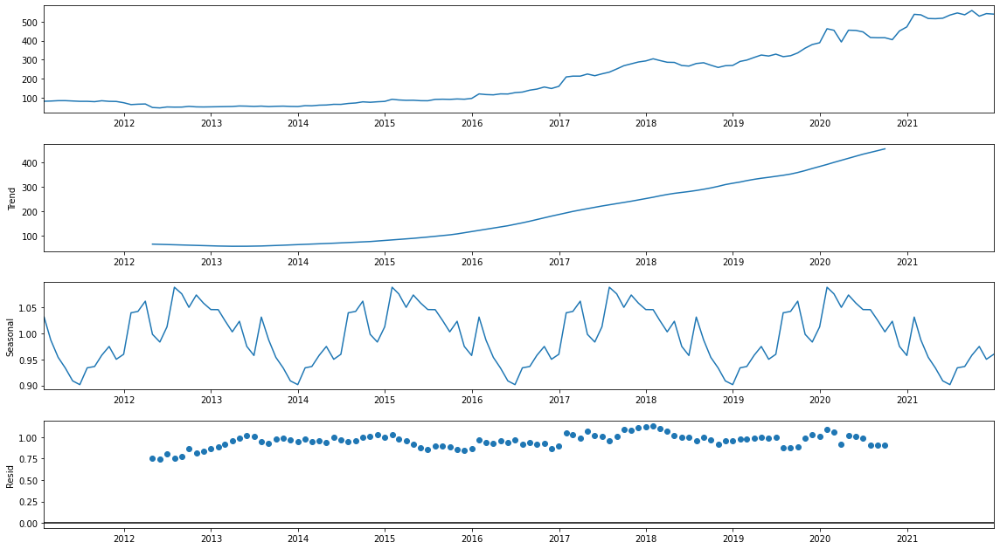

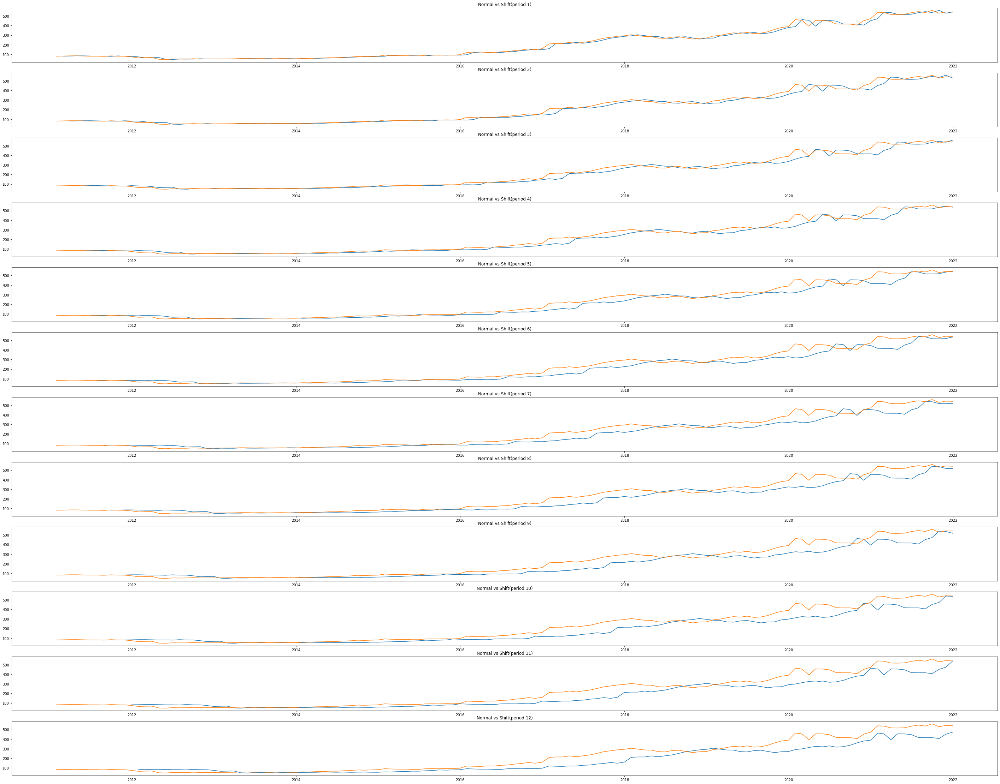

<Figure size 1080x504 with 0 Axes>

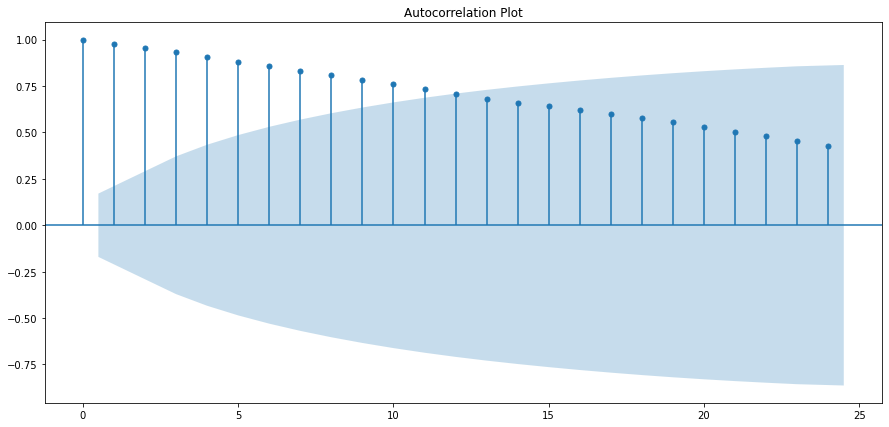

<Figure size 1080x504 with 0 Axes>

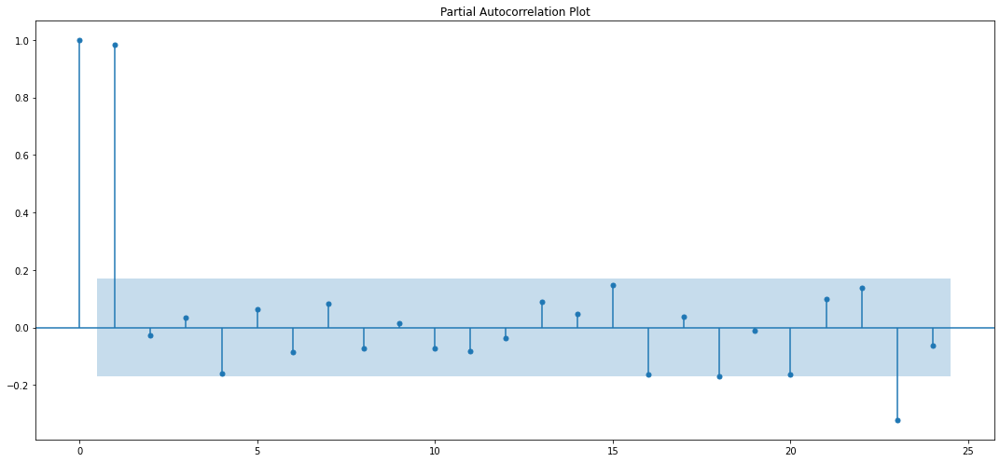

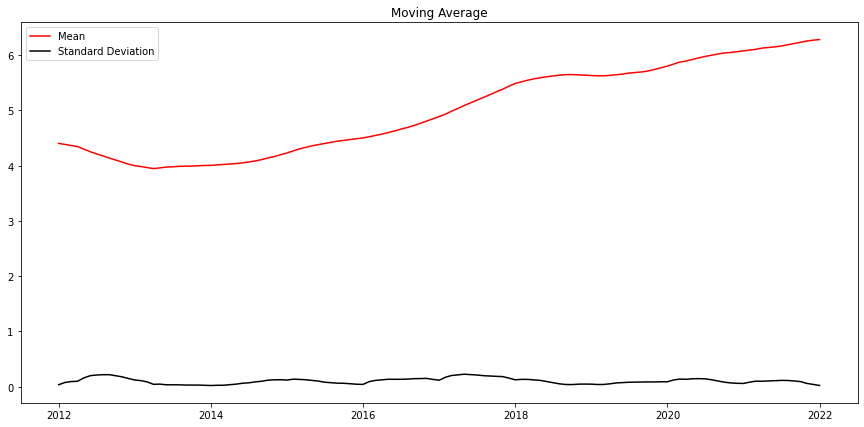

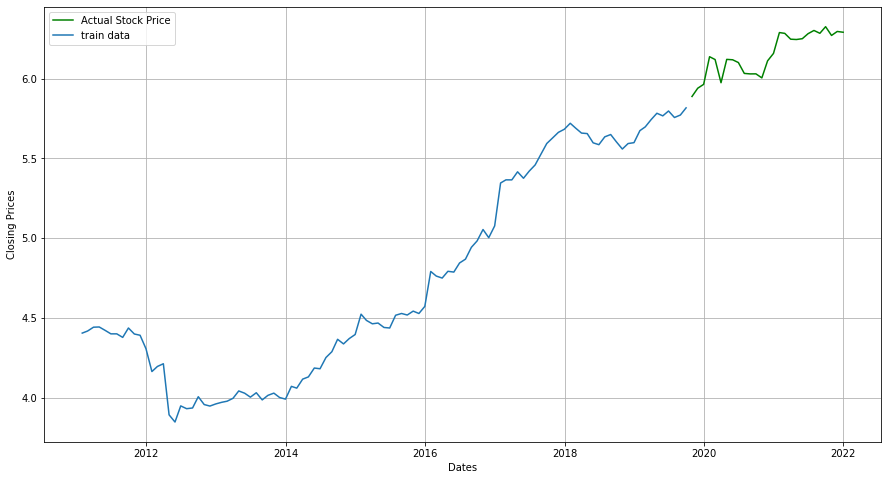

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1835.948065861699
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1573.24765092918
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1343.4304273386974
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1194.1936180686512
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1241.4185989788025
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1218.3636976517544
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1182.607086942581
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1147.221064663892
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1652.8273959981689
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1409.0732145025713
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1201.307091663972
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1077.403564780411
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1140.0057223815754
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1105.1805361854288
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1084.6

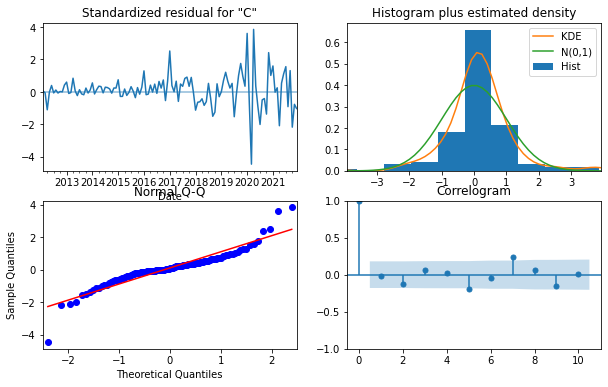

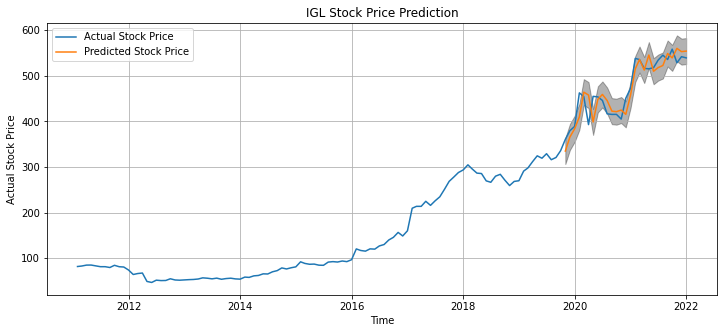

The Mean Squared Error is 677.37
The root Mean Squared Error is 26.03


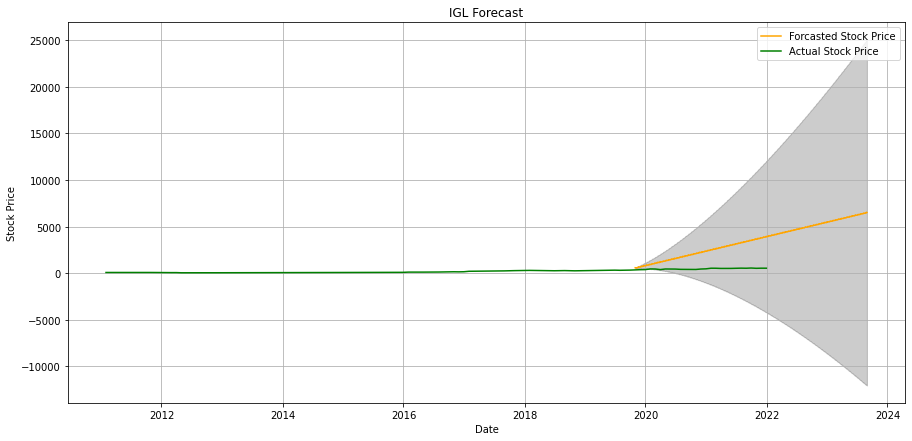

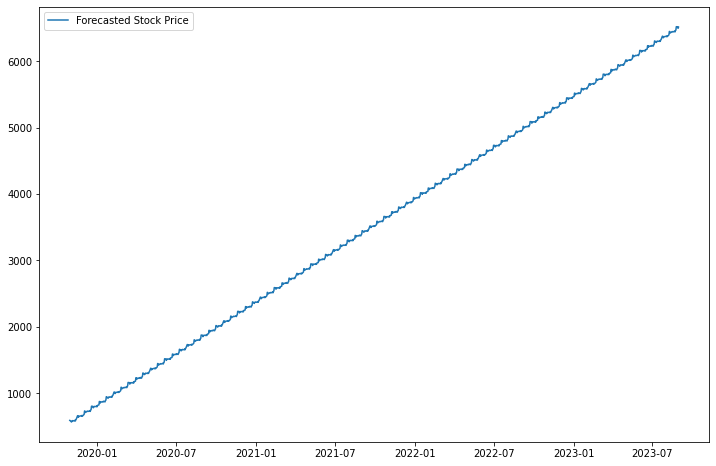

Epoch 1/50
2/2 [==============================] - 13s 186ms/step - loss: 0.3269
Epoch 2/50
2/2 [==============================] - 0s 173ms/step - loss: 0.1757
Epoch 3/50
2/2 [==============================] - 0s 182ms/step - loss: 0.0316
Epoch 4/50
2/2 [==============================] - 0s 178ms/step - loss: 0.0616
Epoch 5/50
2/2 [==============================] - 0s 166ms/step - loss: 0.0207
Epoch 6/50
2/2 [==============================] - 0s 152ms/step - loss: 0.0150
Epoch 7/50
2/2 [==============================] - 0s 187ms/step - loss: 0.0294
Epoch 8/50
2/2 [==============================] - 0s 155ms/step - loss: 0.0281
Epoch 9/50
2/2 [==============================] - 0s 183ms/step - loss: 0.0182
Epoch 10/50
2/2 [==============================] - 0s 174ms/step - loss: 0.0091
Epoch 11/50
2/2 [==============================] - 0s 170ms/step - loss: 0.0144
Epoch 12/50
2/2 [==============================] - 0s 151ms/step - loss: 0.0186
Epoch 13/50
2/2 [==============================]

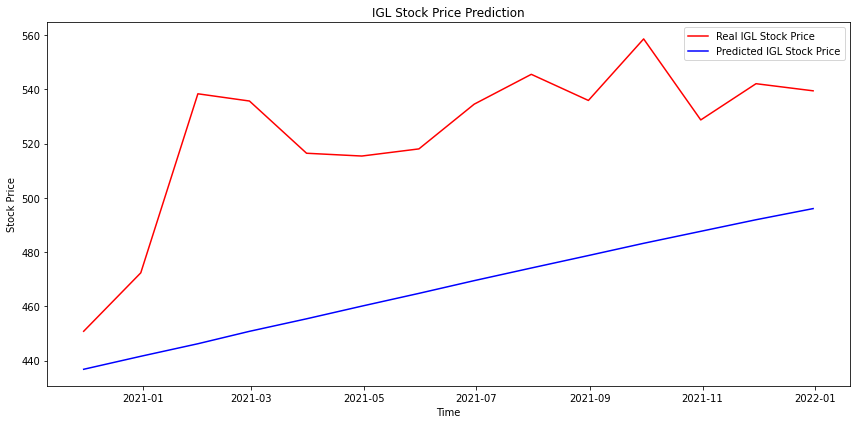

In [132]:
stock_market_prediction(NSE_data, symbol="IGL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### KANSAINER


In [ ]:
stock_market_prediction(NSE_data, symbol="KANSAINER", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### RELAXO

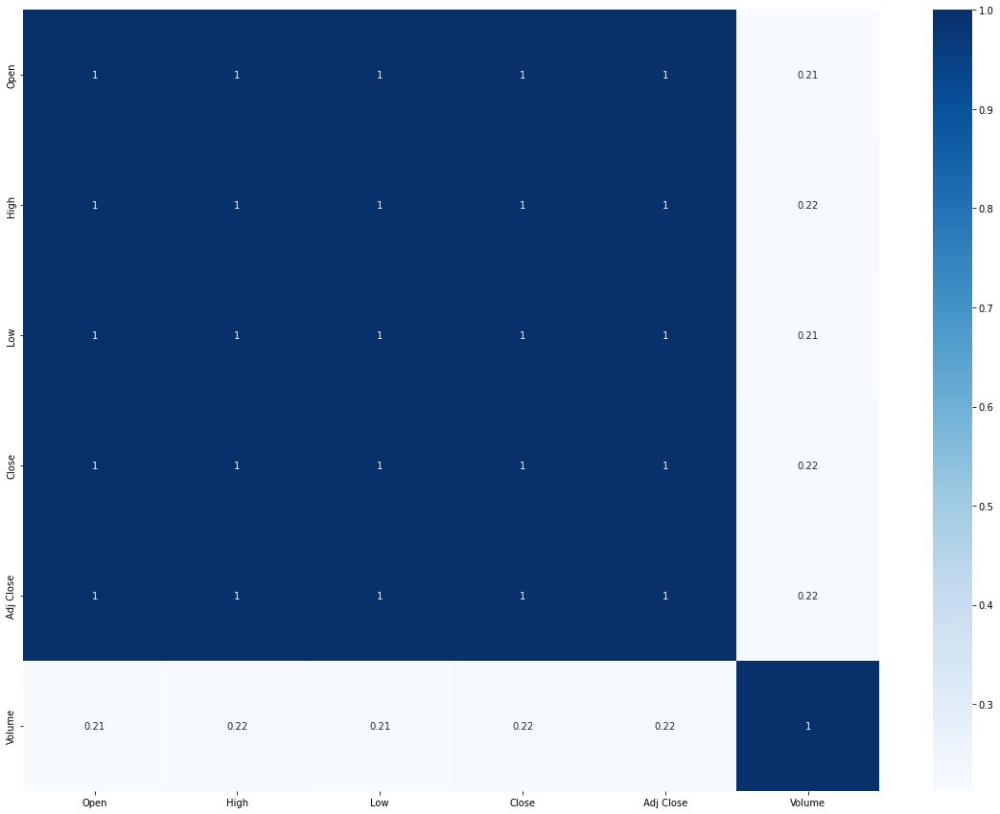

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,1.990985,0.998661,12,119,False,False


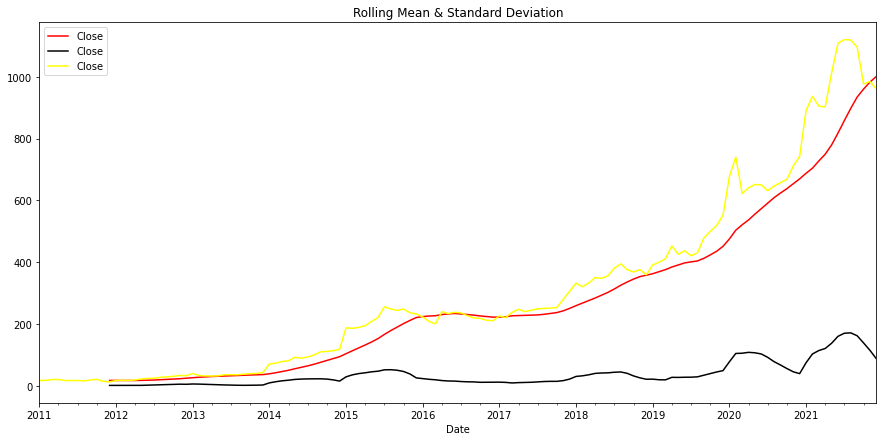

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

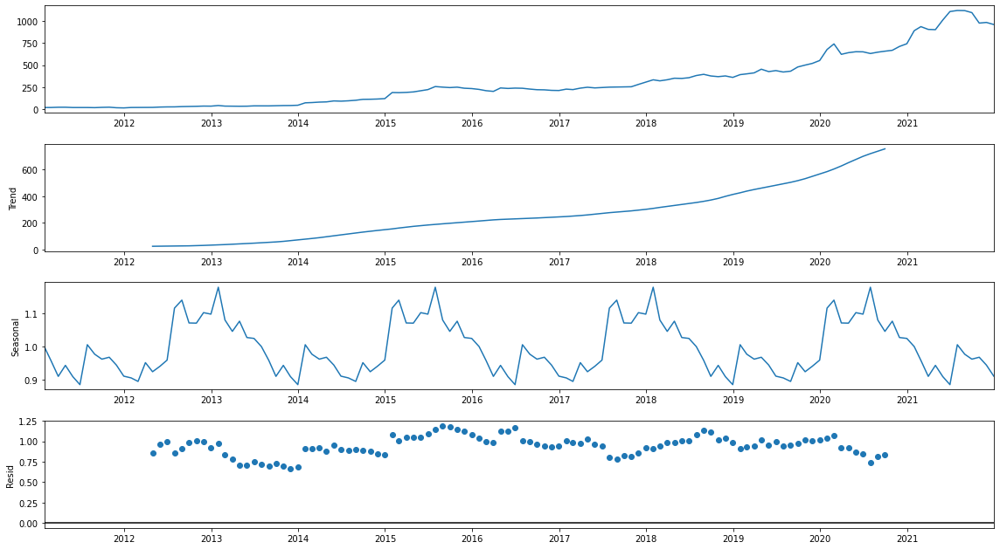

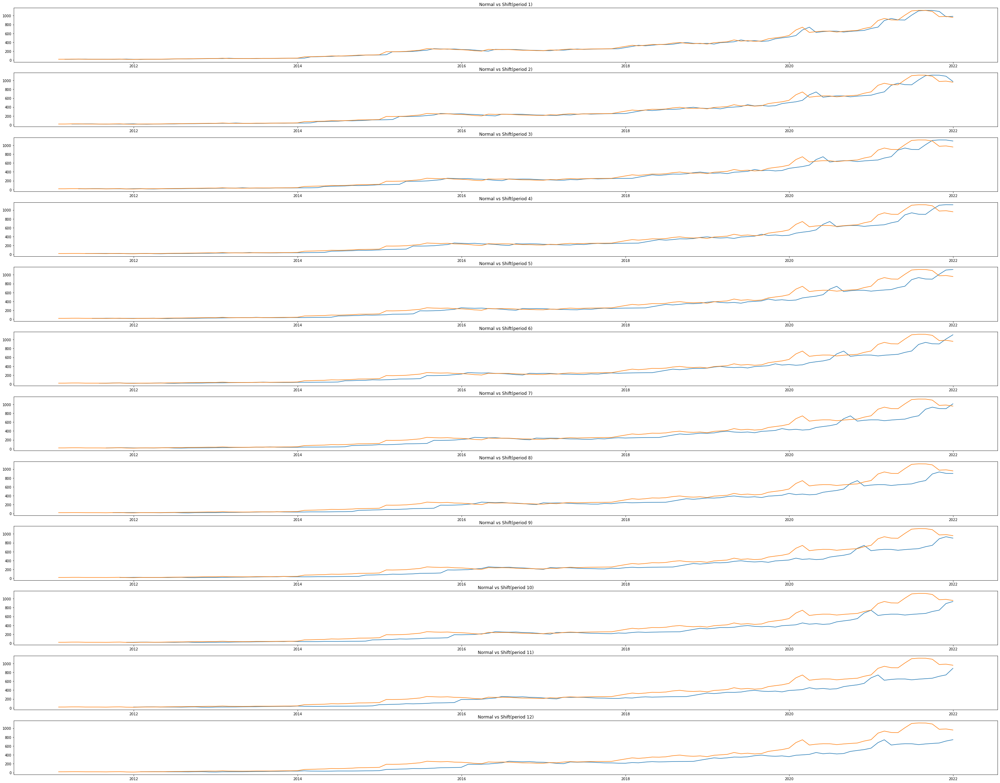

<Figure size 1080x504 with 0 Axes>

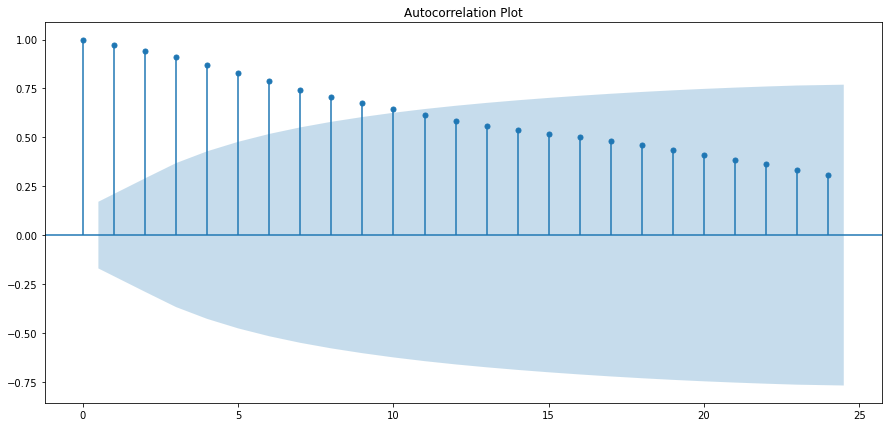

<Figure size 1080x504 with 0 Axes>

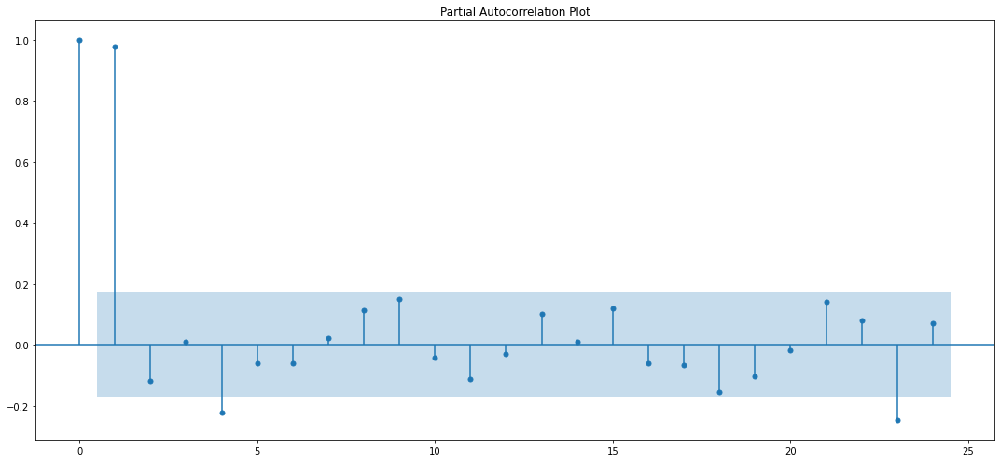

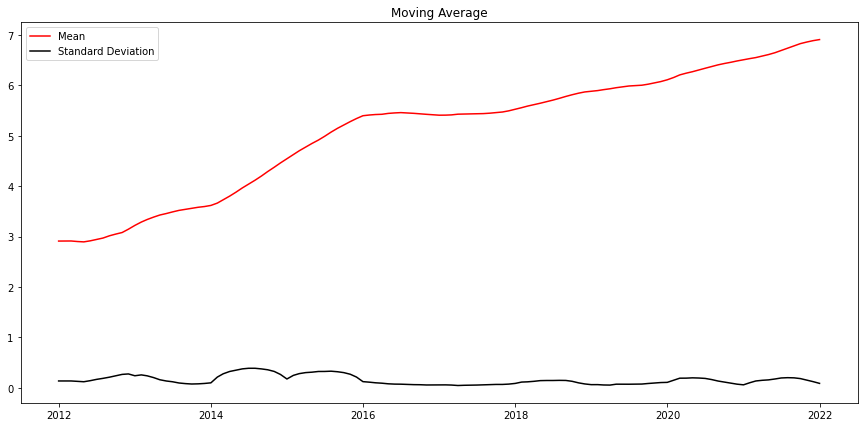

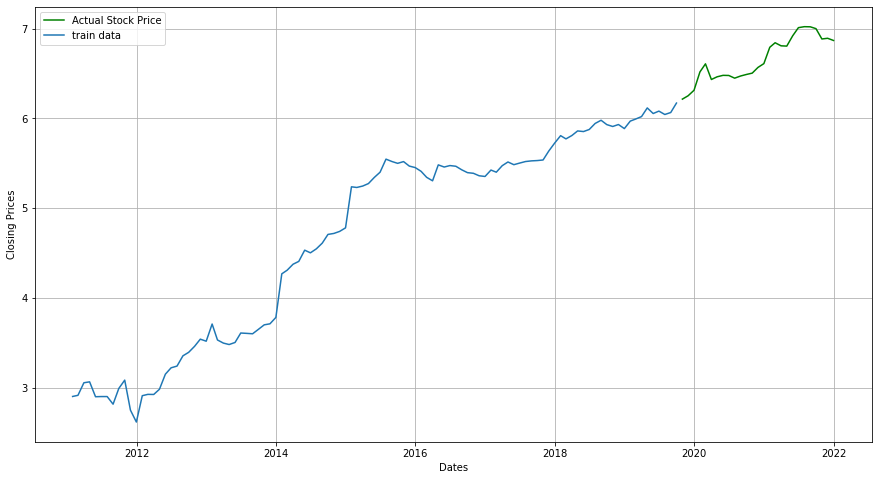

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 1959.1921711170862
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1695.8580558004273
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1527.5934711981886
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1333.986533045473
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1368.3808724201178
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1348.7058140480804
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1302.7321081379848
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1260.0721773658063
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 1776.52907841169
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1532.9279994404378
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1377.521927468173
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1220.804568813922
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1273.4870110005534
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1238.8224066090963
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1214

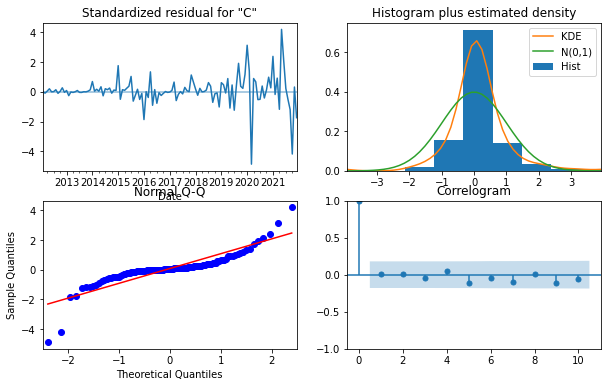

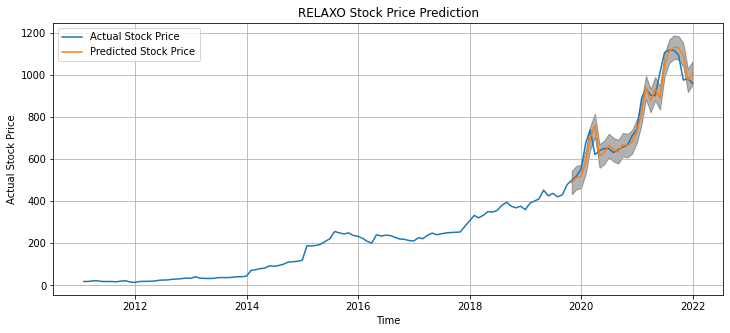

The Mean Squared Error is 2815.12
The root Mean Squared Error is 53.06


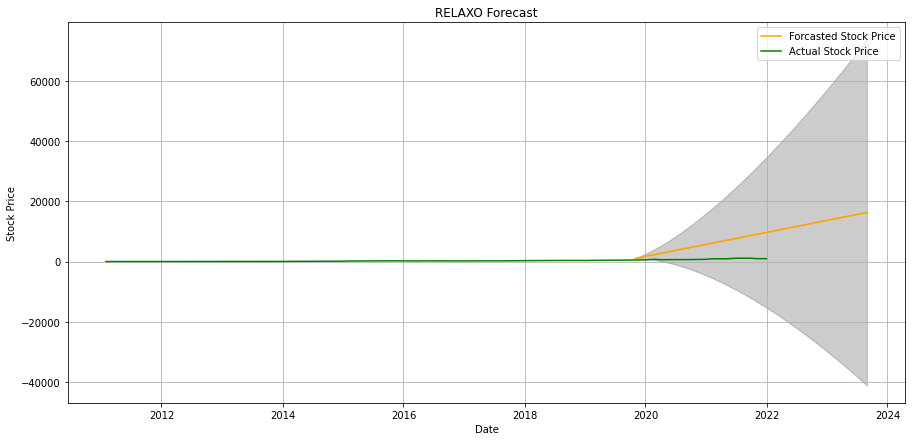

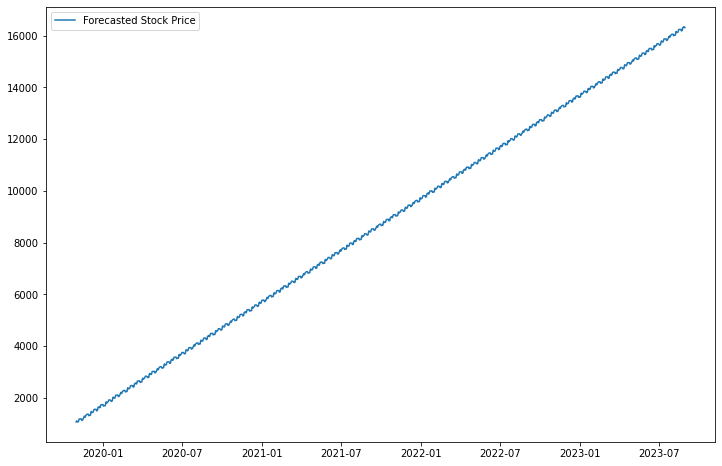

Epoch 1/50
2/2 [==============================] - 13s 183ms/step - loss: 0.3059
Epoch 2/50
2/2 [==============================] - 0s 167ms/step - loss: 0.1806
Epoch 3/50
2/2 [==============================] - 0s 193ms/step - loss: 0.0637
Epoch 4/50
2/2 [==============================] - 0s 165ms/step - loss: 0.0424
Epoch 5/50
2/2 [==============================] - 0s 164ms/step - loss: 0.0518
Epoch 6/50
2/2 [==============================] - 0s 150ms/step - loss: 0.0159
Epoch 7/50
2/2 [==============================] - 0s 179ms/step - loss: 0.0259
Epoch 8/50
2/2 [==============================] - 0s 146ms/step - loss: 0.0345
Epoch 9/50
2/2 [==============================] - 0s 184ms/step - loss: 0.0289
Epoch 10/50
2/2 [==============================] - 0s 171ms/step - loss: 0.0165
Epoch 11/50
2/2 [==============================] - 0s 133ms/step - loss: 0.0139
Epoch 12/50
2/2 [==============================] - 0s 157ms/step - loss: 0.0198
Epoch 13/50
2/2 [==============================]

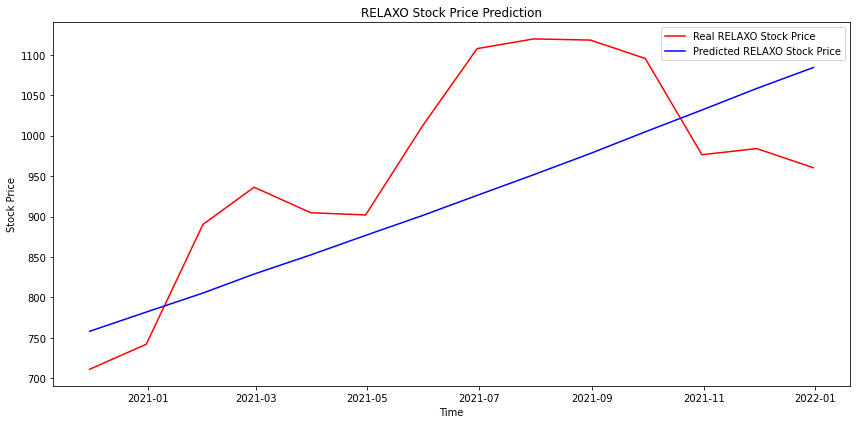

In [134]:
stock_market_prediction(NSE_data, symbol="RELAXO", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### CDSL

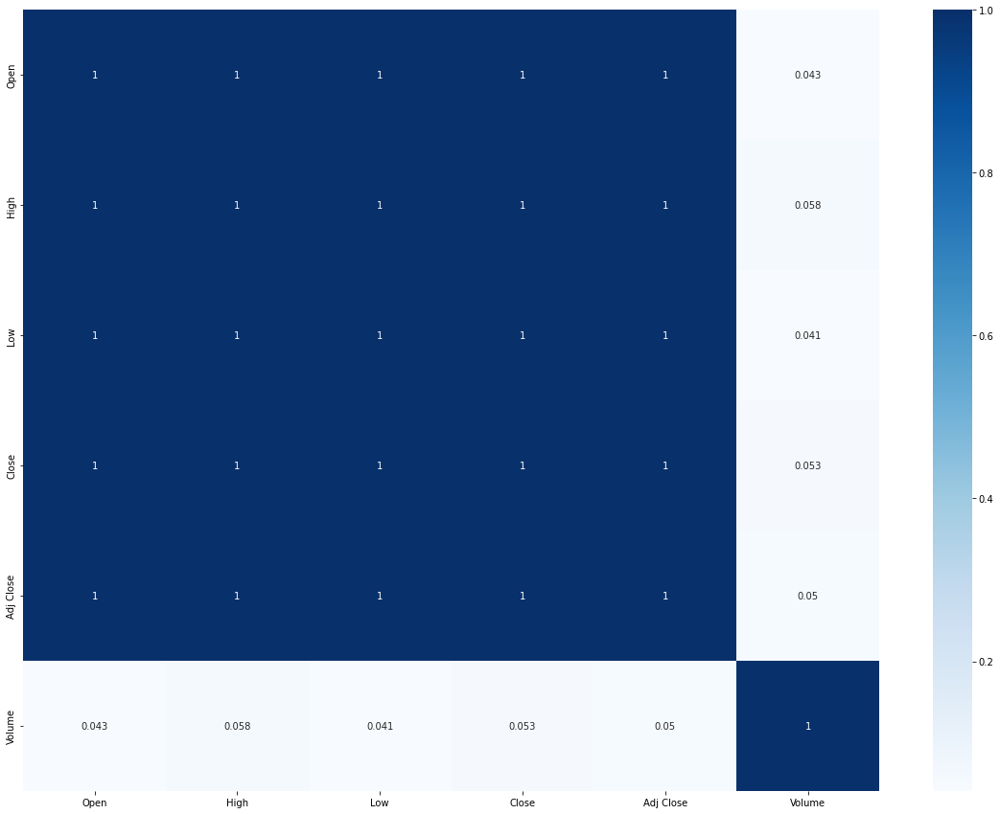

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-3.669246,0.004567,6,53,True,True


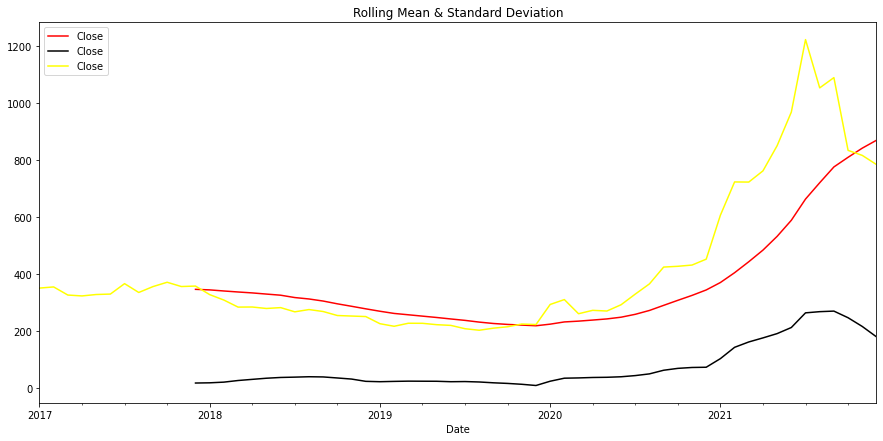

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

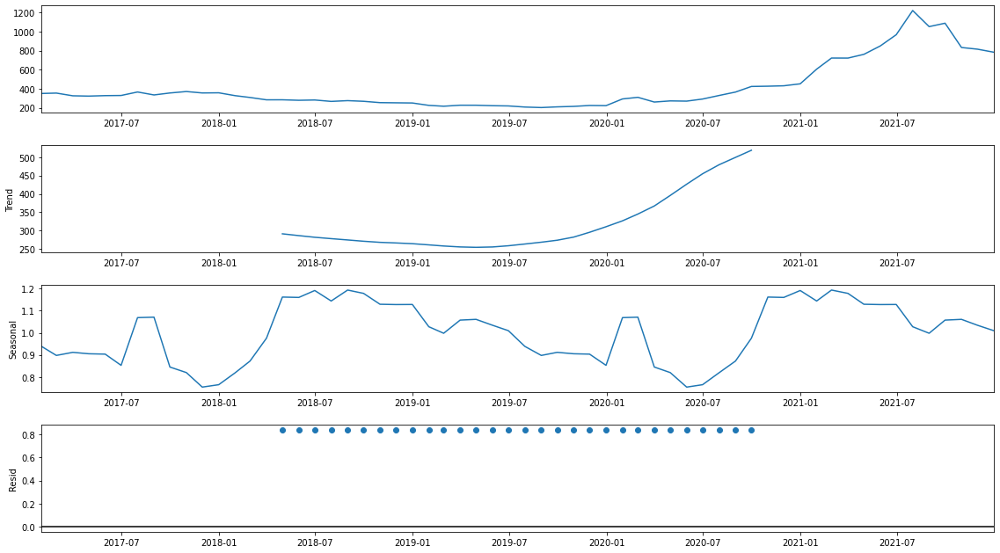

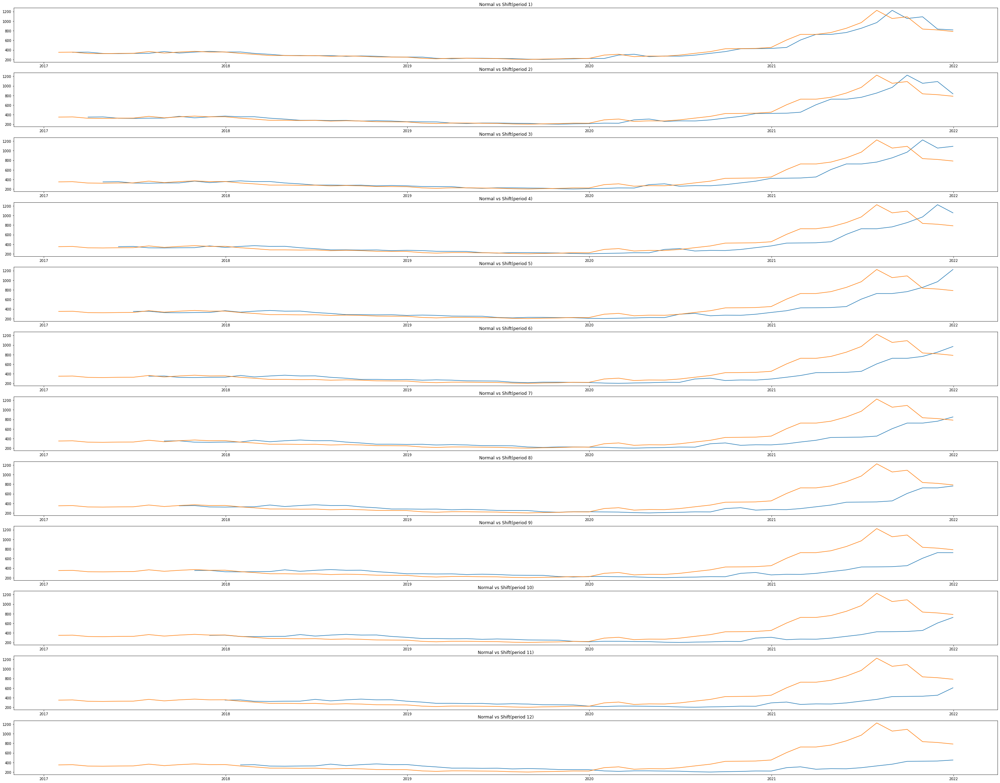

<Figure size 1080x504 with 0 Axes>

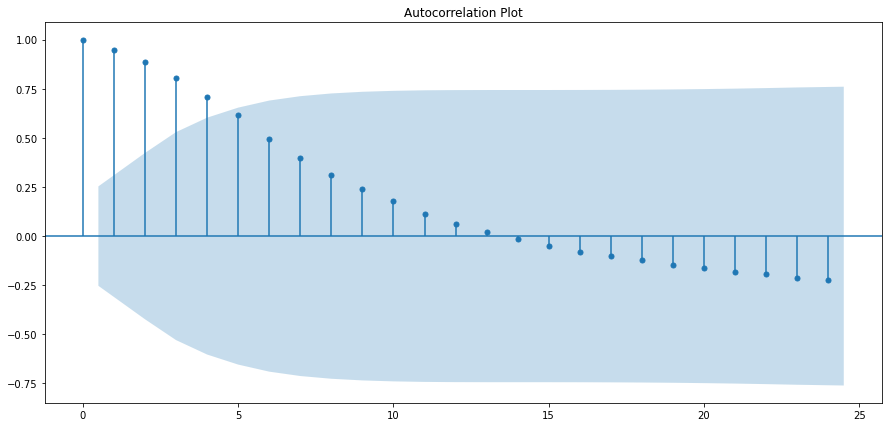

<Figure size 1080x504 with 0 Axes>

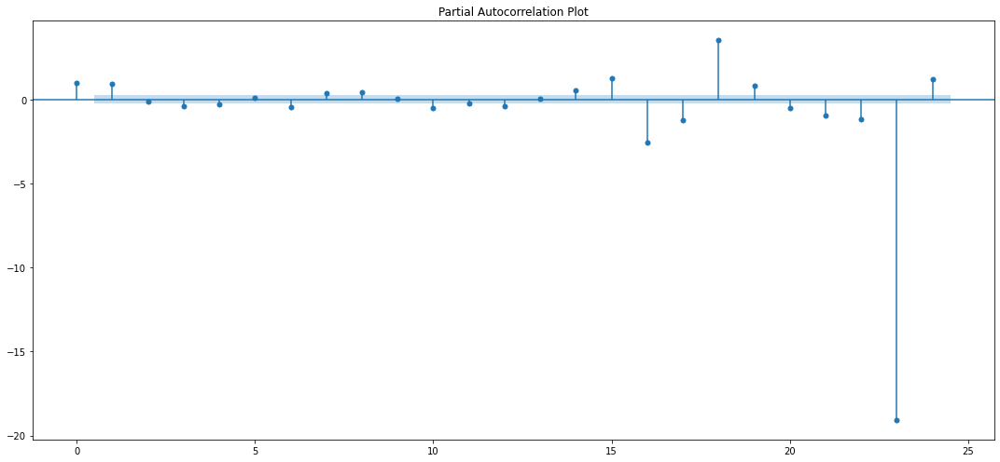

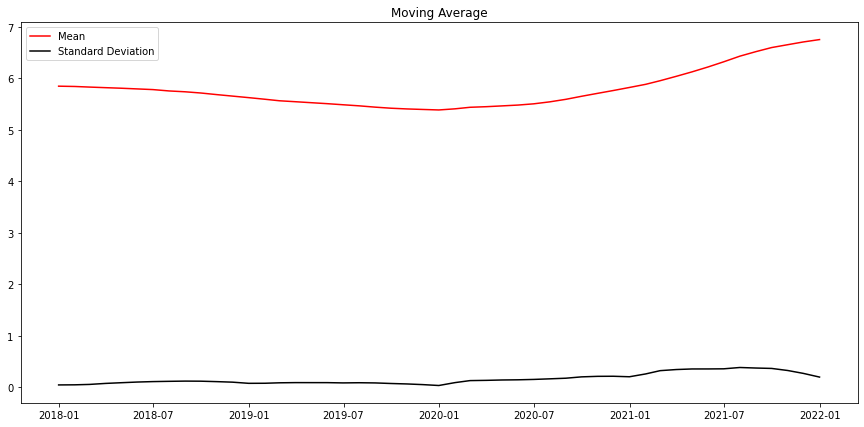

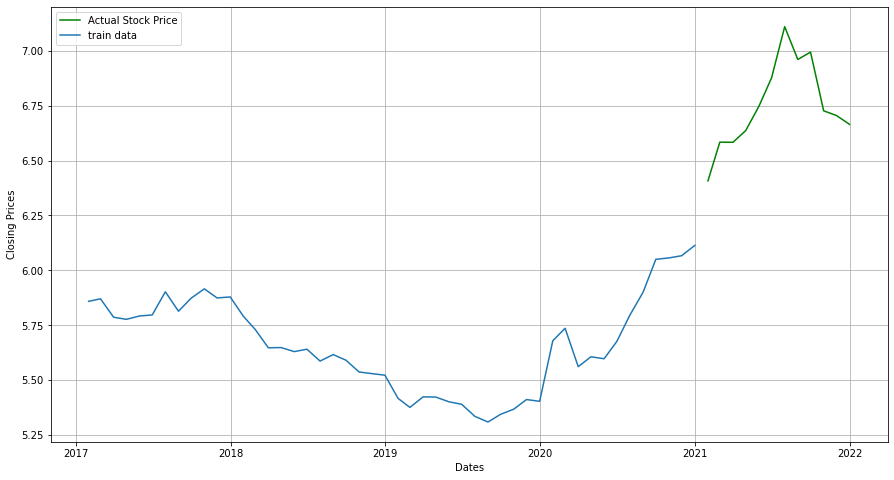

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 898.499922538893
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 704.7507111344826
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 669.2404374743152
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1560.5358602101296
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 672.4714095416282
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 653.2013976886678
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 506.8349476869629
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1310.9163230053225
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 816.2543081816654
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 641.2893291232646
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 609.9486792622334
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1123.2711917352176
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 627.8162425972316
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 601.3861935068018
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 477.0214996

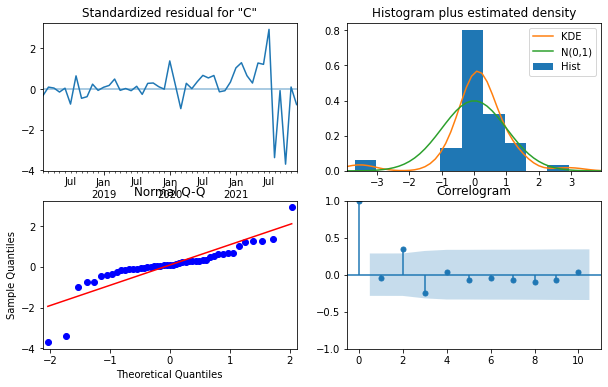

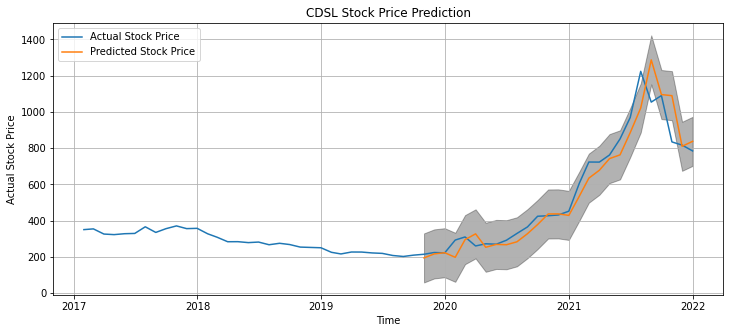

The Mean Squared Error is 7950.3
The root Mean Squared Error is 89.16


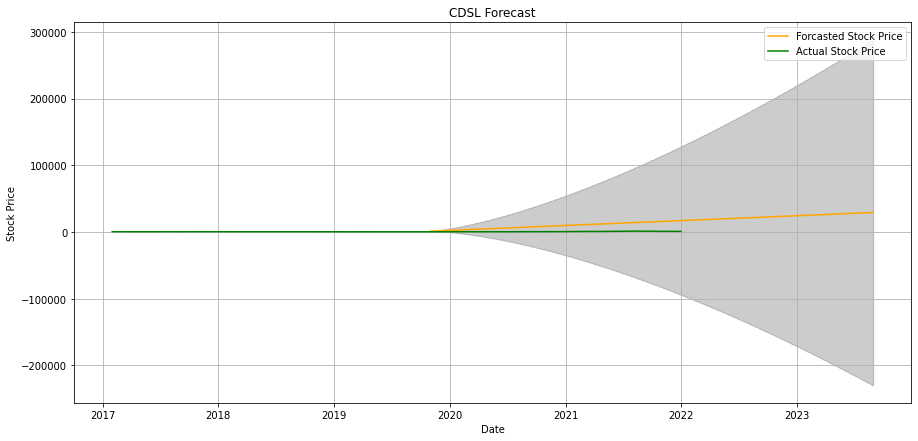

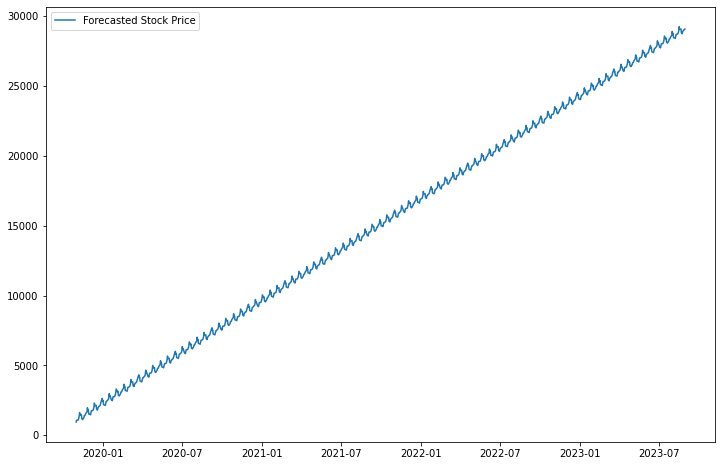

IndexError: tuple index out of range

In [135]:
stock_market_prediction(NSE_data, symbol="CDSL", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### HDFCLIFE

In [ ]:
stock_market_prediction(NSE_data, symbol="HDFCLIFE", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### IEX

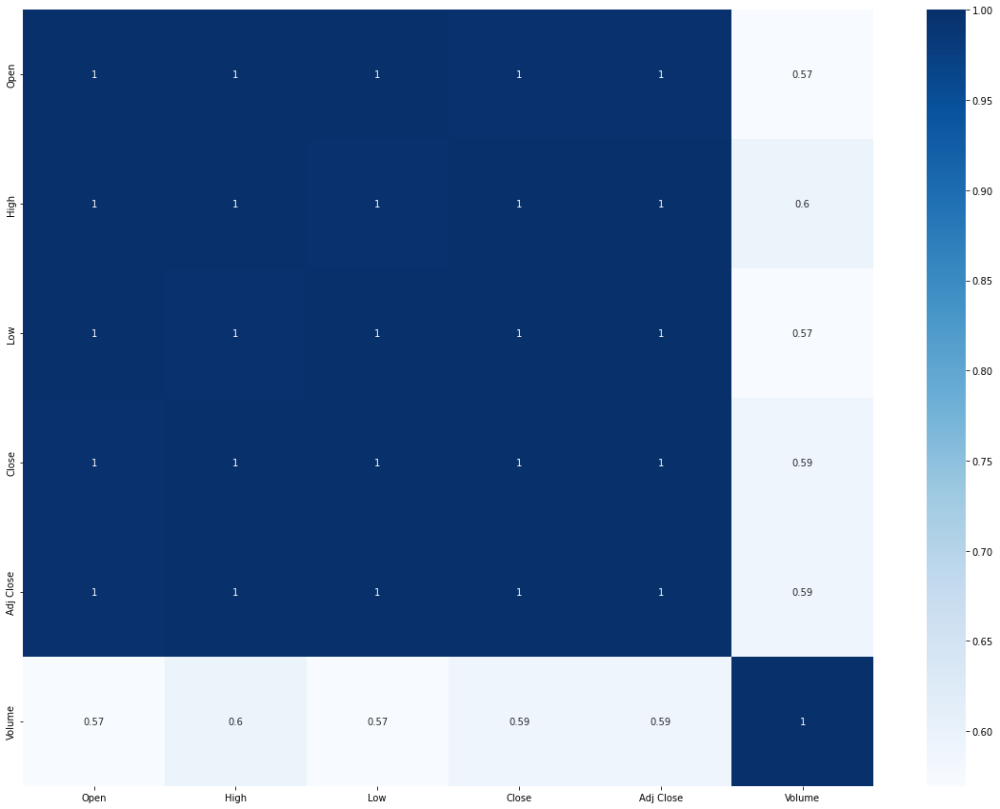

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.436531,0.903818,0,59,False,False


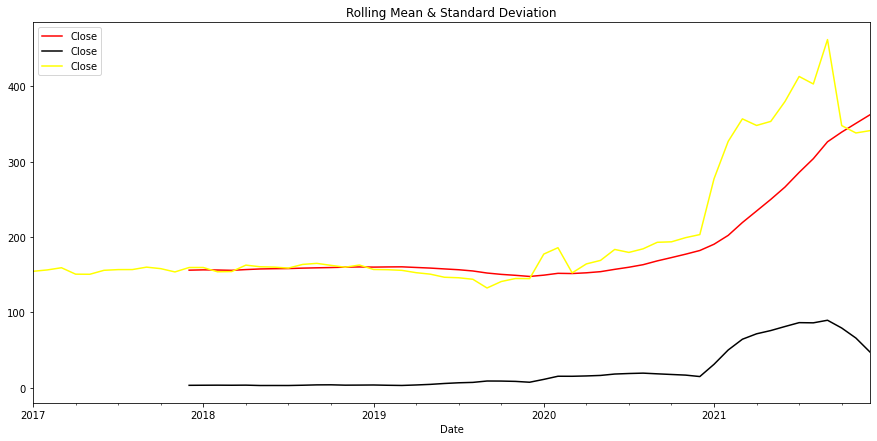

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

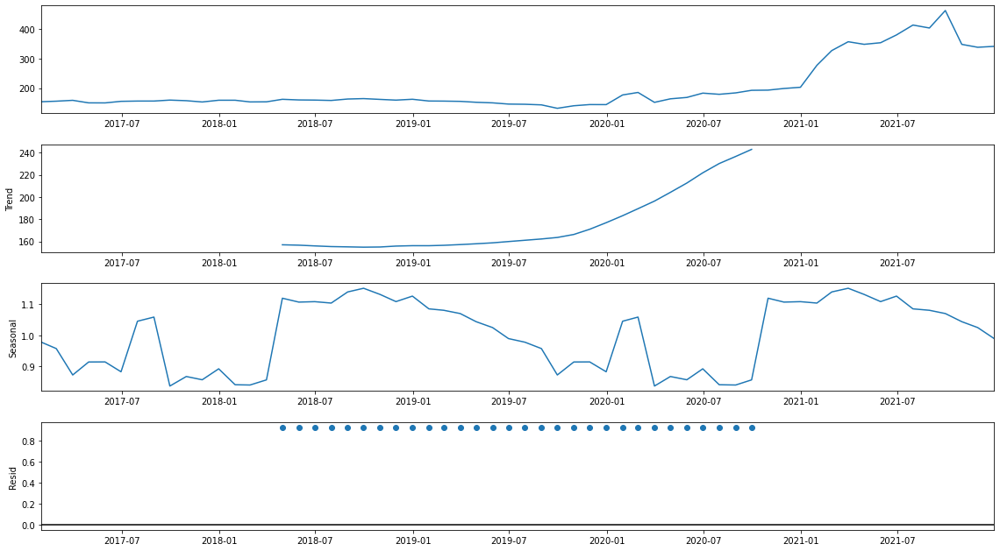

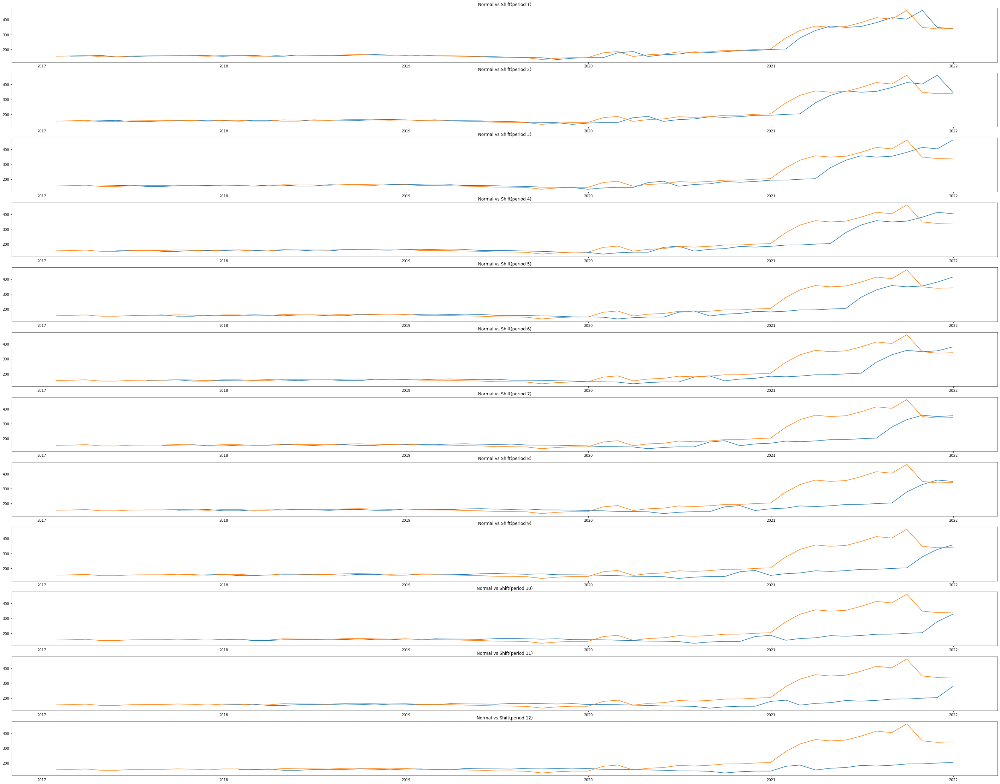

<Figure size 1080x504 with 0 Axes>

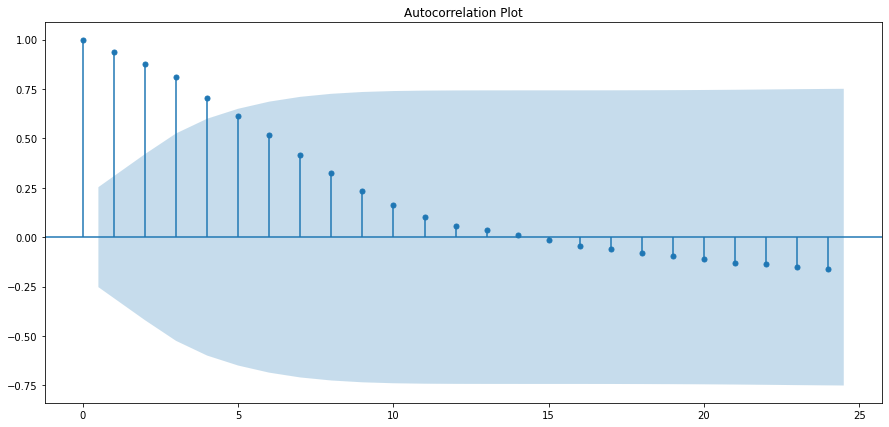

<Figure size 1080x504 with 0 Axes>

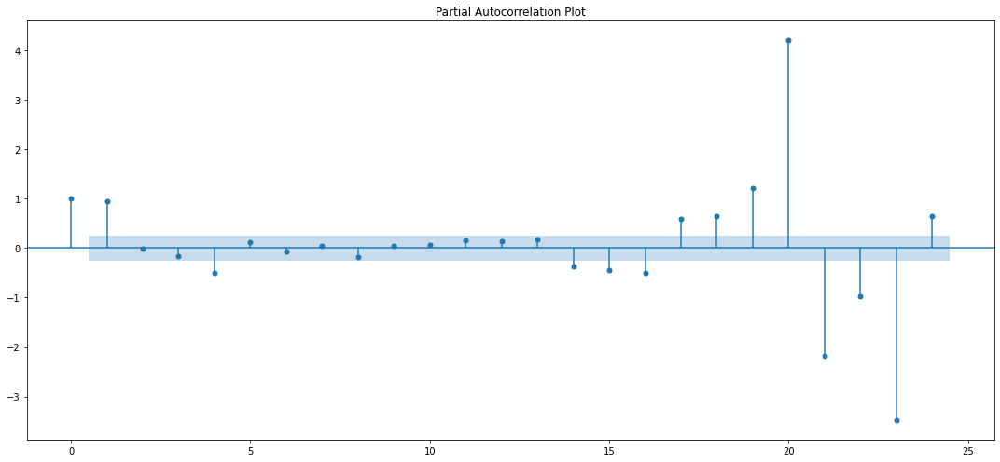

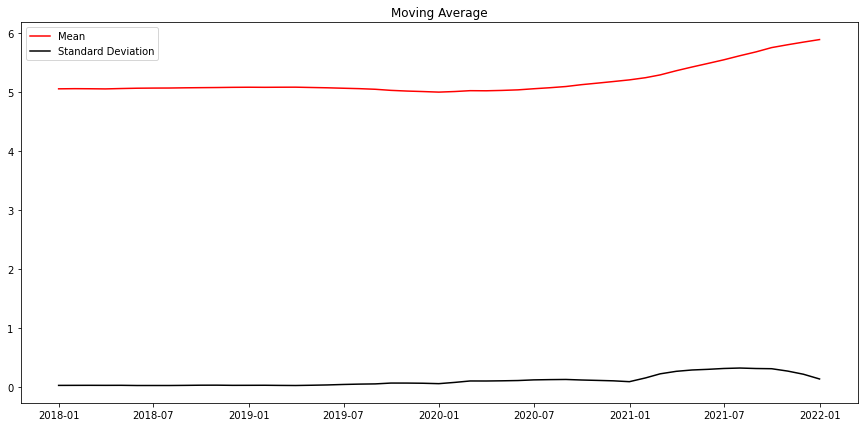

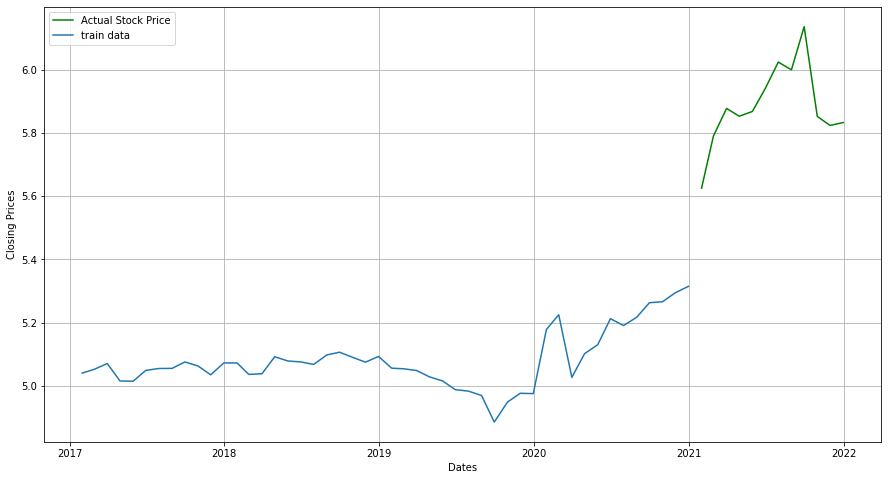

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 805.5416334166083
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 625.6483625513039
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 564.8613409745758
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1527.2497680179208
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 557.6559949378367
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 543.1237972288196
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 422.1697694389121
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1460.3716649222054
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 721.6908340855697
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 561.3528958892641
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 510.52152661802455
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1459.744620589497
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 517.9147815537185
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 497.8852622918674
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 399.308996

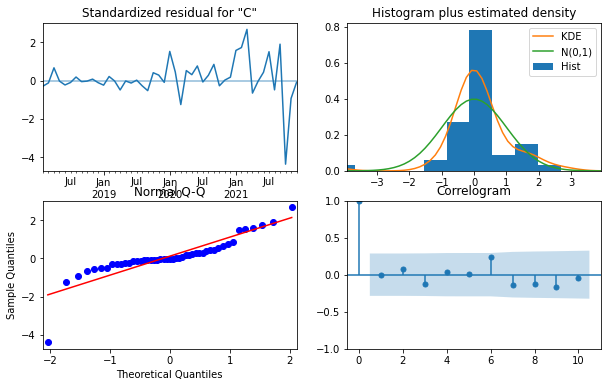

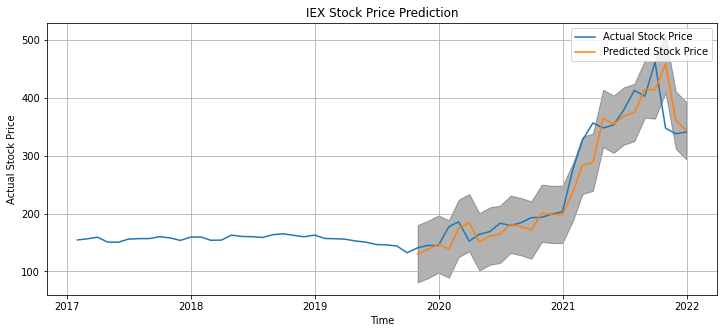

The Mean Squared Error is 1083.58
The root Mean Squared Error is 32.92


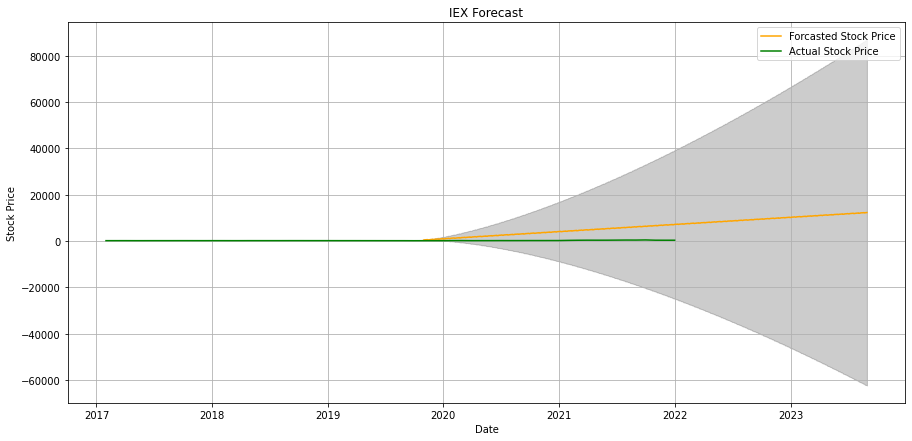

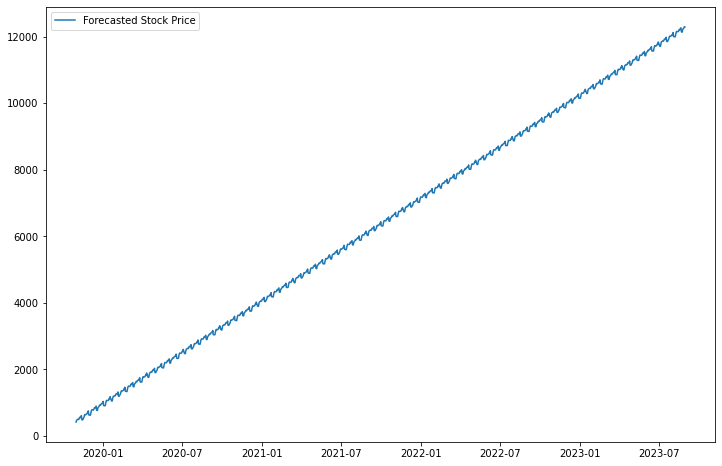

IndexError: tuple index out of range

In [137]:
stock_market_prediction(NSE_data, symbol="IEX", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### SIEMENS

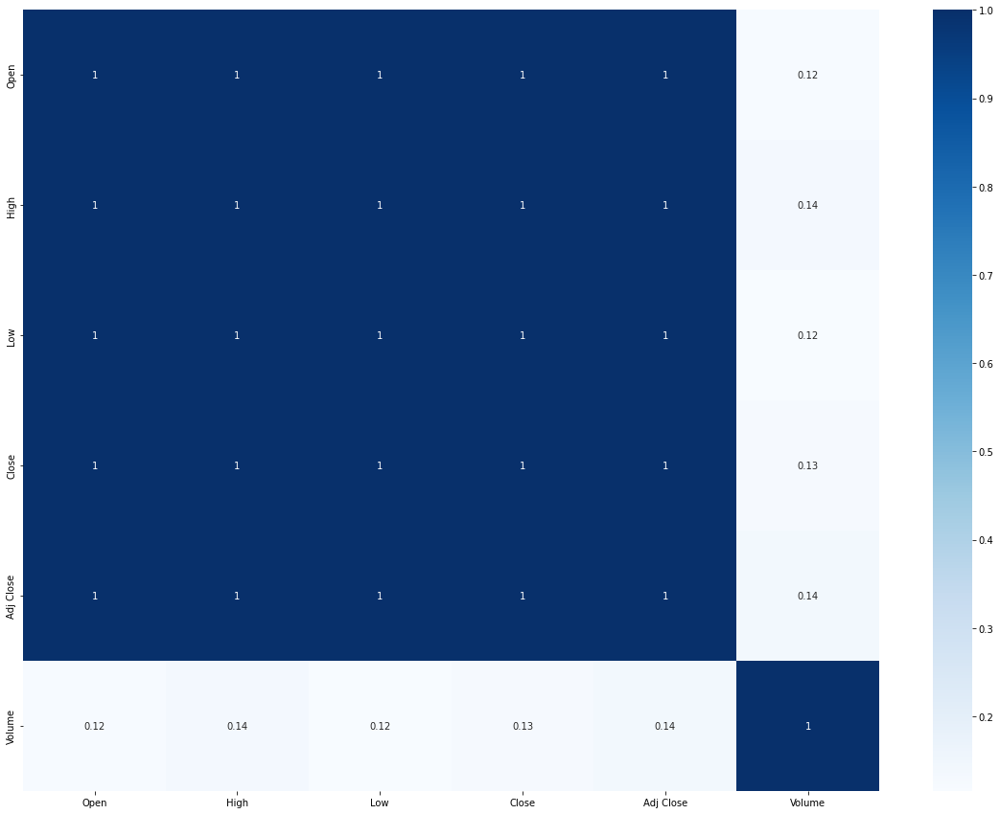

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.644513,0.860603,1,130,False,False


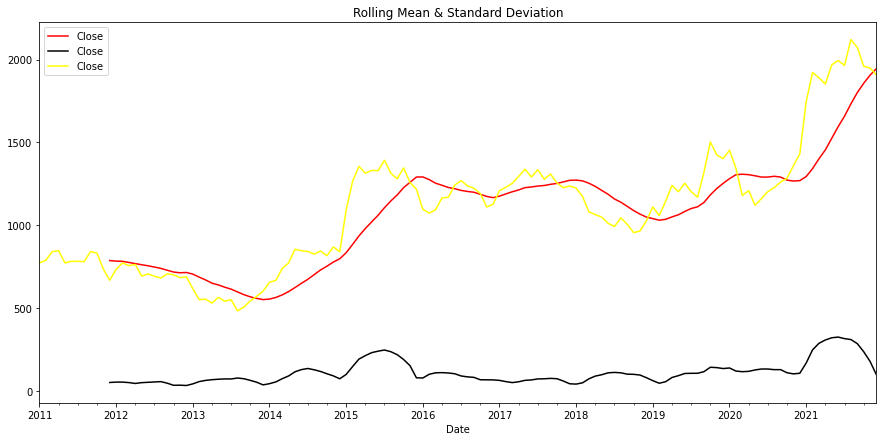

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

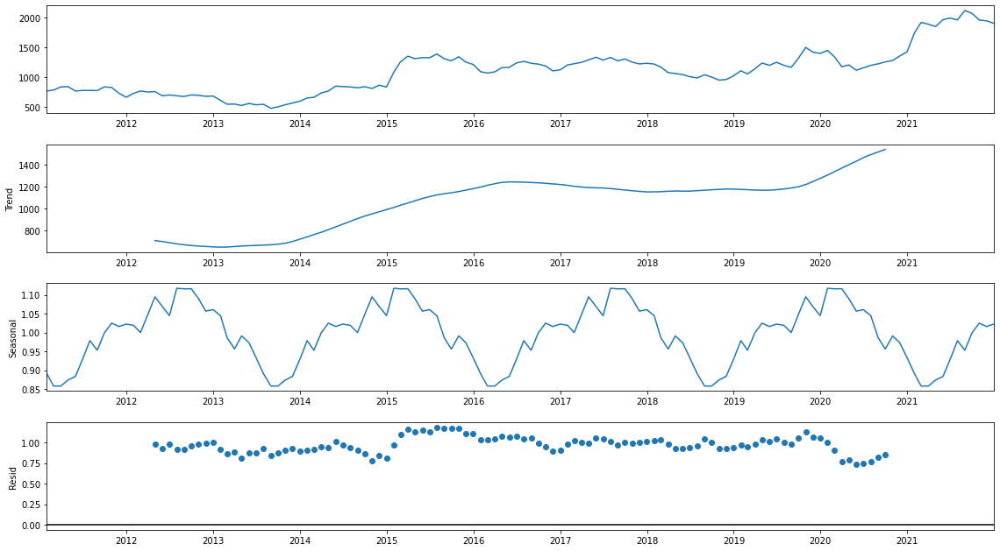

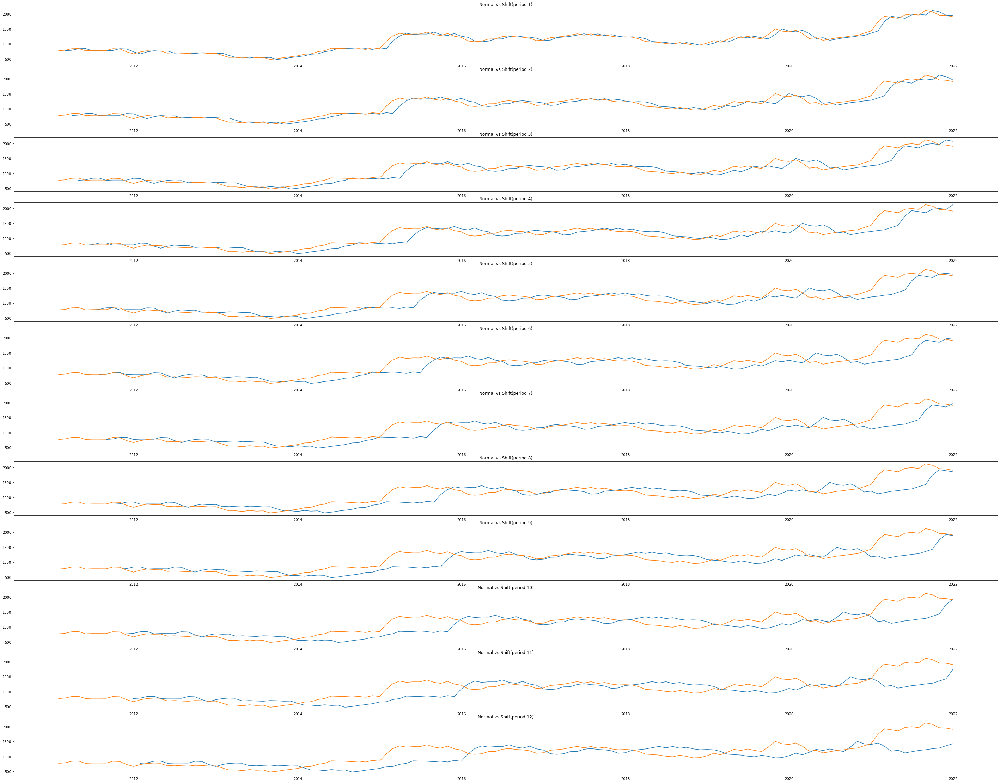

<Figure size 1080x504 with 0 Axes>

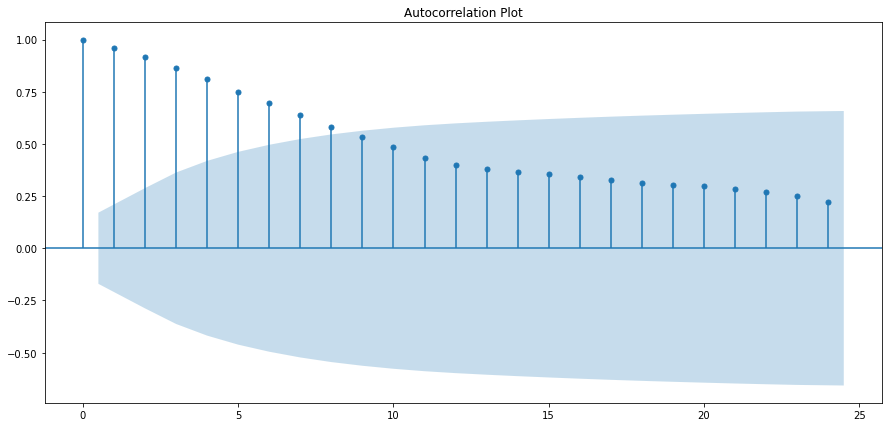

<Figure size 1080x504 with 0 Axes>

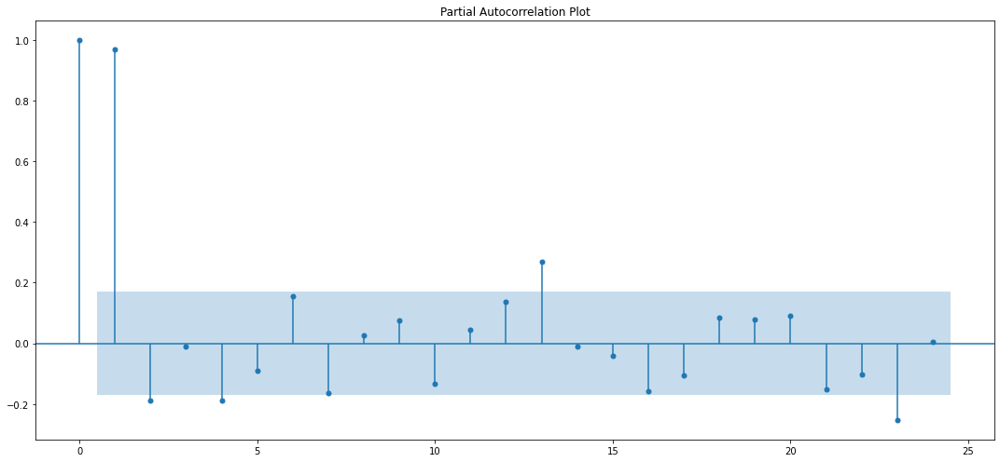

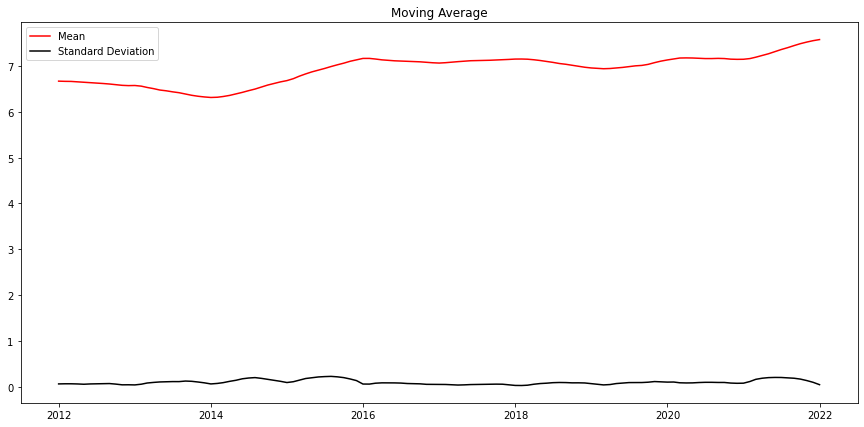

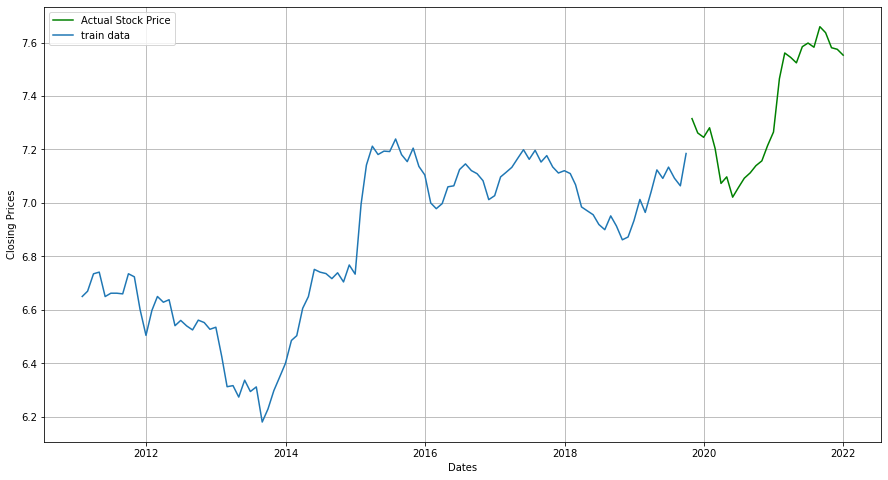

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 2223.4008256802235
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 1934.657171039164
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 1714.5533958287529
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 1553.035286427413
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 1717.2768865541298
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 1665.786138252993
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 1566.2968574357974
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 1548.5047299010796
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 2039.9041193525368
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 1773.2372385231042
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 1577.8546572708203
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 1425.3854606421162
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 1597.1583096115041
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 1533.55851384076
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 1451

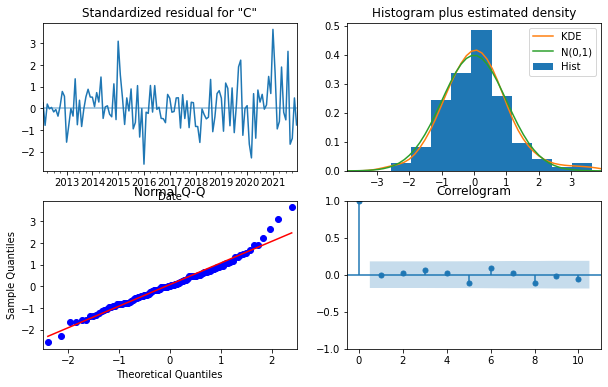

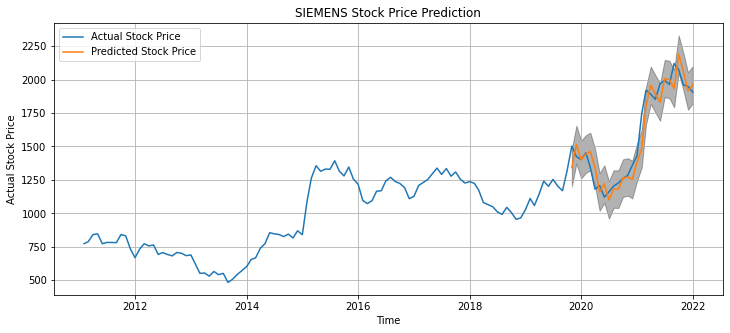

The Mean Squared Error is 10305.64
The root Mean Squared Error is 101.52


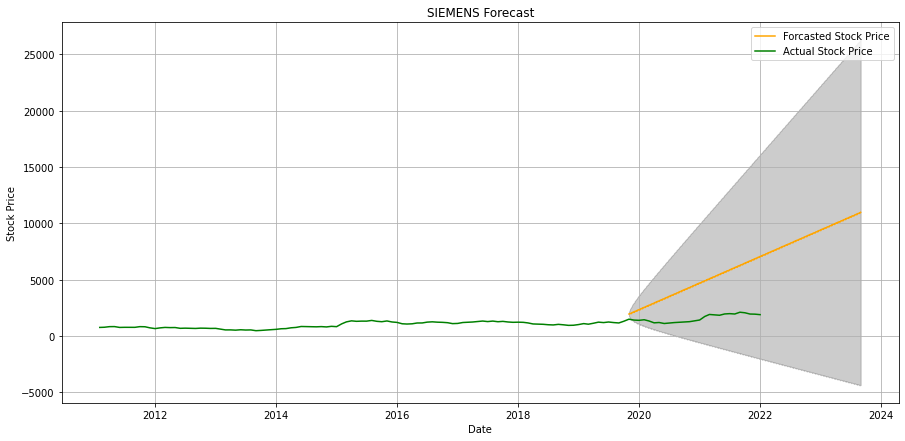

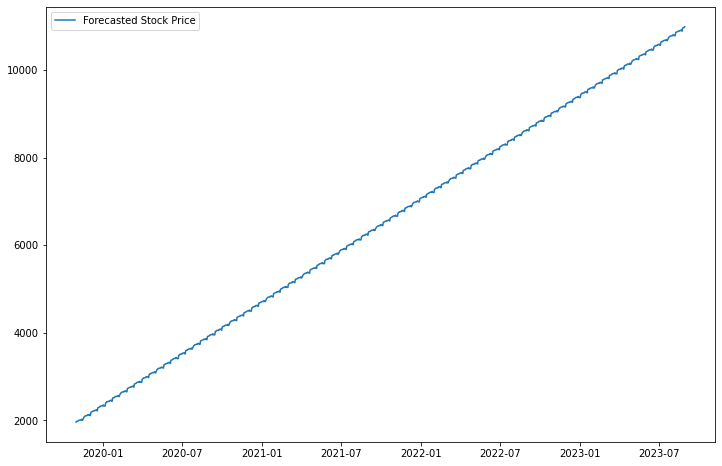

Epoch 1/50
2/2 [==============================] - 12s 210ms/step - loss: 0.4678
Epoch 2/50
2/2 [==============================] - 0s 184ms/step - loss: 0.2377
Epoch 3/50
2/2 [==============================] - 0s 182ms/step - loss: 0.0396
Epoch 4/50
2/2 [==============================] - 0s 182ms/step - loss: 0.1139
Epoch 5/50
2/2 [==============================] - 0s 189ms/step - loss: 0.0335
Epoch 6/50
2/2 [==============================] - 0s 190ms/step - loss: 0.0252
Epoch 7/50
2/2 [==============================] - 0s 181ms/step - loss: 0.0490
Epoch 8/50
2/2 [==============================] - 0s 182ms/step - loss: 0.0473
Epoch 9/50
2/2 [==============================] - 0s 192ms/step - loss: 0.0272
Epoch 10/50
2/2 [==============================] - 0s 169ms/step - loss: 0.0182
Epoch 11/50
2/2 [==============================] - 0s 176ms/step - loss: 0.0222
Epoch 12/50
2/2 [==============================] - 0s 200ms/step - loss: 0.0277
Epoch 13/50
2/2 [==============================]

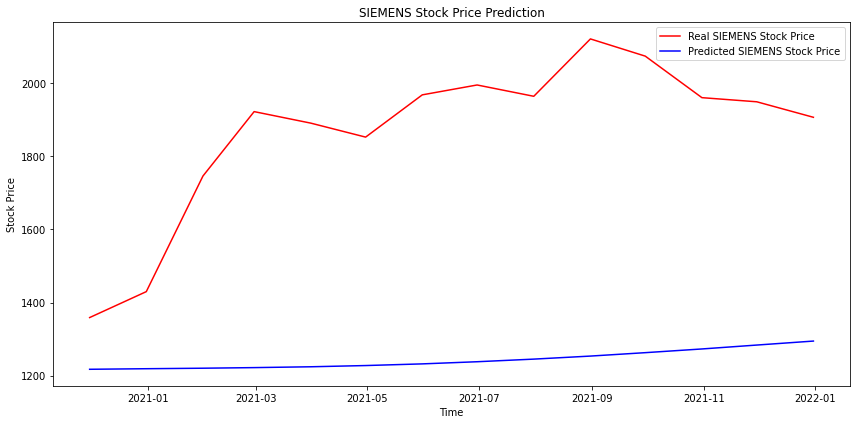

In [138]:
stock_market_prediction(NSE_data, symbol="SIEMENS", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### CAMS

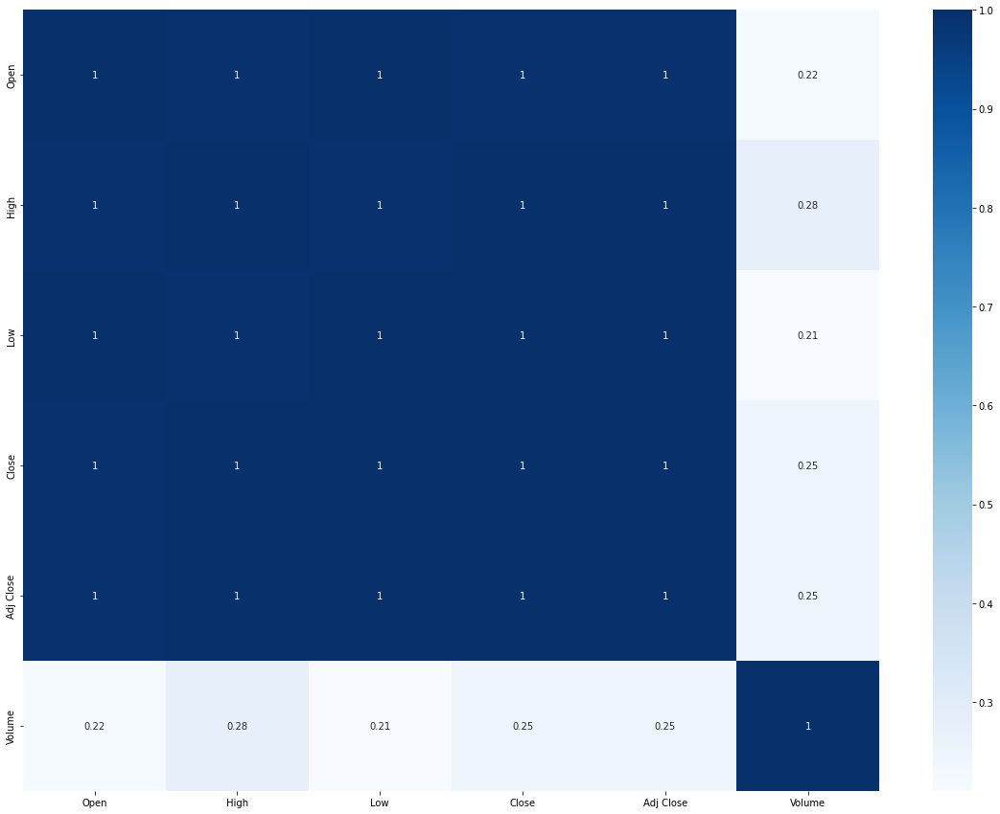

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-2.939403,0.040954,7,16,True,True


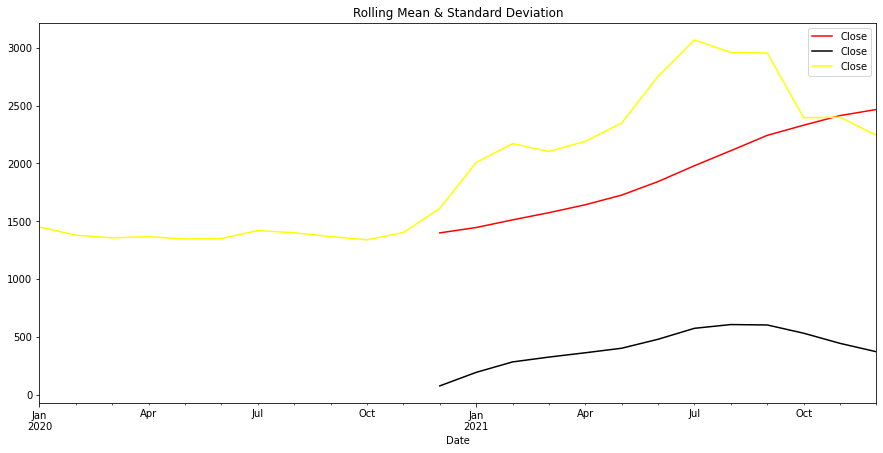

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

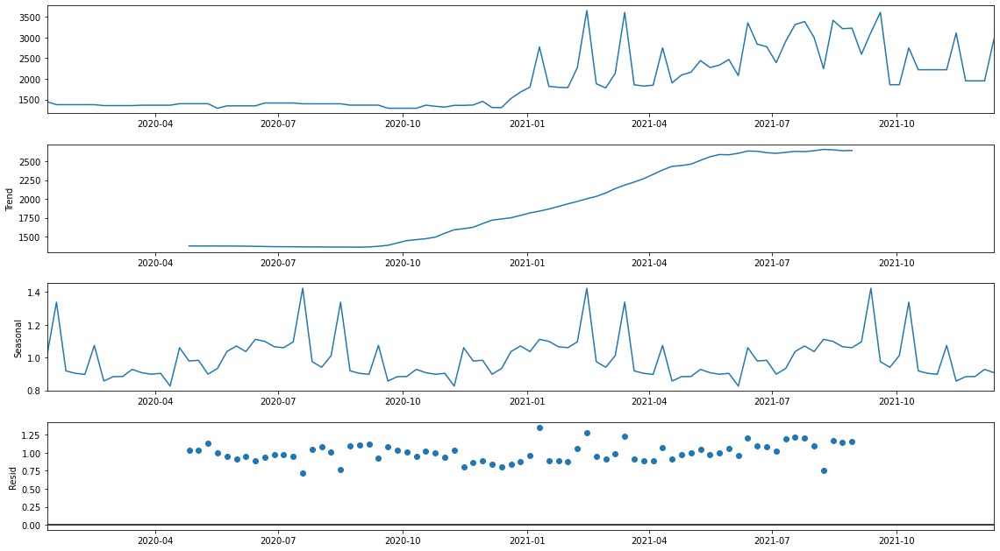

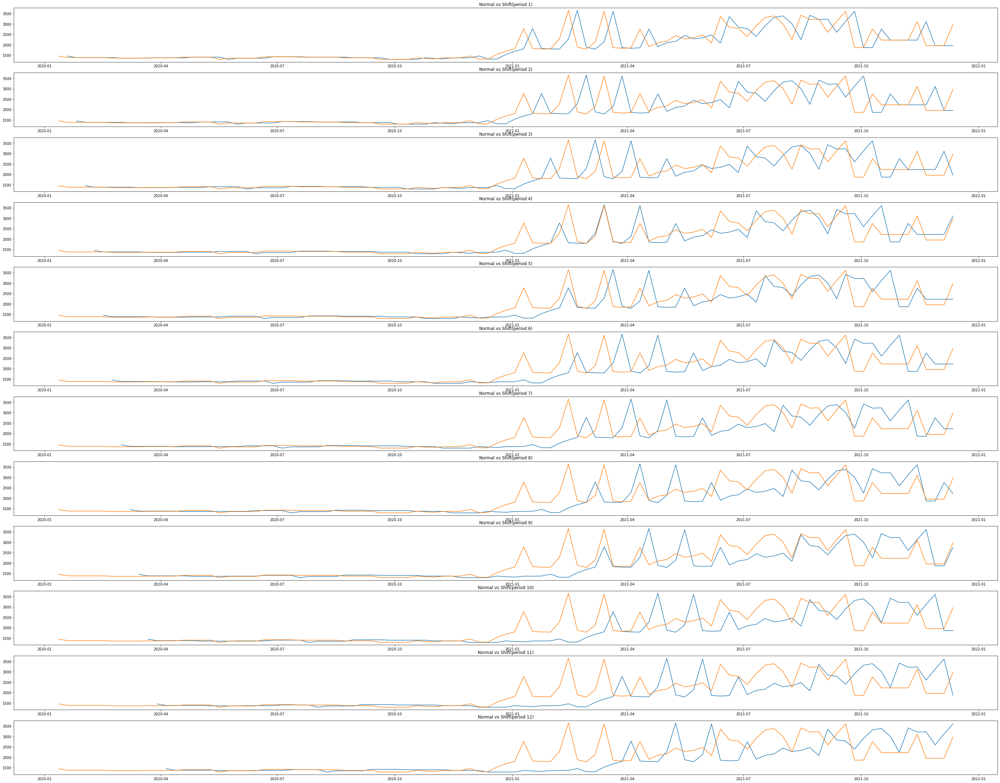

<Figure size 1080x504 with 0 Axes>

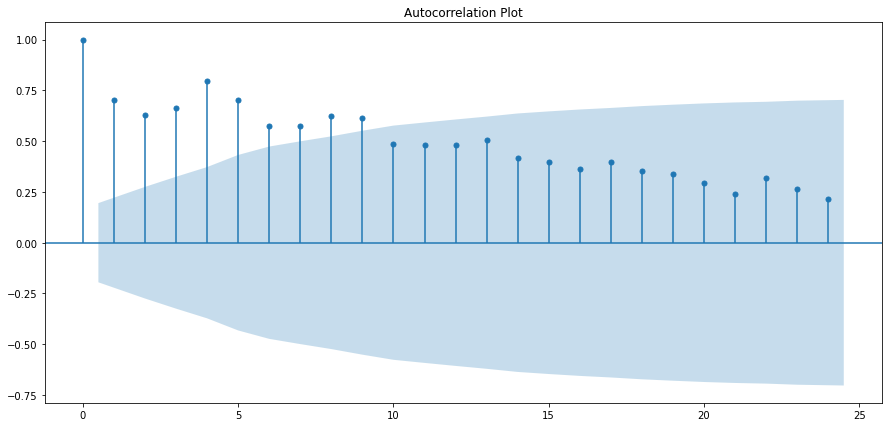

<Figure size 1080x504 with 0 Axes>

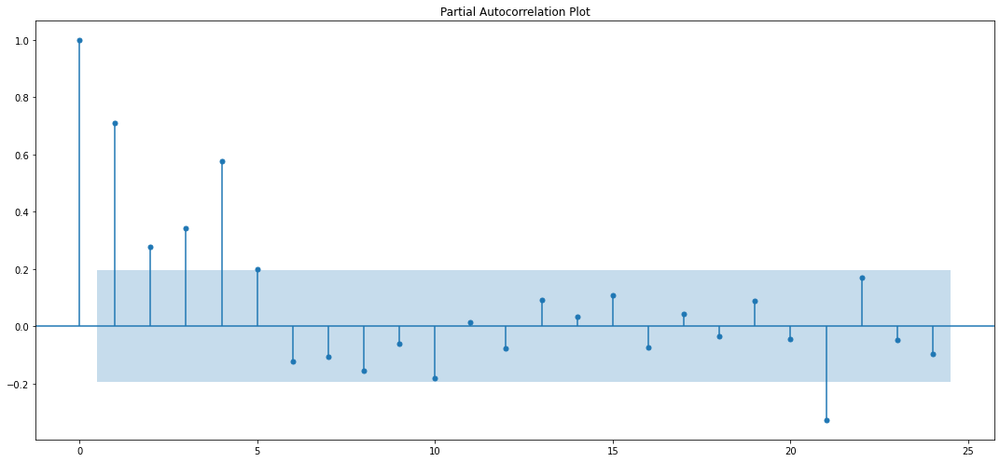

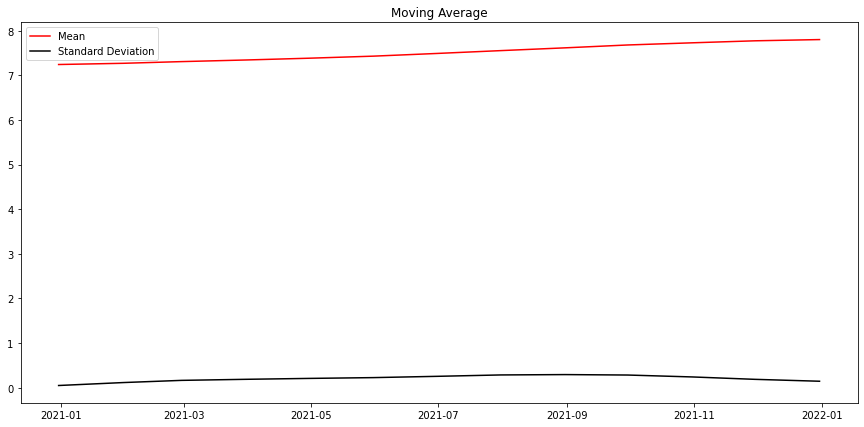

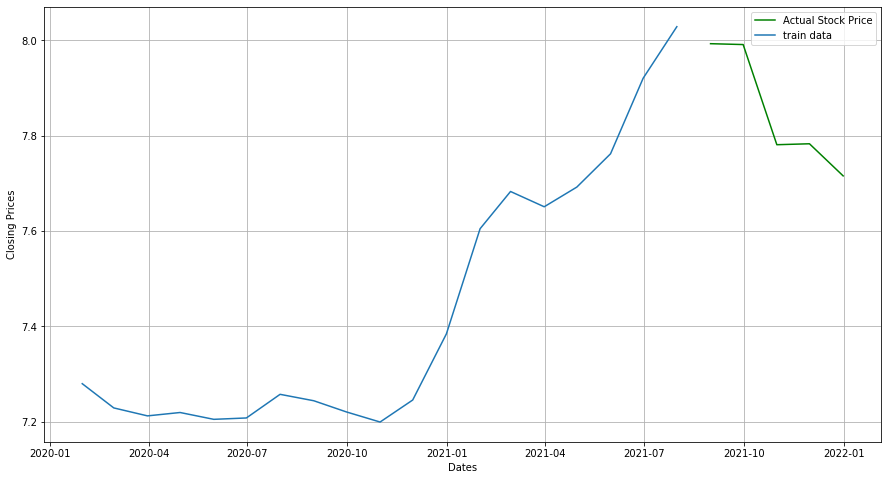

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 417.8713810202901
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 193.14904892479757
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 188.61989783391442
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 181.46596661647285
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 167.54999126579995
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 374.64697708467855
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 168.4306726543988
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 162.25348254221316
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 179.1956269824316
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 150.8529287197748
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 1, 1, 12):AIC calculated = 8.0
ARIMA 

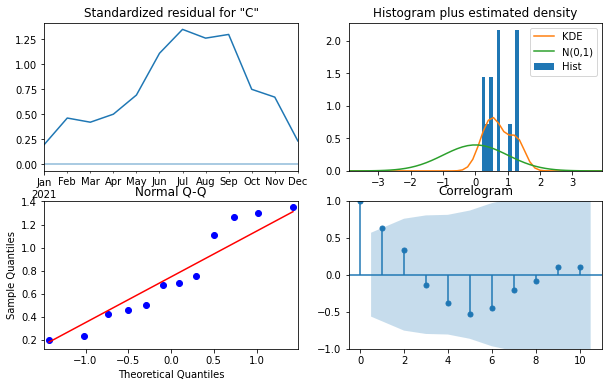

KeyError: 'The `start` argument could not be matched to a location related to the index of the data.'

In [165]:
stock_market_prediction(NSE_data, symbol="CAMS", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### PRINCEPIPE

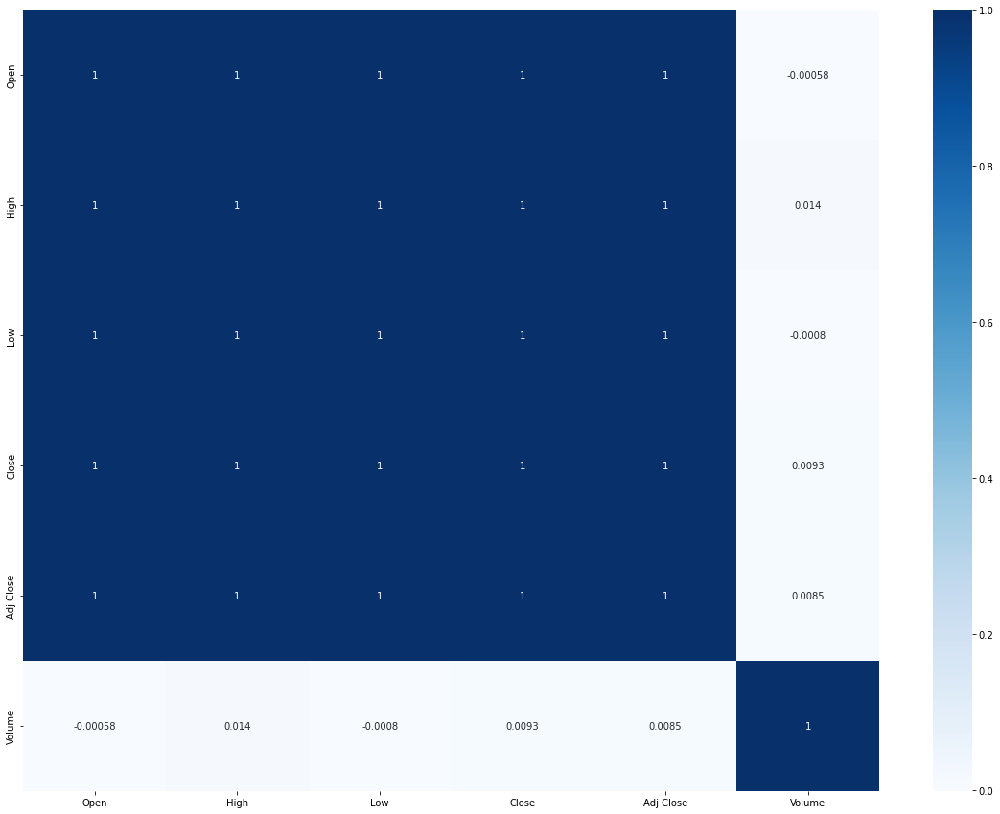

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-0.691233,0.849007,0,24,False,False


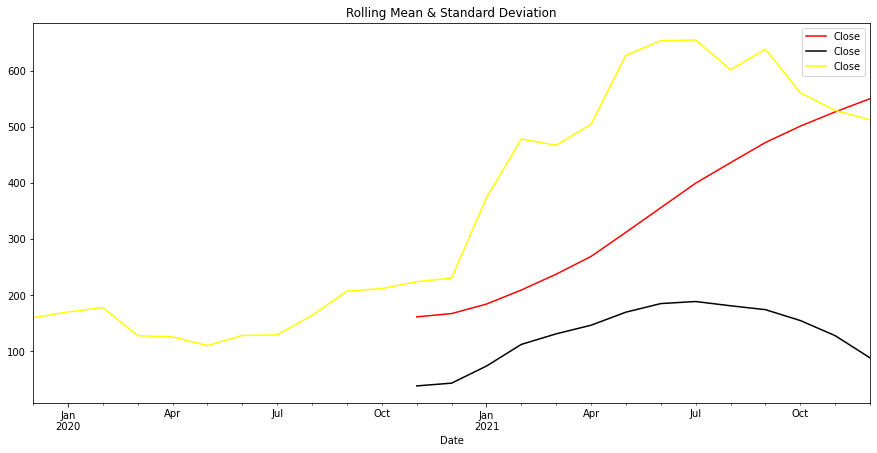

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

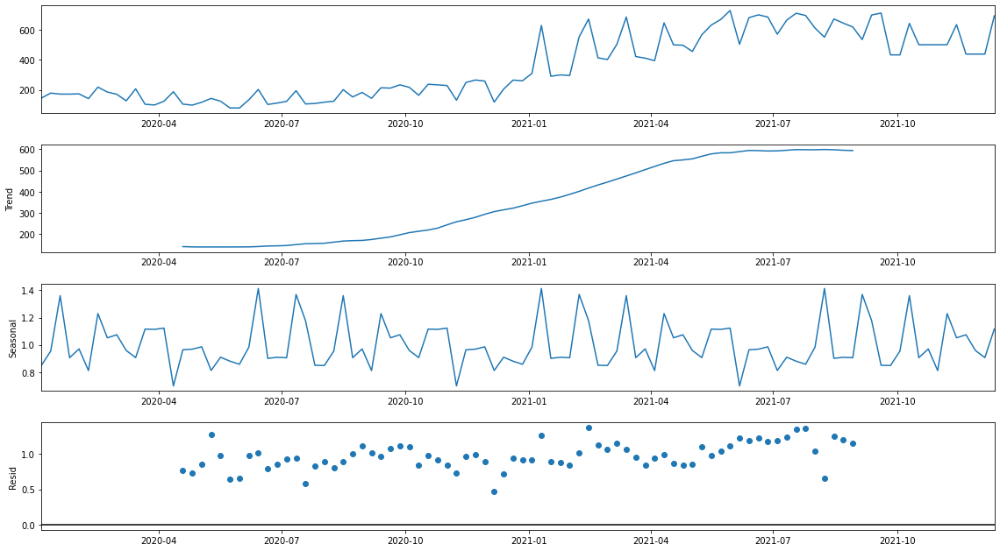

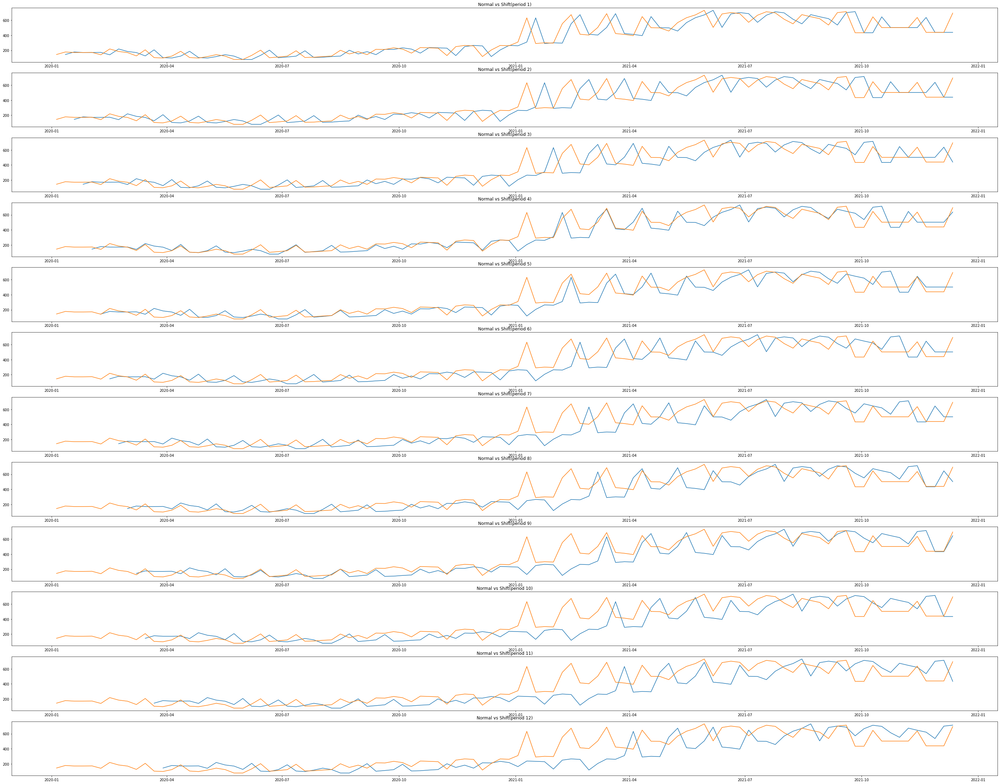

<Figure size 1080x504 with 0 Axes>

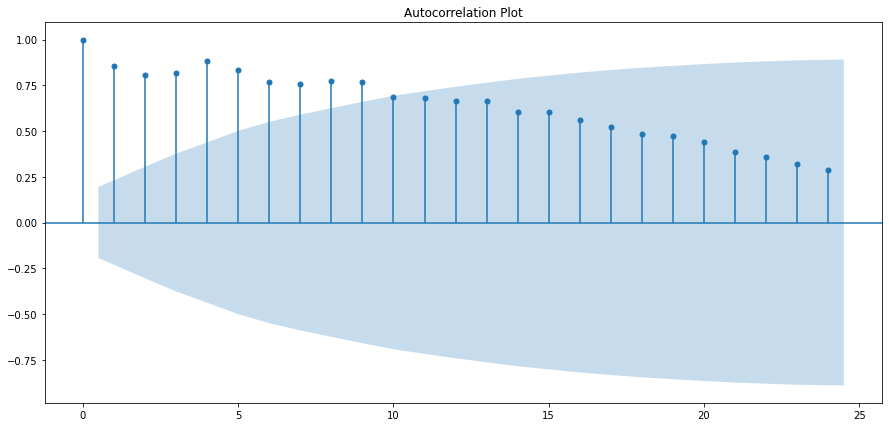

<Figure size 1080x504 with 0 Axes>

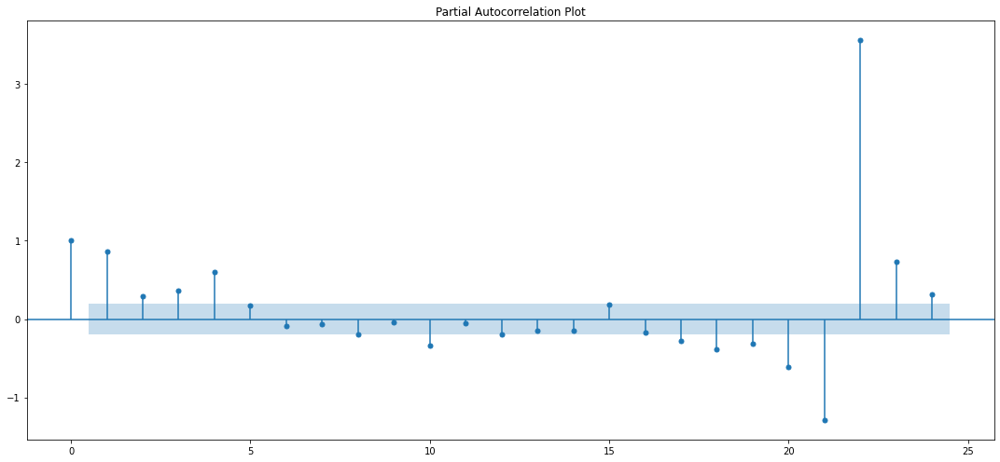

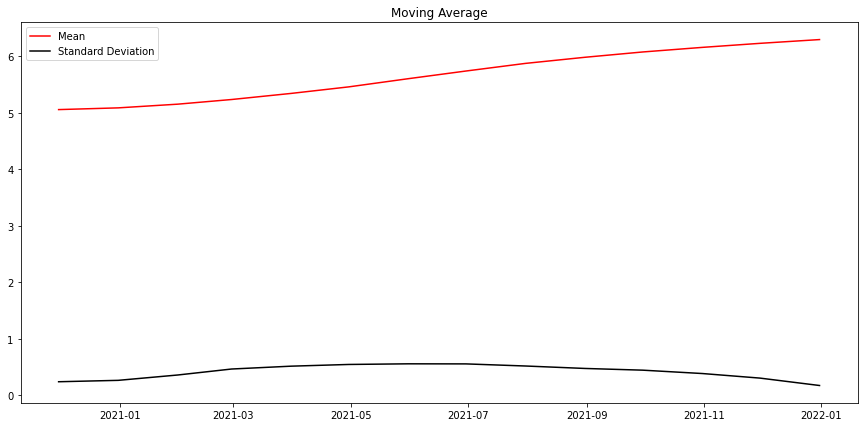

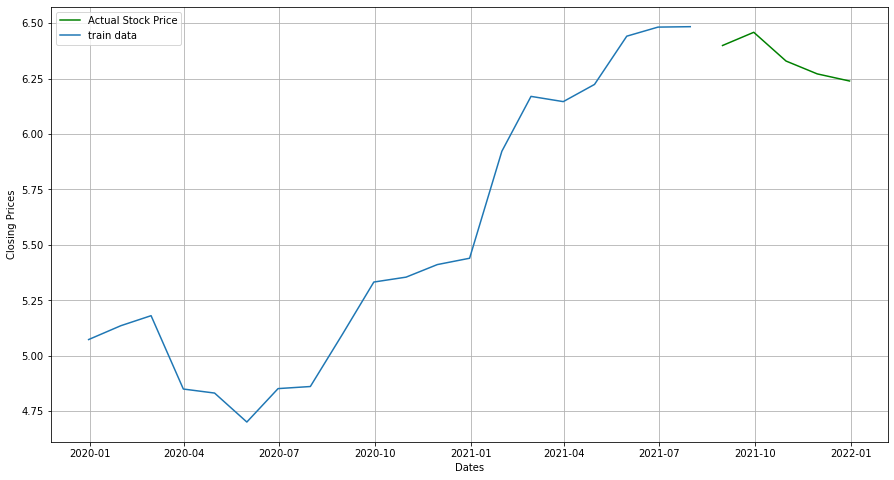

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 359.0927983352101
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 188.7707556945821
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 179.60475433031658
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 175.52099017486398
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 163.16094088084117
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = -13.094277234057905
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 319.62815808656137
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 163.964722427742
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 154.50599516548675
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 169.2500860921548
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 145.35359082418833
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = -8.201890693709165
ARIMA (0, 0, 1) x (1, 1, 1, 1

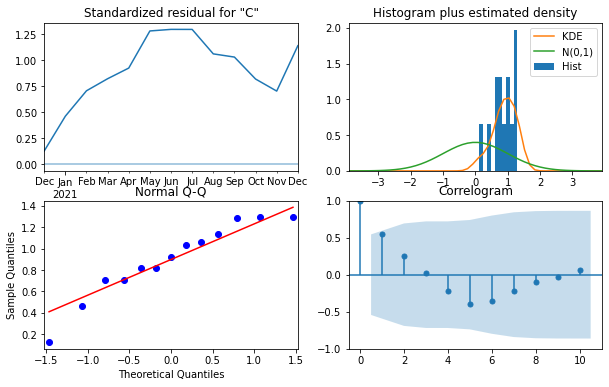

KeyError: 'The `start` argument could not be matched to a location related to the index of the data.'

In [162]:
stock_market_prediction(NSE_data, symbol="PRINCEPIPE", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1, date=False)

In [156]:
NSE_data.loc[NSE_data["Symbol"]=="PRINCEPIPE"]

,Symbol,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,,
2019-12-30,PRINCEPIPE,160.000000,177.899994,152.500000,166.899994,163.857697,21159947.0
2019-12-31,PRINCEPIPE,162.300003,167.399994,150.600006,152.449997,149.671097,5939748.0
2020-01-01,PRINCEPIPE,153.050003,159.500000,152.399994,155.850006,153.009125,3114230.0
2020-02-01,PRINCEPIPE,156.050003,158.699997,154.000000,155.699997,152.861832,1021302.0
2020-03-01,PRINCEPIPE,156.000000,156.000000,151.250000,151.899994,149.131119,623408.0
...,...,...,...,...,...,...,...
2021-09-09,PRINCEPIPE,700.900024,730.000000,699.000000,718.700012,718.700012,1189466.0
2021-09-13,PRINCEPIPE,728.000000,739.849976,720.900024,727.299988,727.299988,748374.0
2021-09-14,PRINCEPIPE,734.000000,734.000000,711.099976,715.049988,715.049988,444939.0


### SBICARD

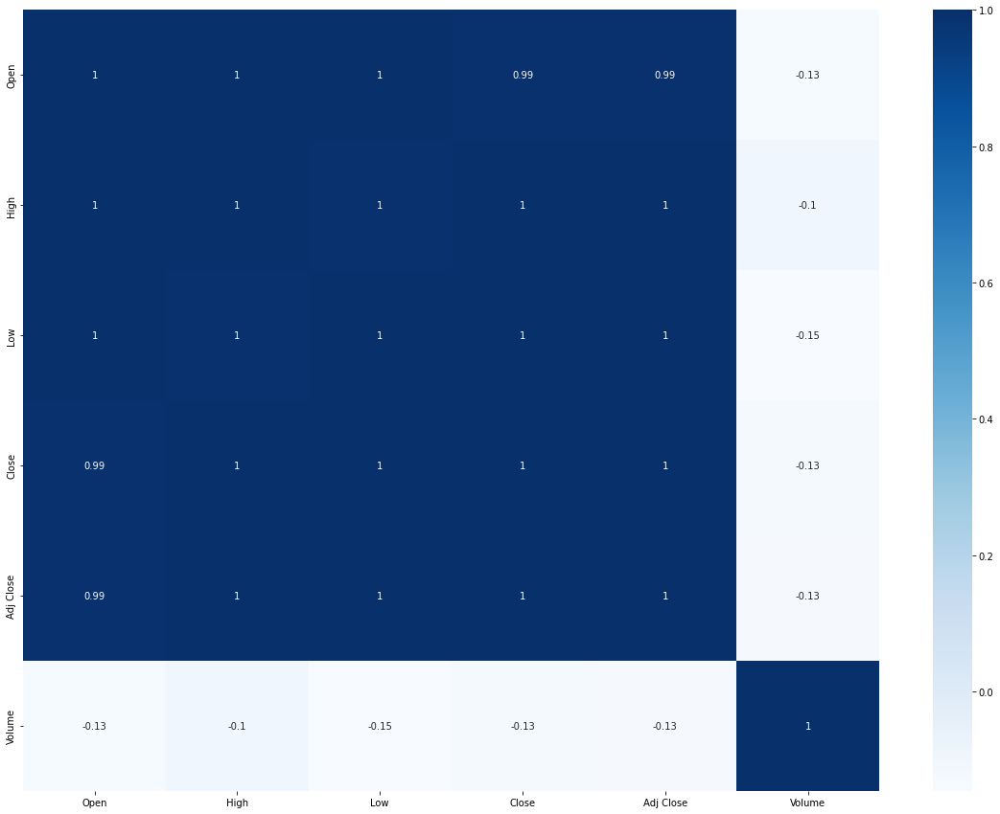

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.015173,0.74769,2,21,False,False


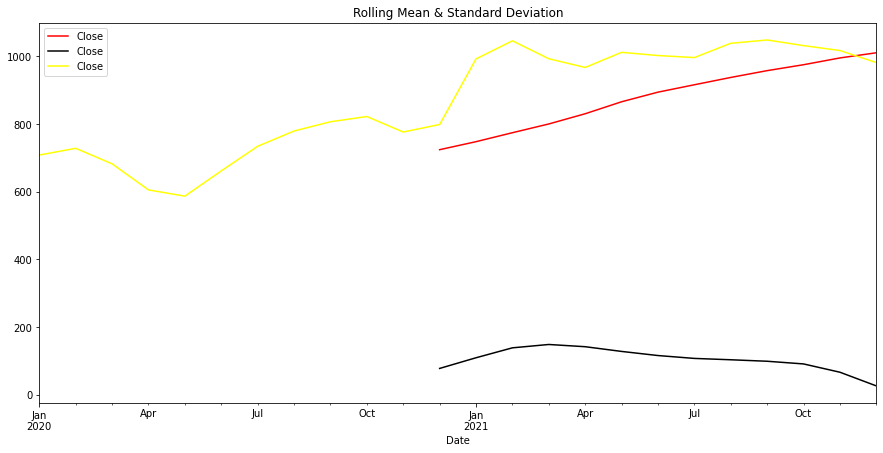

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

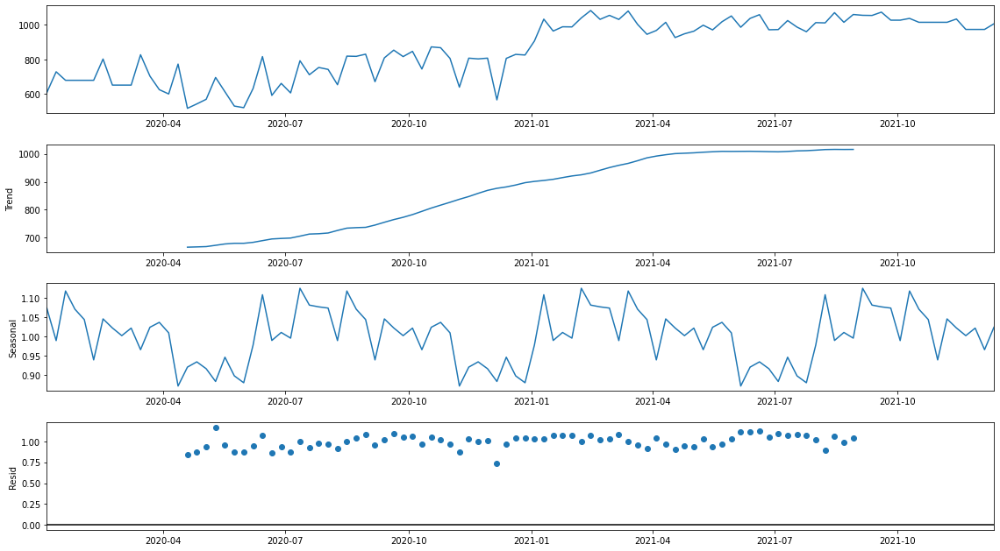

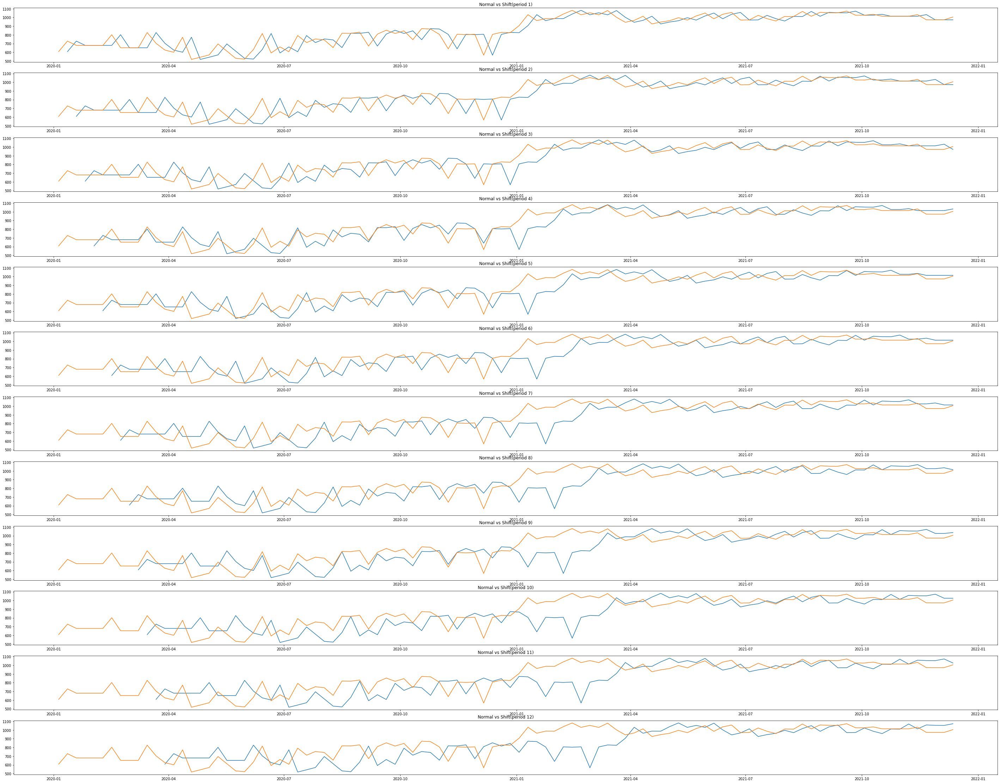

<Figure size 1080x504 with 0 Axes>

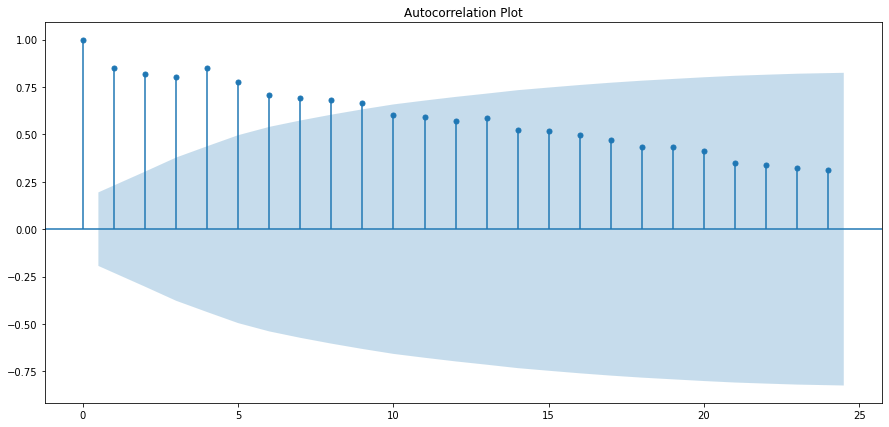

<Figure size 1080x504 with 0 Axes>

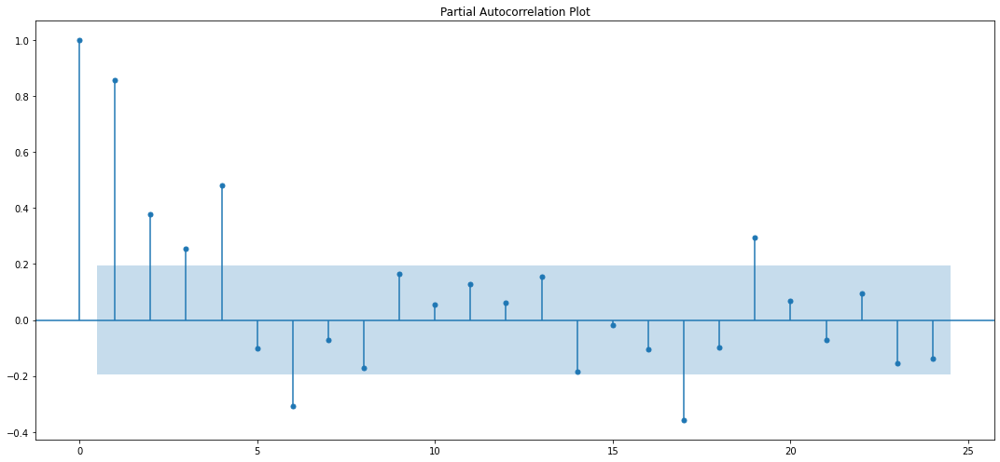

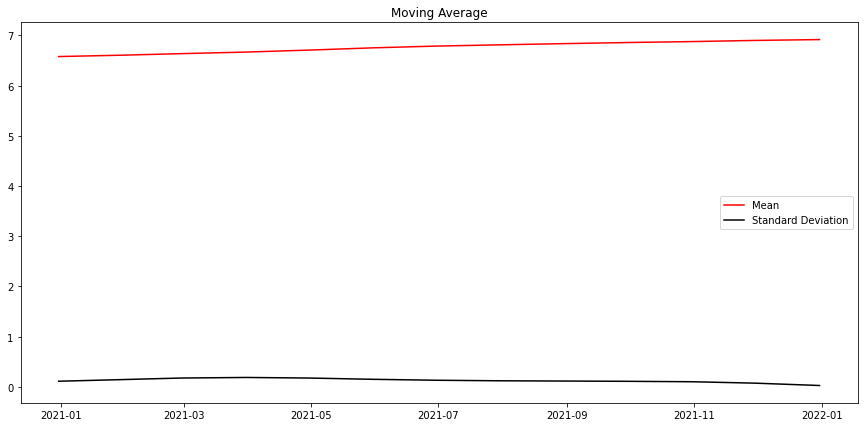

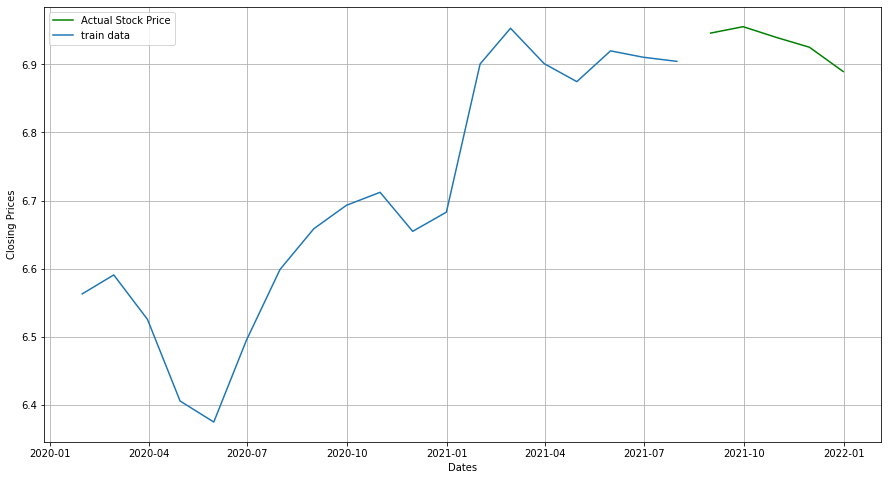

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 379.55371980742507
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 181.68987252259063
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 158.30437209859542
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 146.9220803487582
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 137.94929382524703
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 338.5128686307746
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 156.7578494211706
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 133.48224436676347
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 149.2363417083957
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 122.01983433042774
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 1, 1, 12):AIC calculated = 8.0
ARIMA 

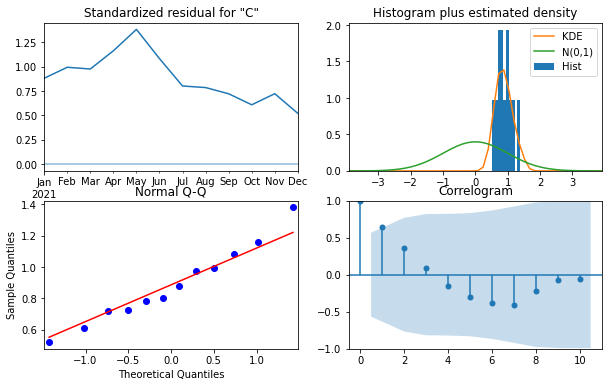

KeyError: 'The `start` argument could not be matched to a location related to the index of the data.'

In [163]:
stock_market_prediction(NSE_data, symbol="SBICARD", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)

### ROUTE

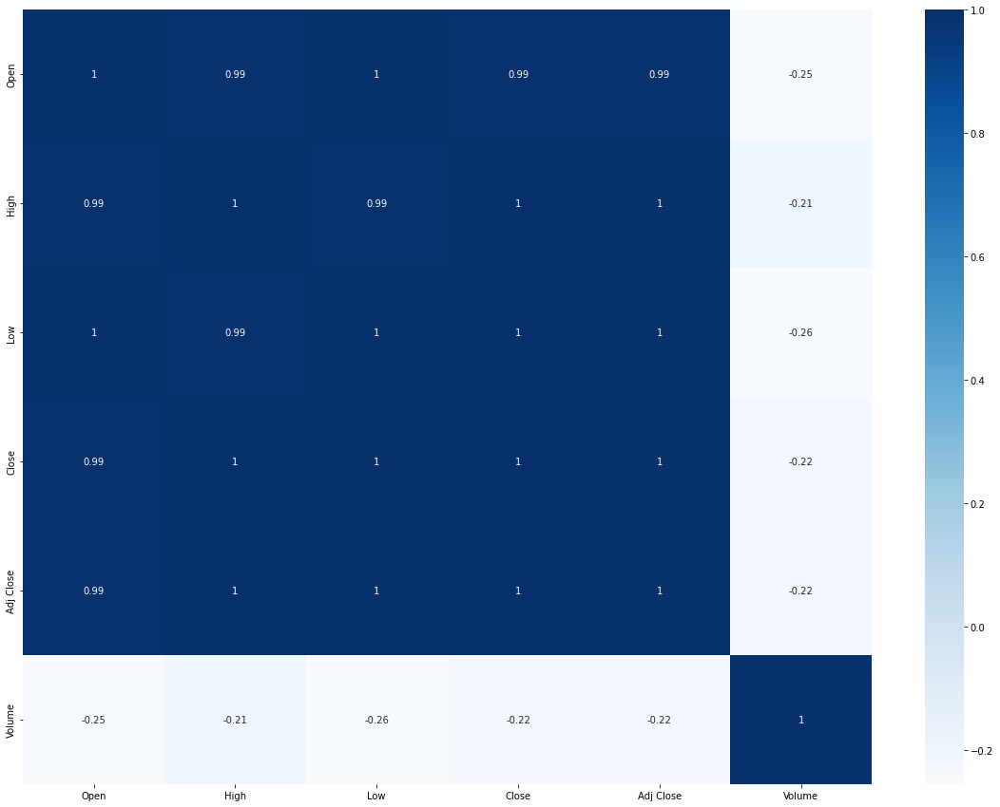

,Test Statistic,p-value,#Lags Used,No of Obs,p<0.05,Stationary?
Ad Fuller Result,-1.072823,0.725787,0,23,False,False


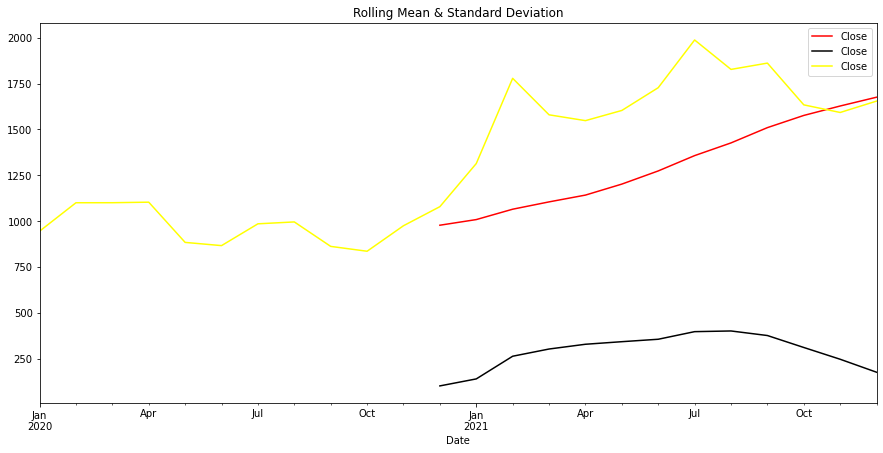

************************************************************
AUTOCORRELATION and PARTIAL AUTOCORRELATION
************************************************************


<Figure size 1080x504 with 0 Axes>

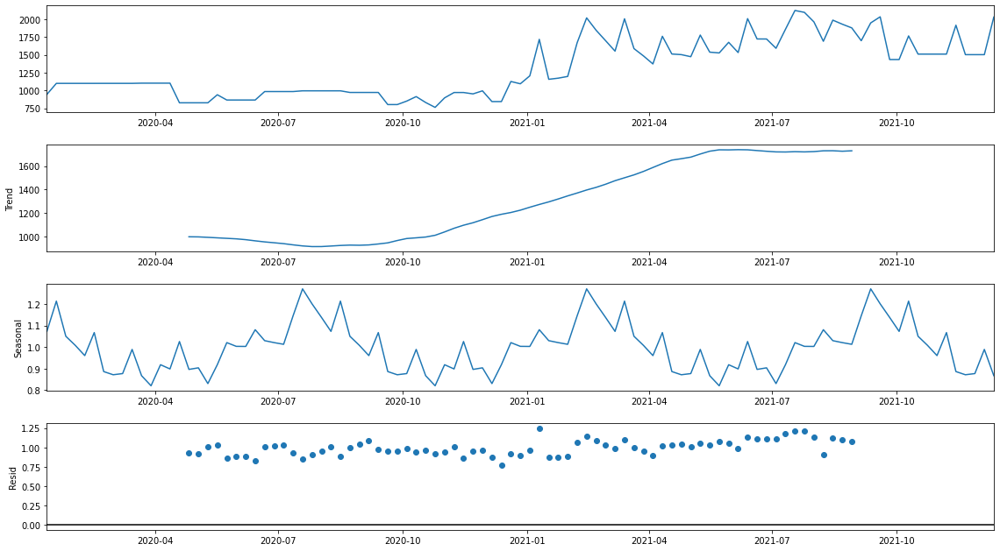

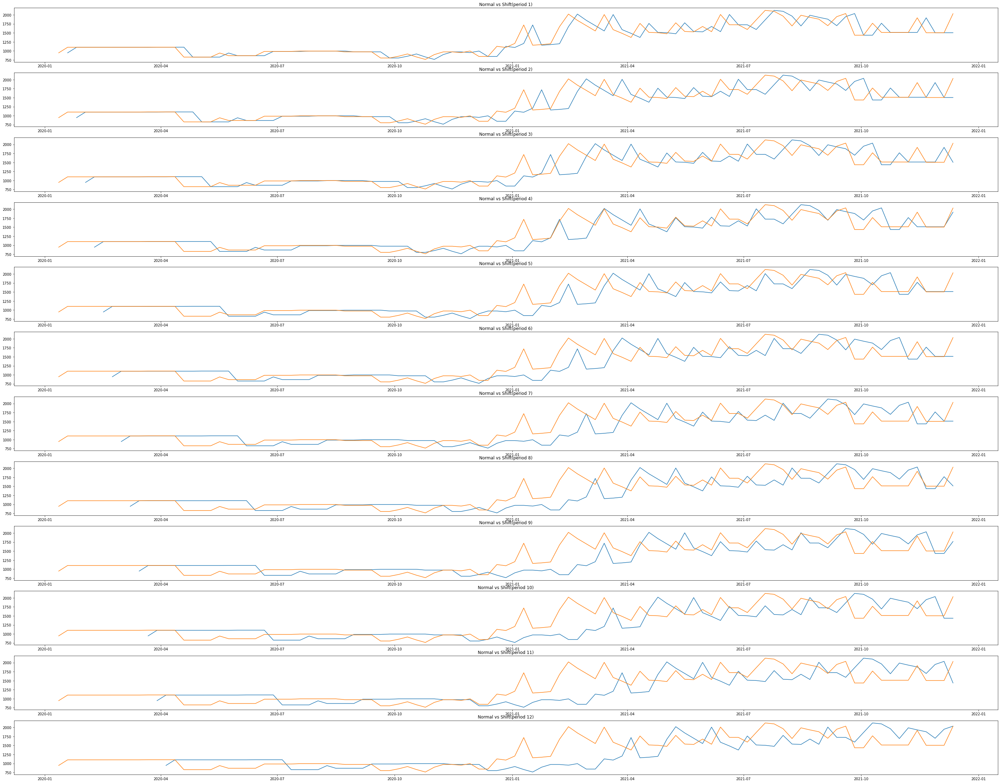

<Figure size 1080x504 with 0 Axes>

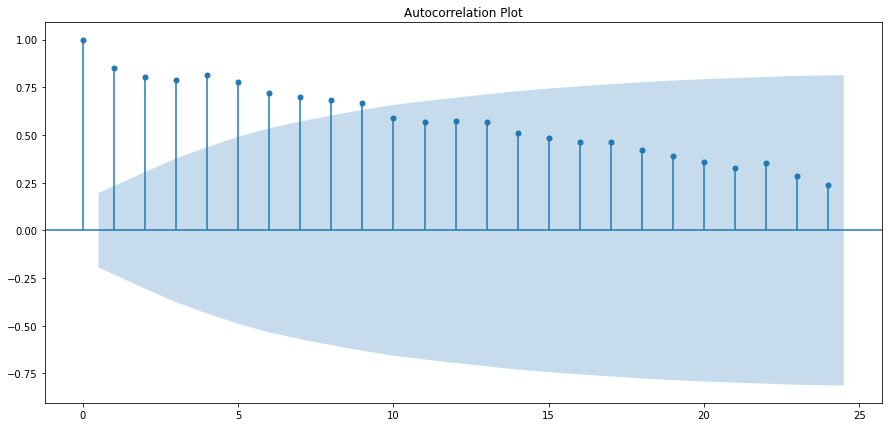

<Figure size 1080x504 with 0 Axes>

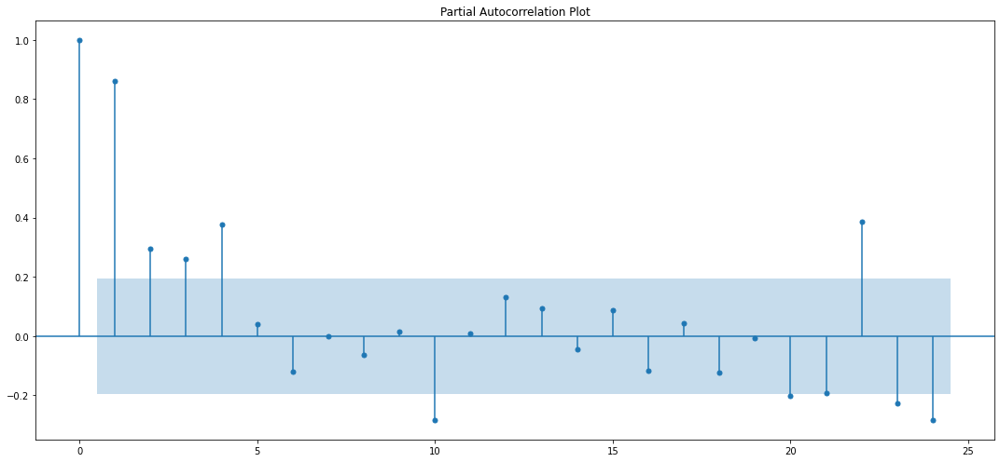

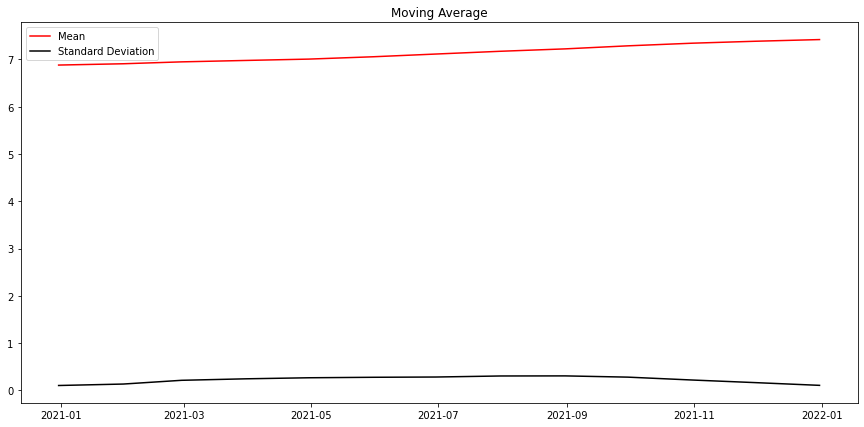

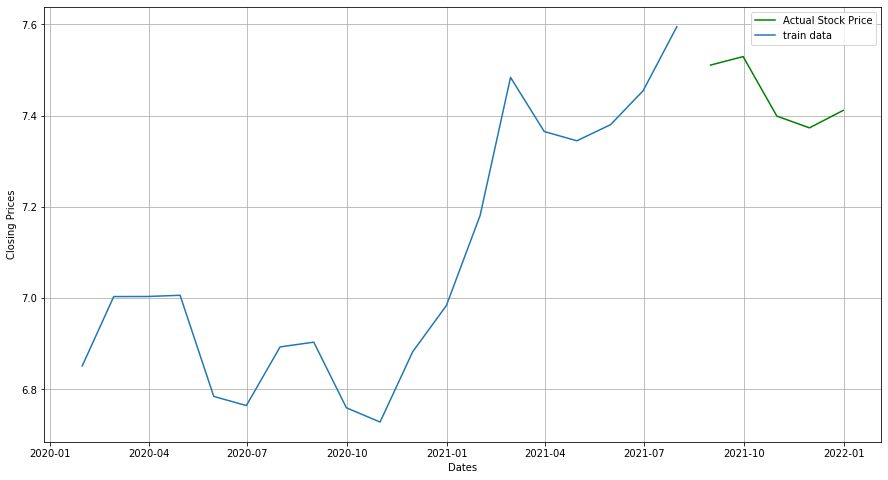

ARIMA (0, 0, 0) x (0, 0, 0, 12):AIC calculated = 400.33339877343633
ARIMA (0, 0, 0) x (0, 0, 1, 12):AIC calculated = 189.35056515550124
ARIMA (0, 0, 0) x (0, 1, 0, 12):AIC calculated = 178.87962703316995
ARIMA (0, 0, 0) x (0, 1, 1, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 0, 0, 12):AIC calculated = 170.02112558854145
ARIMA (0, 0, 0) x (1, 0, 1, 12):AIC calculated = 157.65473438301308
ARIMA (0, 0, 0) x (1, 1, 0, 12):AIC calculated = 4.0
ARIMA (0, 0, 0) x (1, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (0, 0, 0, 12):AIC calculated = 358.4755751747034
ARIMA (0, 0, 1) x (0, 0, 1, 12):AIC calculated = 164.25710190846723
ARIMA (0, 0, 1) x (0, 1, 0, 12):AIC calculated = 153.39815091100476
ARIMA (0, 0, 1) x (0, 1, 1, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 0, 0, 12):AIC calculated = 167.6415721155475
ARIMA (0, 0, 1) x (1, 0, 1, 12):AIC calculated = 147.13090823162693
ARIMA (0, 0, 1) x (1, 1, 0, 12):AIC calculated = 6.0
ARIMA (0, 0, 1) x (1, 1, 1, 12):AIC calculated = 8.0
ARIM

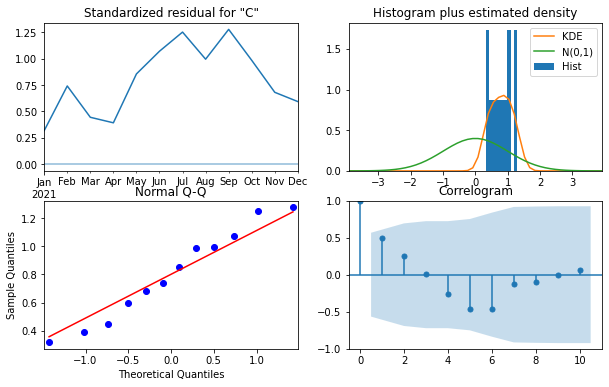

KeyError: 'The `start` argument could not be matched to a location related to the index of the data.'

In [164]:
stock_market_prediction(NSE_data, symbol="ROUTE", heatmap=1, stationarity=1, decompose=1, ac=1, log_plot=1, best_params=1, arma_model=1, sarimax=1, lstm=1, test=1)